<a href="https://colab.research.google.com/github/Samsomyajit/windpulse/blob/main/meintanance_wpd.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

[OK] Tuticorin: computed matrices at hub=100.0 m
[OK] Ahmedabad: computed matrices at hub=100.0 m
[OK] Calcutta: computed matrices at hub=100.0 m
[OK] Madras: computed matrices at hub=100.0 m
[OK] Mormugao: computed matrices at hub=100.0 m
[OK] Jaipur: computed matrices at hub=100.0 m


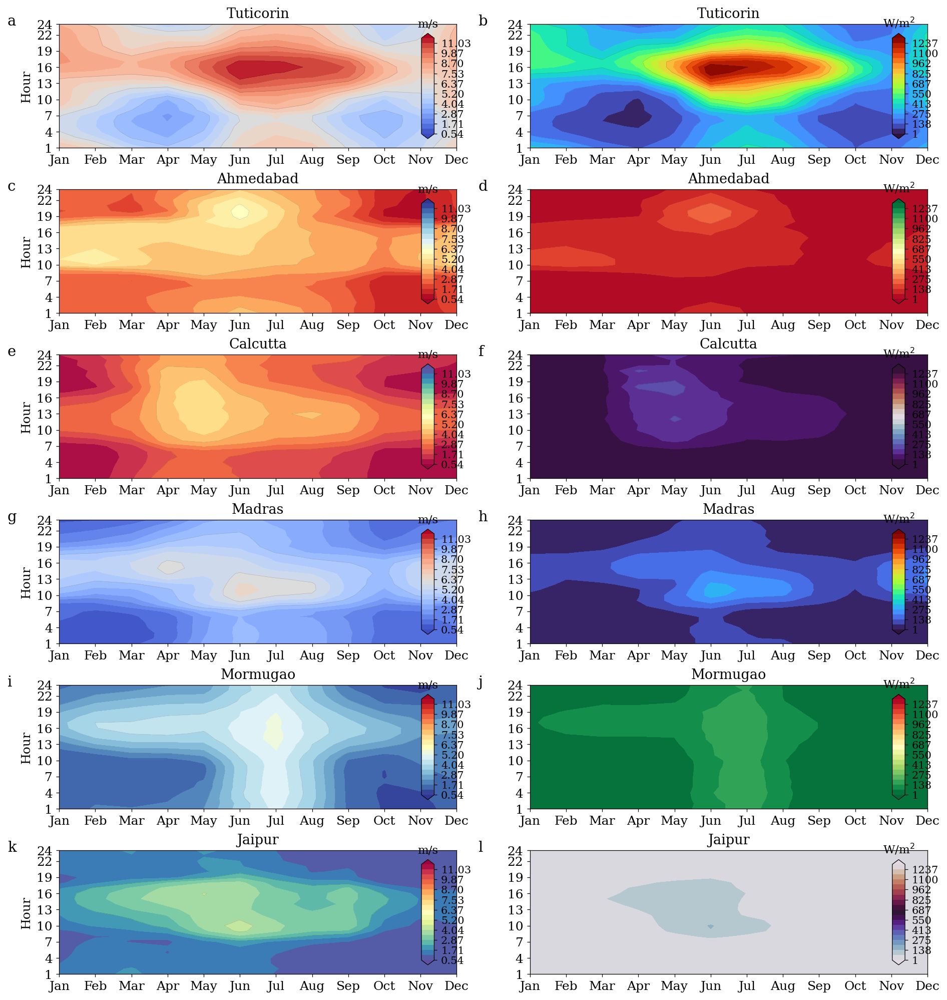

Saved: contour_MWS_WPD_100m.png and contour_MWS_WPD_100m.pdf


In [13]:
# ==========================================
# (1) Colab setup: install + upload files
# ==========================================
!pip -q install openpyxl scipy python-docx

from google.colab import files
uploaded = files.upload()  # upload your .xlsx files (and others if needed)

# ==========================================
# (2) Imports + global style (no bold)
# ==========================================
import os, re, math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.special import gamma
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# Global plotting style (clean, readable, not bold)
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 12,
    "axes.titleweight": "normal",
    "axes.labelweight": "normal",
    "axes.linewidth": 0.6,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "xtick.major.size": 3,
    "ytick.major.size": 3,
    "figure.dpi": 150
})

MONTH_LABELS = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]

# ==========================================
# (3) Loader for IMD Excel format
#     expects columns: YEAR, MN, DT, S01..S24
# ==========================================
def load_imd_excel(path, sheet_name=None):
    xls = pd.ExcelFile(path)
    if sheet_name is None:
        sheet_name = xls.sheet_names[0]

    df = pd.read_excel(path, sheet_name=sheet_name, header=1)

    # detect hour columns S01..S24
    hour_cols = [c for c in df.columns if re.fullmatch(r"S\d{2}", str(c))]
    hour_cols = sorted(hour_cols, key=lambda s: int(s[1:]))

    required = {"YEAR","MN","DT"}
    if not required.issubset(set(df.columns)):
        raise ValueError(f"{path} missing required columns {required}. Found: {df.columns.tolist()[:20]}")

    # keep only needed columns
    keep = ["YEAR","MN","DT"] + hour_cols
    df = df[keep].copy()

    # numeric clean
    for c in hour_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")

    df["MN"] = pd.to_numeric(df["MN"], errors="coerce").astype("Int64")
    return df, hour_cols

# ==========================================
# (4) Core math (per manuscript)
#     - EPF = mean(v^3) / mean(v)^3         (Eq. 3 concept)
#     - k  = 1 + 3.69 / EPF^2               (Eq. 4)
#     - c  = mean(v) / Gamma(1+1/k)         (Eq. 6 via Eq. 14)
#     - WPD = 0.5*rho*c^3*Gamma(1+3/k)      (Eq. 13)
#     - MWS = c*Gamma(1+1/k) (== mean(v))   (Eq. 14)
# ==========================================
def month_hour_weibull_mws_wpd(
    df, hour_cols,
    hub_height_m=100.0,
    ref_height_m=10.0,
    alpha=0.14,
    rho=1.225,
    input_unit="kmh"  # your files are km/h
):
    scale_hub = (hub_height_m / ref_height_m) ** alpha

    # output matrices: rows = hour(1..24), cols = month(1..12)
    MWS = np.full((24, 12), np.nan, dtype=float)
    WPD = np.full((24, 12), np.nan, dtype=float)
    K   = np.full((24, 12), np.nan, dtype=float)
    C   = np.full((24, 12), np.nan, dtype=float)
    EPF = np.full((24, 12), np.nan, dtype=float)
    N   = np.zeros((24, 12), dtype=int)

    for mi, m in enumerate(range(1, 13)):
        dfm = df[df["MN"] == m]
        for hi, hcol in enumerate(hour_cols):  # hi=0..23 maps to hour 1..24
            v = dfm[hcol].to_numpy(dtype=float)
            v = v[np.isfinite(v)]
            if v.size < 20:
                continue

            # convert to m/s if needed
            if input_unit.lower() == "kmh":
                v = v / 3.6

            # hub-height scaling (power law)
            v = v * scale_hub

            mv = np.mean(v)
            if mv <= 1e-12:
                continue

            epf = np.mean(v**3) / (mv**3)
            if not np.isfinite(epf) or epf <= 0:
                continue

            k = 1.0 + 3.69 / (epf**2)  # Eq. (4)

            # c from mean wind speed relation (Eq. 14 rearranged)
            c = mv / gamma(1.0 + 1.0 / k)

            # WPD from Weibull (Eq. 13)
            wpd = 0.5 * rho * (c**3) * gamma(1.0 + 3.0 / k)

            MWS[hi, mi] = mv
            WPD[hi, mi] = wpd
            K[hi, mi]   = k
            C[hi, mi]   = c
            EPF[hi, mi] = epf
            N[hi, mi]   = v.size

    return {
        "MWS": MWS, "WPD": WPD, "k": K, "c": C, "epf": EPF, "n": N,
        "hub_height_m": hub_height_m, "alpha": alpha, "rho": rho
    }

# ==========================================
# (5) Plotting: contour panels (rows = cities, cols = metrics)
#     - panel labels outside
#     - no titles except city names
#     - vertical shorter colorbar with unit on top
#     - clean ticks, no bold
# ==========================================
def plot_city_metric_grid(
    results_by_city,
    out_png="contour_mws_wpd.png",
    out_pdf="contour_mws_wpd.pdf",
    cmaps=None,
    shared_scales=True,
    levels=18
):
    cities = list(results_by_city.keys())
    nrows = len(cities)
    ncols = 2  # MWS, WPD

    # X,Y grid for contour
    x = np.arange(1, 13)      # months
    y = np.arange(1, 25)      # hours 1..24
    X, Y = np.meshgrid(x, y)

    # shared color ranges (better comparison)
    all_mws = np.concatenate([results_by_city[c]["MWS"].ravel() for c in cities])
    all_wpd = np.concatenate([results_by_city[c]["WPD"].ravel() for c in cities])
    mws_min, mws_max = np.nanmin(all_mws), np.nanmax(all_mws)
    wpd_min, wpd_max = np.nanmin(all_wpd), np.nanmax(all_wpd)

    fig_h = max(6, 2.2 * nrows)
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12.5, fig_h), constrained_layout=True)

    # ensure axes is 2D
    if nrows == 1:
        axes = np.array([axes])

    # colormap cycle
    if cmaps is None:
        cmaps = [
            "coolwarm","turbo","RdYlBu","RdYlGn","Spectral","twilight_shifted",
            "coolwarm","turbo","RdYlBu_r","RdYlGn_r","Spectral_r","twilight"
        ]

    panel_labels = [chr(ord('a') + i) for i in range(nrows * ncols)]
    pi = 0

    for ri, city in enumerate(cities):
        R = results_by_city[city]
        for ci, metric in enumerate(["MWS", "WPD"]):
            ax = axes[ri, ci]

            Z = R[metric]
            if metric == "MWS":
                vmin, vmax = (mws_min, mws_max) if shared_scales else (np.nanmin(Z), np.nanmax(Z))
                unit = "m/s"
            else:
                vmin, vmax = (wpd_min, wpd_max) if shared_scales else (np.nanmin(Z), np.nanmax(Z))
                unit = "W/m$^2$"

            cmap = cmaps[pi % len(cmaps)]

            # Contours
            lv = np.linspace(vmin, vmax, levels)
            cf = ax.contourf(X, Y, Z, levels=lv, cmap=cmap, extend="both")
            ax.contour(X, Y, Z, levels=lv[::3], colors="k", linewidths=0.25, alpha=0.25)

            # City name only (no metric titles)
            ax.set_title(city, fontsize=13, pad=6, fontweight="normal")

            # ticks
            ax.set_xticks(np.arange(1, 13))
            ax.set_xticklabels(MONTH_LABELS)
            ax.set_yticks([1, 4, 7, 10, 13, 16, 19, 22, 24])
            ax.set_xlim(1, 12)
            ax.set_ylim(1, 24)

            # axis labels only on outer edges (clean)
            if ri == nrows - 1:
                ax.set_xlabel("")
            else:
                ax.set_xlabel("")
            if ci == 0:
                ax.set_ylabel("Hour", fontsize=12)
            else:
                ax.set_ylabel("")

            # panel label outside top-left
            ax.text(
                -0.13, 1.08, panel_labels[pi],
                transform=ax.transAxes, fontsize=14,
                va="top", ha="left"
            )

            # shorter vertical colorbar on the right side
            cax = inset_axes(ax, width="3.2%", height="85%", loc="center right", borderpad=1.8)
            cb = fig.colorbar(cf, cax=cax, orientation="vertical")
            cb.ax.set_title(unit, fontsize=11, pad=6)
            cb.outline.set_linewidth(0.6)
            cb.ax.tick_params(labelsize=10, width=0.6, length=3)

            # spine thickness
            for s in ax.spines.values():
                s.set_linewidth(0.6)

            pi += 1

    fig.savefig(out_png, dpi=600, bbox_inches="tight")
    fig.savefig(out_pdf, dpi=600, bbox_inches="tight")
    plt.show()

    print("Saved:", out_png, "and", out_pdf)

# ==========================================
# (6) Configure your sites here
#     Add the other 3 site files exactly like these two.
# ==========================================
SITES = {
    "Madras":   {"path": "MADRAS-2-43279 (1) (1).xlsx",  "sheet": "wind_43279"},
    "Mormugao": {"path": "MORMUGAO-43196 (2) (1).xlsx",  "sheet": "wind_43196"},
    "Tuticorin": {"path": "TUTICORIN H.P.-15208 (5).xlsx", "sheet": "wind_15208"},
    "Ahmedabad": {"path": "ahamdabad new wind_42647 (1).xlsx", "sheet": "wind_42647"},
    "Calcutta":  {"path": "Calcutta new-42809 (1).xlsx", "sheet": "Sheet1"},
}

# ==========================================
# (7) Run: compute + plot
# ==========================================
HUB_HEIGHT = 100.0   # change if needed
ALPHA = 0.14
RHO = 1.225

results_by_city = {}
for city, meta in SITES.items():
    if not os.path.exists(meta["path"]):
        print(f"[Skip] missing file for {city}: {meta['path']}")
        continue

    df, hour_cols = load_imd_excel(meta["path"], sheet_name=meta.get("sheet"))
    R = month_hour_weibull_mws_wpd(
        df, hour_cols,
        hub_height_m=HUB_HEIGHT,
        ref_height_m=10.0,
        alpha=ALPHA,
        rho=RHO,
        input_unit="kmh"
    )
    results_by_city[city] = R
    print(f"[OK] {city}: computed matrices at hub={HUB_HEIGHT} m")

# plot (rows=cities, cols=[MWS,WPD])
plot_city_metric_grid(
    results_by_city,
    out_png=f"contour_MWS_WPD_{int(HUB_HEIGHT)}m.png",
    out_pdf=f"contour_MWS_WPD_{int(HUB_HEIGHT)}m.pdf",
    shared_scales=True,
    levels=20
)


In [11]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

MONTH_LABELS = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]

def _outside_short_cbar(fig, ax, mappable, unit, height="84%", width="3.0%", pad_x=0.040, pad_y=0.08):
    cax = inset_axes(
        ax,
        width=width,
        height=height,
        loc="lower left",
        bbox_to_anchor=(1.0 + pad_x, pad_y, 1, 1),
        bbox_transform=ax.transAxes,
        borderpad=0.0
    )
    cb = fig.colorbar(mappable, cax=cax, orientation="vertical")
    cb.ax.set_title(unit, fontsize=12, pad=6)
    cb.outline.set_linewidth(0.6)
    cb.ax.tick_params(labelsize=10, width=0.6, length=3)
    return cb

def plot_all_sites_spacy(
    results_by_city,
    out_png="Contours_MWS_WPD_spacy.png",
    out_pdf="Contours_MWS_WPD_spacy.pdf",
    levels=28,                 # more detail
    shared_scale=True,
    row_height=2.55,           # <-- increase this for more vertical space
    fig_width=15.5,            # a bit wider helps months readability
    hspace=0.50,               # vertical spacing
    wspace=0.32,               # horizontal spacing (room for outside cbars)
    add_isolines=True
):
    cities = list(results_by_city.keys())
    nrows = len(cities)

    # colormaps per row (left=MWS, right=WPD)
    cmaps_mws = ["coolwarm","turbo","RdYlBu","RdYlGn","Spectral","twilight_shifted",
                 "coolwarm","turbo","RdYlBu_r","RdYlGn_r"]
    cmaps_wpd = ["coolwarm","turbo","RdYlBu_r","RdYlGn_r","Spectral_r","twilight",
                 "coolwarm","turbo","RdYlBu","RdYlGn"]

    # shared ranges (better cross-site comparability)
    all_mws = np.concatenate([results_by_city[c]["MWS"].ravel() for c in cities])
    all_wpd = np.concatenate([results_by_city[c]["WPD"].ravel() for c in cities])
    mws_min, mws_max = np.nanmin(all_mws), np.nanmax(all_mws)
    wpd_min, wpd_max = np.nanmin(all_wpd), np.nanmax(all_wpd)

    # grid
    x = np.arange(1, 13)
    y = np.arange(1, 25)
    X, Y = np.meshgrid(x, y)

    # figure size
    fig_h = max(8.0, row_height * nrows)
    fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=(fig_width, fig_h), constrained_layout=False)

    if nrows == 1:
        axes = np.array([axes])

    # room for labels + outside cbars
    plt.subplots_adjust(left=0.07, right=0.93, top=0.97, bottom=0.06, hspace=hspace, wspace=wspace)

    # readable fonts
    title_fs = 15
    tick_fs = 12
    ylab_fs = 13
    panel_fs = 16

    labels = [chr(ord('a') + i) for i in range(nrows * 2)]
    pi = 0

    for ri, city in enumerate(cities):
        # ===== left: MWS =====
        ax = axes[ri, 0]
        Z = np.ma.masked_invalid(results_by_city[city]["MWS"])

        vmin, vmax = (mws_min, mws_max) if shared_scale else (np.nanmin(Z), np.nanmax(Z))
        lv = np.linspace(vmin, vmax, levels)

        cf = ax.contourf(X, Y, Z, levels=lv, cmap=cmaps_mws[ri % len(cmaps_mws)], extend="both")
        if add_isolines:
            ax.contour(X, Y, Z, levels=lv[::4], colors="k", linewidths=0.25, alpha=0.18)

        ax.set_title(city, fontsize=title_fs, pad=8, fontweight="normal")
        ax.set_xticks(np.arange(1, 13))
        ax.set_xticklabels(MONTH_LABELS, fontsize=tick_fs)
        ax.set_yticks([1,4,7,10,13,16,19,22,24])
        ax.tick_params(axis="y", labelsize=tick_fs)
        ax.set_xlim(1, 12)
        ax.set_ylim(1, 24)
        ax.set_ylabel("Hour", fontsize=ylab_fs)

        ax.text(-0.16, 1.12, labels[pi], transform=ax.transAxes,
                fontsize=panel_fs, va="top", ha="left")
        pi += 1

        _outside_short_cbar(fig, ax, cf, unit="m/s", height="84%", width="3.0%", pad_x=0.045, pad_y=0.08)

        # ===== right: WPD =====
        ax = axes[ri, 1]
        Z = np.ma.masked_invalid(results_by_city[city]["WPD"])

        vmin, vmax = (wpd_min, wpd_max) if shared_scale else (np.nanmin(Z), np.nanmax(Z))
        lv = np.linspace(vmin, vmax, levels)

        cf = ax.contourf(X, Y, Z, levels=lv, cmap=cmaps_wpd[ri % len(cmaps_wpd)], extend="both")
        if add_isolines:
            ax.contour(X, Y, Z, levels=lv[::4], colors="k", linewidths=0.25, alpha=0.18)

        ax.set_title(city, fontsize=title_fs, pad=8, fontweight="normal")
        ax.set_xticks(np.arange(1, 13))
        ax.set_xticklabels(MONTH_LABELS, fontsize=tick_fs)
        ax.set_yticks([1,4,7,10,13,16,19,22,24])
        ax.tick_params(axis="y", labelsize=tick_fs)
        ax.set_xlim(1, 12)
        ax.set_ylim(1, 24)
        ax.set_ylabel("")

        ax.text(-0.16, 1.12, labels[pi], transform=ax.transAxes,
                fontsize=panel_fs, va="top", ha="left")
        pi += 1

        _outside_short_cbar(fig, ax, cf, unit="W/m$^2$", height="84%", width="3.0%", pad_x=0.045, pad_y=0.08)

        for a in (axes[ri,0], axes[ri,1]):
            for s in a.spines.values():
                s.set_linewidth(0.6)

    fig.savefig(out_png, dpi=600, bbox_inches="tight")
    fig.savefig(out_pdf, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png, "and", out_pdf)


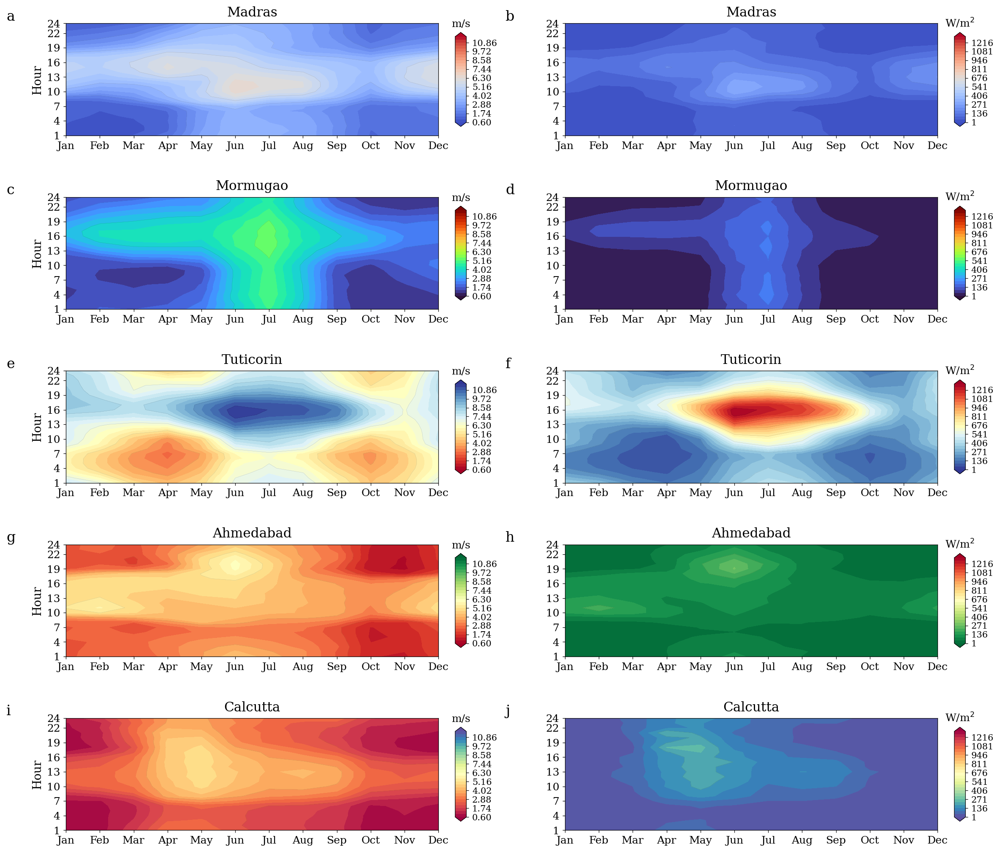

Saved: Contours_MWS_WPD_spacy.png and Contours_MWS_WPD_spacy.pdf


In [12]:
plot_all_sites_spacy(
    results_by_city,
    out_png=f"Contours_MWS_WPD_spacy.png",
    out_pdf=f"Contours_MWS_WPD_spacy.pdf",
    levels=30,
    row_height=2.8,   # try 2.8–3.2 for even taller
    fig_width=16.0,
    hspace=0.55,
    wspace=0.34
)


[OK] Madras: file='MADRAS-2-43279 (1) (1).xlsx', sheet='wind_43279'
[OK] Mormugao: file='MORMUGAO-43196 (2) (1).xlsx', sheet='wind_43196'
[OK] Tuticorin: file='TUTICORIN H.P.-15208 (5).xlsx', sheet='wind_15208'
[OK] Ahmedabad: file='ahamdabad new wind_42647 (1).xlsx', sheet='wind_42647'
[OK] Calcutta: file='Calcutta new-42809 (1).xlsx', sheet='Sheet1'
[OK] Jaipur: file='JAIPUR-42348.xlsx', sheet='wind_42348'


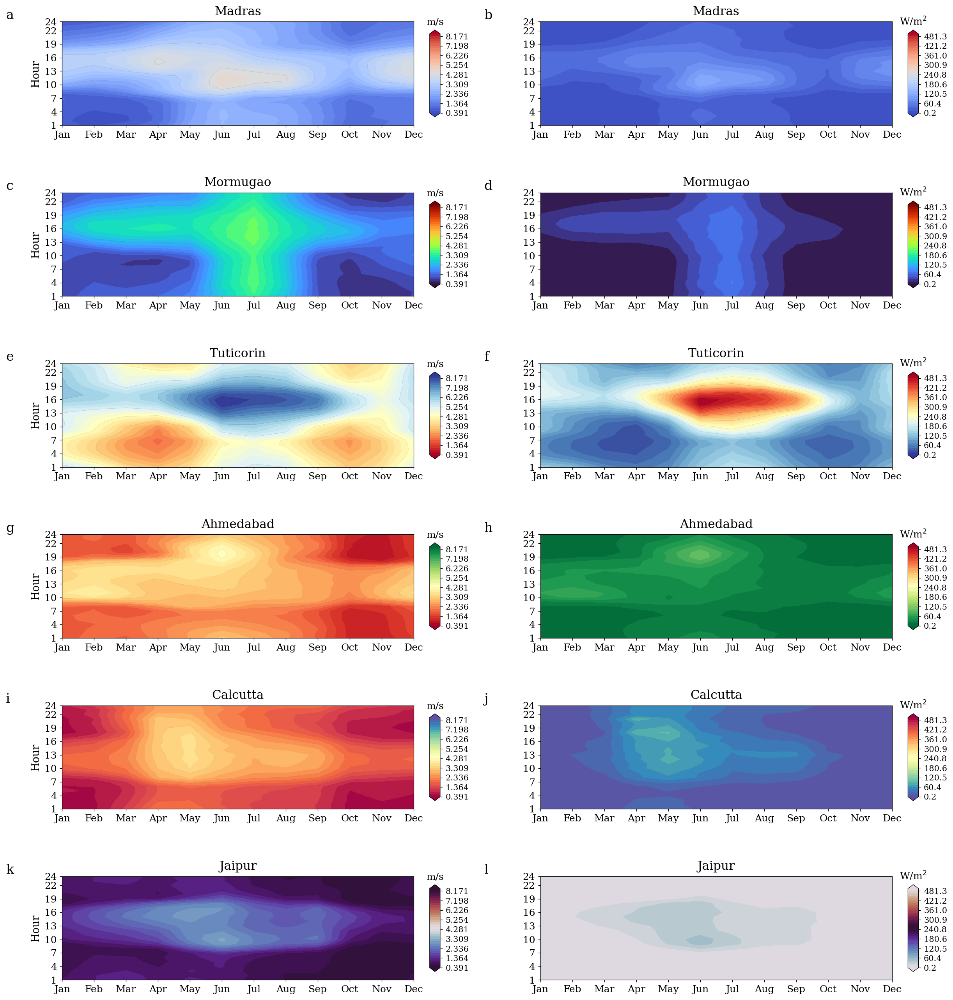

Saved: Contours_MWS_WPD_10m_spacy.png and Contours_MWS_WPD_10m_spacy.pdf


In [14]:
# ============================================================
# Colab: Wind MWS & WPD (10 m hub height) — spaced contour panels
# - Reads IMD-style Excel: YEAR, MN, DT, S01..S24
# - Computes MWS + WPD using manuscript MEPF/Weibull formulas
# - HUB HEIGHT = 10 m (no extrapolation)
# - Plots  (rows = sites, cols = [MWS, WPD]) with outside short cbars
# - Panel labels outside: a, b, c, ...
# ============================================================

!pip -q install openpyxl scipy

from google.colab import files
uploaded = files.upload()  # upload all your .xlsx files

import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.special import gamma
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# -------------------------
# Global style (clean, no bold)
# -------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 12,
    "axes.titleweight": "normal",
    "axes.labelweight": "normal",
    "axes.linewidth": 0.6,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "xtick.major.size": 3,
    "ytick.major.size": 3,
})

MONTH_LABELS = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]

# -------------------------
# Helpers: robust filename + sheet detection
# -------------------------
def _norm(s: str) -> str:
    return re.sub(r"[^a-z0-9]+", "", s.lower())

def resolve_file(preferred_name: str):
    """Return an existing filename in current dir that best matches preferred_name."""
    if os.path.exists(preferred_name):
        return preferred_name
    target = _norm(preferred_name)
    candidates = [f for f in os.listdir(".") if f.lower().endswith(".xlsx")]
    # exact normalized match
    for f in candidates:
        if _norm(f) == target:
            return f
    # substring match
    for f in candidates:
        if target in _norm(f) or _norm(f) in target:
            return f
    raise FileNotFoundError(f"Could not find Excel file matching: {preferred_name}\nAvailable: {candidates}")

def find_wind_sheet(path: str):
    """Find a sheet that contains YEAR, MN, DT and S01..S24 columns."""
    xl = pd.ExcelFile(path)
    for s in xl.sheet_names:
        try:
            df = pd.read_excel(path, sheet_name=s, header=1, nrows=5)
            cols = set(map(str, df.columns))
            has_core = {"YEAR","MN","DT"}.issubset(cols)
            has_hours = any(re.fullmatch(r"S\d{2}", str(c)) for c in df.columns)
            if has_core and has_hours:
                return s
        except Exception:
            pass
    # fallback
    return xl.sheet_names[0]

def load_imd_excel(path: str, sheet_name: str = None):
    if sheet_name is None:
        sheet_name = find_wind_sheet(path)
    df = pd.read_excel(path, sheet_name=sheet_name, header=1)

    hour_cols = [c for c in df.columns if re.fullmatch(r"S\d{2}", str(c))]
    hour_cols = sorted(hour_cols, key=lambda s: int(str(s)[1:]))

    needed = {"YEAR","MN","DT"}
    if not needed.issubset(set(df.columns)):
        raise ValueError(f"{os.path.basename(path)} missing {needed}. Found: {list(df.columns)[:15]}")
    if len(hour_cols) != 24:
        # still proceed, but warn
        print(f"[Warn] {os.path.basename(path)}: found {len(hour_cols)} hour columns (expected 24).")

    df = df[["YEAR","MN","DT"] + hour_cols].copy()
    for c in hour_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")
    df["MN"] = pd.to_numeric(df["MN"], errors="coerce").astype("Int64")

    return df, hour_cols, sheet_name

# -------------------------
# Manuscript math @ 10 m hub height
# EPF = mean(v^3) / mean(v)^3
# k   = 1 + 3.69/EPF^2
# c   = mean(v)/Gamma(1+1/k)
# WPD = 0.5*rho*c^3*Gamma(1+3/k)
# MWS = mean(v)
# -------------------------
def compute_mws_wpd(df, hour_cols, hub_height_m=10.0, ref_height_m=10.0, alpha=0.14, rho=1.225, input_unit="kmh"):
    # At 10 m, scale_hub = 1 (no extrapolation)
    scale_hub = (hub_height_m / ref_height_m) ** alpha if hub_height_m != ref_height_m else 1.0

    MWS = np.full((24, 12), np.nan, dtype=float)  # (hour 1..24, month 1..12)
    WPD = np.full((24, 12), np.nan, dtype=float)

    # ensure we index into 24 rows even if fewer columns found
    for mi, m in enumerate(range(1, 13)):
        dfm = df[df["MN"] == m]
        for hi in range(min(24, len(hour_cols))):
            hcol = hour_cols[hi]
            v = dfm[hcol].to_numpy(dtype=float)
            v = v[np.isfinite(v)]
            if v.size < 20:
                continue

            # km/h -> m/s
            if input_unit.lower() == "kmh":
                v = v / 3.6

            # hub-height scaling (no-op at 10 m)
            v = v * scale_hub

            mv = float(np.mean(v))
            if mv <= 1e-12:
                continue

            epf = float(np.mean(v**3) / (mv**3))
            if (not np.isfinite(epf)) or epf <= 0:
                continue

            k = 1.0 + 3.69 / (epf**2)
            c = mv / gamma(1.0 + 1.0 / k)
            wpd = 0.5 * rho * (c**3) * gamma(1.0 + 3.0 / k)

            MWS[hi, mi] = mv
            WPD[hi, mi] = wpd

    return {"MWS": MWS, "WPD": WPD}

# -------------------------
# Plot helpers: outside short cbar (NOT inside panel)
# -------------------------
def outside_short_cbar(fig, ax, mappable, unit, height="84%", width="3.0%", pad_x=0.045, pad_y=0.08):
    cax = inset_axes(
        ax,
        width=width,
        height=height,
        loc="lower left",
        bbox_to_anchor=(1.0 + pad_x, pad_y, 1, 1),
        bbox_transform=ax.transAxes,
        borderpad=0.0
    )
    cb = fig.colorbar(mappable, cax=cax, orientation="vertical")
    cb.ax.set_title(unit, fontsize=12, pad=6)  # unit on top
    cb.outline.set_linewidth(0.6)
    cb.ax.tick_params(labelsize=10, width=0.6, length=3)
    return cb

def plot_all_sites_spacy(
    results_by_city,
    out_png="Contours_MWS_WPD_10m.png",
    out_pdf="Contours_MWS_WPD_10m.pdf",
    levels=32,
    shared_scale=True,
    row_height=2.8,   # increase for more height per row
    fig_width=16.2,
    hspace=0.60,
    wspace=0.34,
    add_isolines=True
):
    cities = list(results_by_city.keys())
    nrows = len(cities)

    # Colormaps (6 sites -> these are applied row-wise)
    cmaps_mws = ["coolwarm","turbo","RdYlBu","RdYlGn","Spectral","twilight_shifted"]
    cmaps_wpd = ["coolwarm","turbo","RdYlBu_r","RdYlGn_r","Spectral_r","twilight"]

    # shared ranges
    all_mws = np.concatenate([results_by_city[c]["MWS"].ravel() for c in cities])
    all_wpd = np.concatenate([results_by_city[c]["WPD"].ravel() for c in cities])
    mws_min, mws_max = np.nanmin(all_mws), np.nanmax(all_mws)
    wpd_min, wpd_max = np.nanmin(all_wpd), np.nanmax(all_wpd)

    x = np.arange(1, 13)
    y = np.arange(1, 25)
    X, Y = np.meshgrid(x, y)

    fig_h = max(8.0, row_height * nrows)
    fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=(fig_width, fig_h), constrained_layout=False)
    if nrows == 1:
        axes = np.array([axes])

    plt.subplots_adjust(left=0.07, right=0.93, top=0.97, bottom=0.06, hspace=hspace, wspace=wspace)

    title_fs = 15
    tick_fs = 12
    ylab_fs = 13
    panel_fs = 16

    labels = [chr(ord('a') + i) for i in range(nrows * 2)]
    pi = 0

    for ri, city in enumerate(cities):
        # ---- MWS (left) ----
        ax = axes[ri, 0]
        Z = np.ma.masked_invalid(results_by_city[city]["MWS"])

        vmin, vmax = (mws_min, mws_max) if shared_scale else (np.nanmin(Z), np.nanmax(Z))
        lv = np.linspace(vmin, vmax, levels)

        cf = ax.contourf(X, Y, Z, levels=lv, cmap=cmaps_mws[ri % len(cmaps_mws)], extend="both")
        if add_isolines:
            ax.contour(X, Y, Z, levels=lv[::4], colors="k", linewidths=0.25, alpha=0.18)

        ax.set_title(city, fontsize=title_fs, pad=8, fontweight="normal")
        ax.set_xticks(np.arange(1, 13))
        ax.set_xticklabels(MONTH_LABELS, fontsize=tick_fs)
        ax.set_yticks([1,4,7,10,13,16,19,22,24])
        ax.tick_params(axis="y", labelsize=tick_fs)
        ax.set_xlim(1, 12)
        ax.set_ylim(1, 24)
        ax.set_ylabel("Hour", fontsize=ylab_fs)

        ax.text(-0.16, 1.12, labels[pi], transform=ax.transAxes, fontsize=panel_fs, va="top", ha="left")
        pi += 1

        outside_short_cbar(fig, ax, cf, unit="m/s", height="84%", width="3.0%", pad_x=0.045, pad_y=0.08)

        # ---- WPD (right) ----
        ax = axes[ri, 1]
        Z = np.ma.masked_invalid(results_by_city[city]["WPD"])

        vmin, vmax = (wpd_min, wpd_max) if shared_scale else (np.nanmin(Z), np.nanmax(Z))
        lv = np.linspace(vmin, vmax, levels)

        cf = ax.contourf(X, Y, Z, levels=lv, cmap=cmaps_wpd[ri % len(cmaps_wpd)], extend="both")
        if add_isolines:
            ax.contour(X, Y, Z, levels=lv[::4], colors="k", linewidths=0.25, alpha=0.18)

        ax.set_title(city, fontsize=title_fs, pad=8, fontweight="normal")
        ax.set_xticks(np.arange(1, 13))
        ax.set_xticklabels(MONTH_LABELS, fontsize=tick_fs)
        ax.set_yticks([1,4,7,10,13,16,19,22,24])
        ax.tick_params(axis="y", labelsize=tick_fs)
        ax.set_xlim(1, 12)
        ax.set_ylim(1, 24)
        ax.set_ylabel("")

        ax.text(-0.16, 1.12, labels[pi], transform=ax.transAxes, fontsize=panel_fs, va="top", ha="left")
        pi += 1

        outside_short_cbar(fig, ax, cf, unit="W/m$^2$", height="84%", width="3.0%", pad_x=0.045, pad_y=0.08)

        for a in (axes[ri,0], axes[ri,1]):
            for s in a.spines.values():
                s.set_linewidth(0.6)

    fig.savefig(out_png, dpi=600, bbox_inches="tight")
    fig.savefig(out_pdf, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png, "and", out_pdf)

# -------------------------
# CONFIG: your 6 sites (filenames as uploaded)
# (If Colab renames them, resolve_file() will still match in most cases)
# -------------------------
SITES = {
    "Madras":    "MADRAS-2-43279 (1) (1).xlsx",
    "Mormugao":  "MORMUGAO-43196 (2) (1).xlsx",
    "Tuticorin": "TUTICORIN H.P.-15208 (5).xlsx",
    "Ahmedabad": "ahamdabad new wind_42647 (1).xlsx",
    "Calcutta":  "Calcutta new-42809 (1).xlsx",
    "Jaipur":    "JAIPUR-42348.xlsx",
}

# -------------------------
# Compute @ 10 m hub height
# -------------------------
HUB_HEIGHT = 10.0
ALPHA = 0.14
RHO = 1.225

results_by_city = {}
for city, fname in SITES.items():
    path = resolve_file(fname)
    df, hour_cols, used_sheet = load_imd_excel(path, sheet_name=None)  # auto-detect correct sheet
    results_by_city[city] = compute_mws_wpd(
        df, hour_cols,
        hub_height_m=HUB_HEIGHT,
        ref_height_m=10.0,
        alpha=ALPHA,
        rho=RHO,
        input_unit="kmh"
    )
    print(f"[OK] {city}: file='{path}', sheet='{used_sheet}'")

# -------------------------
# Plot (spacious, clear)
# -------------------------
plot_all_sites_spacy(
    results_by_city,
    out_png="Contours_MWS_WPD_10m_spacy.png",
    out_pdf="Contours_MWS_WPD_10m_spacy.pdf",
    levels=34,        # more detail
    row_height=3.0,   # taller rows
    fig_width=16.5,
    hspace=0.65,
    wspace=0.36,
    add_isolines=True
)

# Optional download
# files.download("Contours_MWS_WPD_10m_spacy.png")
# files.download("Contours_MWS_WPD_10m_spacy.pdf")


[OK] Madras: file='MADRAS-2-43279 (1) (1).xlsx', sheet='wind_43279', tau_low=12.66 W/m^2
[OK] Mormugao: file='MORMUGAO-43196 (2) (1).xlsx', sheet='wind_43196', tau_low=5.93 W/m^2
[OK] Tuticorin: file='TUTICORIN H.P.-15208 (5).xlsx', sheet='wind_15208', tau_low=75.38 W/m^2
[OK] Ahmedabad: file='ahamdabad new wind_42647 (1).xlsx', sheet='wind_42647', tau_low=14.30 W/m^2
[OK] Calcutta: file='Calcutta new-42809 (1).xlsx', sheet='Sheet1', tau_low=13.32 W/m^2
[OK] Jaipur: file='JAIPUR-42348.xlsx', sheet='wind_42348', tau_low=5.84 W/m^2

Saved tables:
 - Table_MaintenanceWindows.csv
 - Table_Extremes_GPD_ReturnLevels.csv
 - Table_Clustering_MonthLabels.csv
 - Table_Regime_Transitions.csv


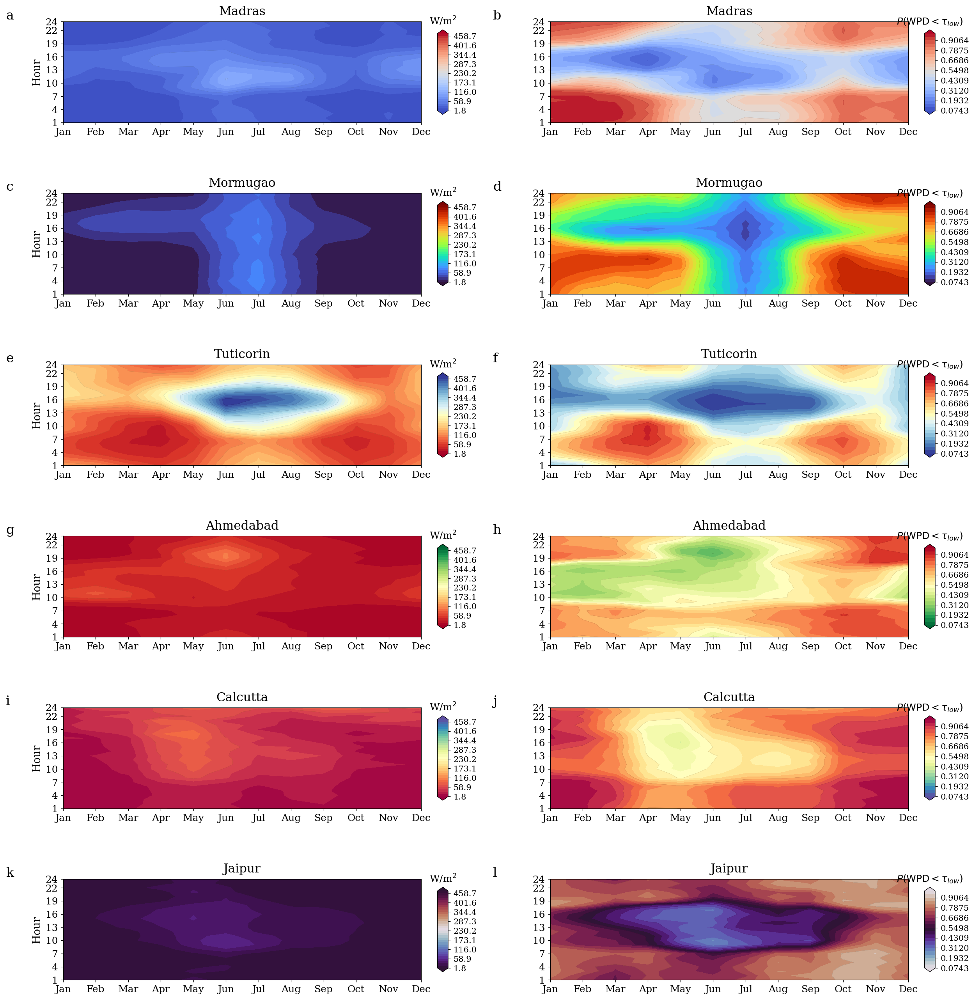

Saved: FigA_WPDmean_and_Opportunity.png and FigA_WPDmean_and_Opportunity.pdf


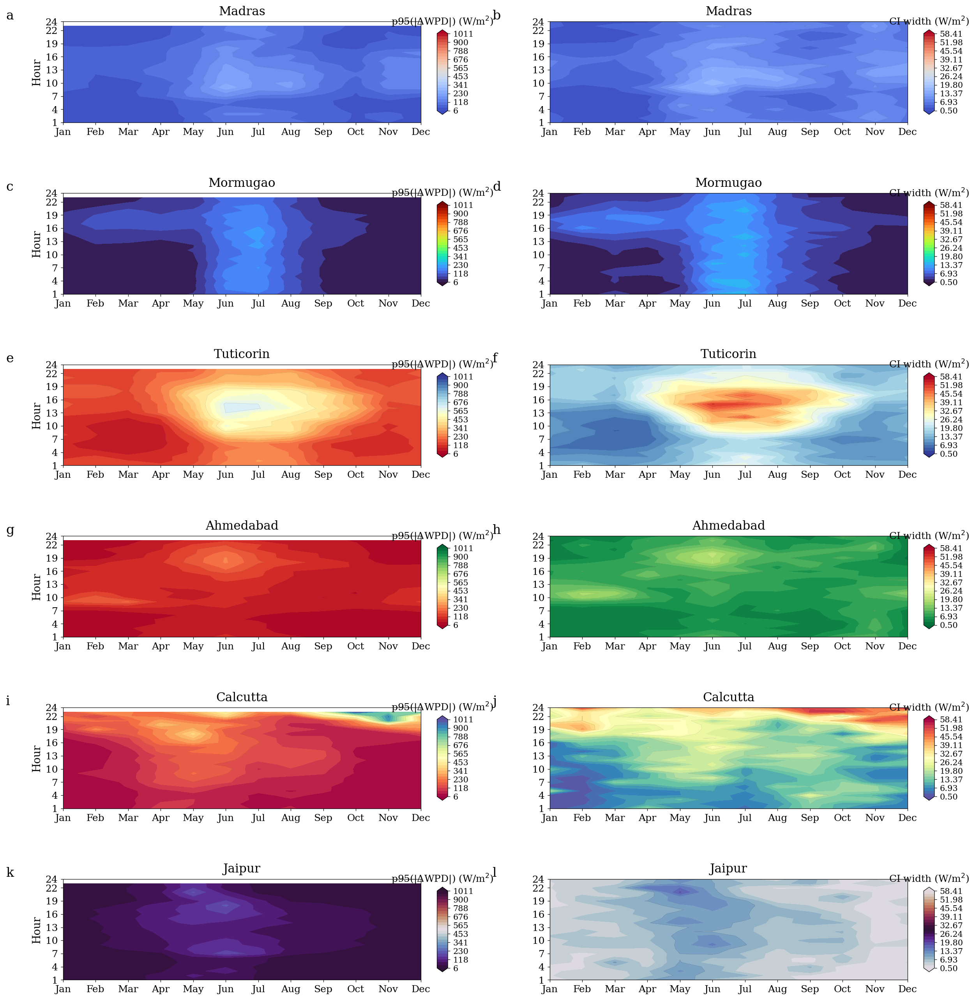

Saved: FigB_Ramp_and_Uncertainty.png and FigB_Ramp_and_Uncertainty.pdf

=== tau_low per site ===
Madras     tau_low=12.66 W/m^2
Mormugao   tau_low=5.93 W/m^2
Tuticorin  tau_low=75.38 W/m^2
Ahmedabad  tau_low=14.30 W/m^2
Calcutta   tau_low=13.32 W/m^2
Jaipur     tau_low=5.84 W/m^2

=== Maintenance windows (head) ===


,City,Month,tau_low_Wm2,BestStart_MeanBased_hour,BestStart_RiskControlled_hour,RobustnessProb_BestMeanStart,TargetProbConstraint
36,Ahmedabad,1,14.296102,19,18.0,0.946667,0.7
37,Ahmedabad,2,14.296102,19,NaN,0.533333,0.7
38,Ahmedabad,3,14.296102,2,NaN,0.576667,0.7
39,Ahmedabad,4,14.296102,2,NaN,0.770000,0.7
40,Ahmedabad,5,14.296102,2,NaN,1.000000,0.7
41,Ahmedabad,6,14.296102,3,NaN,0.996667,0.7
42,Ahmedabad,7,14.296102,3,NaN,0.996667,0.7
43,Ahmedabad,8,14.296102,3,NaN,0.560000,0.7
44,Ahmedabad,9,14.296102,2,2.0,0.893333,0.7
45,Ahmedabad,10,14.296102,2,NaN,0.573333,0.7



=== Clustering (head) ===


,City,Month,DTW_k,DTW_ClusterID,RegimeRank(0=low..),silhouette_dtw,db_proxy
36,Ahmedabad,1,3,1,1,0.468388,0.614818
37,Ahmedabad,2,3,1,1,0.468388,0.614818
38,Ahmedabad,3,3,1,1,0.468388,0.614818
39,Ahmedabad,4,3,2,0,0.468388,0.614818
40,Ahmedabad,5,3,0,2,0.468388,0.614818
41,Ahmedabad,6,3,0,2,0.468388,0.614818
42,Ahmedabad,7,3,0,2,0.468388,0.614818
43,Ahmedabad,8,3,2,0,0.468388,0.614818
44,Ahmedabad,9,3,2,0,0.468388,0.614818
45,Ahmedabad,10,3,2,0,0.468388,0.614818



=== Transitions (head) ===


,City,FromRegimeRank,ToRegimeRank,Count,Prob
17,Ahmedabad,0,0,2,0.500000
18,Ahmedabad,0,1,1,0.250000
19,Ahmedabad,0,2,1,0.250000
20,Ahmedabad,1,0,1,0.200000
21,Ahmedabad,1,1,4,0.800000
22,Ahmedabad,1,2,0,0.000000
23,Ahmedabad,2,0,1,0.333333
24,Ahmedabad,2,1,0,0.000000
25,Ahmedabad,2,2,2,0.666667
26,Calcutta,0,0,4,0.666667



=== Extremes (head) ===


,City,Season,Threshold_u_Wm2(q=0.95),GPD_xi,GPD_beta,ExceedanceRate_lambda_per_year,n_exc,n_total,ReturnLevel_10y_Wm2,ReturnLevel_50y_Wm2
14,Ahmedabad,Monsoon (JJAS),139.786951,-0.111827,131.258410,94.000000,2068,54263,767.660157,857.574348
15,Ahmedabad,Post-monsoon (ON),76.562500,0.152093,82.022748,31.045455,683,17156,828.014284,1185.996809
13,Ahmedabad,Pre-monsoon (MAM),121.578414,0.038011,91.723001,89.045455,1959,39766,832.338379,1029.409096
12,Ahmedabad,Winter (DJF),105.024005,-0.058155,107.414362,75.619048,1588,34649,695.831735,808.076000
18,Calcutta,Monsoon (JJAS),139.786951,0.427533,198.962557,104.862069,3041,68563,8778.057321,17789.809755
19,Calcutta,Post-monsoon (ON),44.307002,0.871980,82.411771,45.535714,1275,25958,19606.591308,79933.333336
17,Calcutta,Pre-monsoon (MAM),230.737740,0.291050,229.090462,70.758621,2052,52428,4758.190529,7933.539095
16,Calcutta,Winter (DJF),36.023234,0.926179,61.416726,55.862069,1620,37983,23192.477401,103076.040860
22,Jaipur,Monsoon (JJAS),105.024005,0.001679,132.993713,64.612903,2003,54655,970.319180,1186.995641
23,Jaipur,Post-monsoon (ON),36.023234,0.267466,46.590871,22.677419,703,21403,604.974508,1004.771723


In [16]:
# ============================================================
# FULL COLAB PIPELINE (10 m) — FIXED MARKOV + ROBUST tau_low
# ============================================================

!pip -q install openpyxl scipy scikit-learn tslearn

from google.colab import files
uploaded = files.upload()

import os, re, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import genpareto
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from sklearn.metrics import silhouette_score, davies_bouldin_score
from tslearn.clustering import TimeSeriesKMeans, KShape
from tslearn.metrics import cdist_dtw
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

warnings.filterwarnings("ignore")

# -------------------------
# STYLE
# -------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 12,
    "axes.titleweight": "normal",
    "axes.labelweight": "normal",
    "axes.linewidth": 0.6,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "xtick.major.size": 3,
    "ytick.major.size": 3,
})

MONTH_LABELS = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
HOURS = np.arange(1, 25)

# -------------------------
# CONFIG
# -------------------------
RHO = 1.225
RNG_SEED = 42

# Maintenance window
WINDOW_H = 6
START_HOURS = list(range(0, 24 - WINDOW_H + 1))  # 0..18
ROBUST_PROB_TARGET = 0.70

# Bootstrap reps (runtime-safe)
BOOT_CI_B = 120
BOOT_MAINT_B = 300

# tau_low policy:
#  - "mean_grid_p25" (recommended): 25th percentile of mean WPD across month-hour grid
#  - "instant_p25": 25th percentile of instantaneous WPD
#  - "fixed": fixed value in W/m^2
TAU_MODE = "mean_grid_p25"
TAU_FIXED = 80.0

# Clustering
K_MIN, K_MAX = 2, 6

# Extremes
GPD_Q = 0.95
RETURN_PERIODS = [10, 50]
SEASONS = {
    "Winter (DJF)": [12, 1, 2],
    "Pre-monsoon (MAM)": [3, 4, 5],
    "Monsoon (JJAS)": [6, 7, 8, 9],
    "Post-monsoon (ON)": [10, 11],
}

# -------------------------
# Robust file/sheet detection
# -------------------------
def _norm(s: str) -> str:
    return re.sub(r"[^a-z0-9]+", "", s.lower())

def resolve_file(preferred_name: str):
    if os.path.exists(preferred_name):
        return preferred_name
    target = _norm(preferred_name)
    candidates = [f for f in os.listdir(".") if f.lower().endswith(".xlsx")]
    for f in candidates:
        if _norm(f) == target:
            return f
    for f in candidates:
        if target in _norm(f) or _norm(f) in target:
            return f
    raise FileNotFoundError(f"Could not find Excel file matching: {preferred_name}\nAvailable: {candidates}")

def find_wind_sheet(path: str):
    xl = pd.ExcelFile(path)
    for s in xl.sheet_names:
        try:
            df = pd.read_excel(path, sheet_name=s, header=1, nrows=5)
            cols = set(map(str, df.columns))
            has_core = {"YEAR","MN","DT"}.issubset(cols)
            has_hours = any(re.fullmatch(r"S\d{2}", str(c)) for c in df.columns)
            if has_core and has_hours:
                return s
        except Exception:
            pass
    return xl.sheet_names[0]

def load_imd_excel(path: str, sheet_name: str = None):
    if sheet_name is None:
        sheet_name = find_wind_sheet(path)
    df = pd.read_excel(path, sheet_name=sheet_name, header=1)

    hour_cols = [c for c in df.columns if re.fullmatch(r"S\d{2}", str(c))]
    hour_cols = sorted(hour_cols, key=lambda s: int(str(s)[1:]))

    needed = {"YEAR","MN","DT"}
    if not needed.issubset(set(df.columns)):
        raise ValueError(f"{os.path.basename(path)} missing {needed}. Found: {list(df.columns)[:15]}")
    if len(hour_cols) < 20:
        raise ValueError(f"{os.path.basename(path)}: too few hour columns found: {len(hour_cols)}")

    df = df[["YEAR","MN","DT"] + hour_cols].copy()
    for c in hour_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")

    df["YEAR"] = pd.to_numeric(df["YEAR"], errors="coerce").astype("Int64")
    df["MN"] = pd.to_numeric(df["MN"], errors="coerce").astype("Int64")
    df["DT"] = pd.to_numeric(df["DT"], errors="coerce").astype("Int64")

    return df, hour_cols, sheet_name

# -------------------------
# Physics helpers
# -------------------------
def kmh_to_ms(x):
    return x / 3.6

def instantaneous_wpd_from_v(v_ms, rho=RHO):
    return 0.5 * rho * (v_ms ** 3)

# -------------------------
# Data cleaning for wind speed
# - remove nonphysical v<=0
# - clip extreme outliers by percentile (optional)
# -------------------------
def clean_wind_matrix(V_ms, clip_hi_q=0.999):
    V = V_ms.copy()
    V[V <= 0] = np.nan
    # clip extreme outliers per-column
    hi = np.nanquantile(V, clip_hi_q)
    V[V > hi] = hi
    return V

# -------------------------
# Bootstrap CI for mean
# -------------------------
def bootstrap_ci_mean(x, B=150, alpha=0.05, rng=None):
    x = x[np.isfinite(x)]
    if x.size < 30:
        return (np.nan, np.nan, np.nan)
    if rng is None:
        rng = np.random.default_rng(0)
    n = x.size
    means = np.empty(B, dtype=float)
    for b in range(B):
        idx = rng.integers(0, n, size=n)
        means[b] = np.mean(x[idx])
    lo = np.quantile(means, alpha/2)
    hi = np.quantile(means, 1 - alpha/2)
    return (float(np.mean(x)), float(lo), float(hi))

# -------------------------
# Maintenance windows + robustness
# -------------------------
def compute_windows_for_month(P_month_days_24, tau_low, window_h=6, start_hours=START_HOURS,
                              robust_prob_target=0.7, B_boot=300, rng=None):
    if rng is None:
        rng = np.random.default_rng(0)

    P = P_month_days_24
    if P is None or P.shape[0] < 20:
        return None

    n_days = P.shape[0]
    stats = []
    for s in start_hours:
        win = P[:, s:s+window_h]
        win_mean_per_day = np.nanmean(win, axis=1)
        mu = float(np.nanmean(win_mean_per_day))
        p_ok = float(np.mean(win_mean_per_day < tau_low))
        stats.append((s, mu, p_ok))

    df_stats = pd.DataFrame(stats, columns=["start_hour_0based", "mean_window_WPD", "P_window_mean_below_tau"])
    best_mean_start = int(df_stats.loc[df_stats["mean_window_WPD"].idxmin(), "start_hour_0based"])

    feasible = df_stats[df_stats["P_window_mean_below_tau"] >= robust_prob_target]
    best_risk_start = None
    if len(feasible) > 0:
        best_risk_start = int(feasible.loc[feasible["mean_window_WPD"].idxmin(), "start_hour_0based"])

    boot_counts = {s: 0 for s in start_hours}
    for b in range(B_boot):
        idx = rng.integers(0, n_days, size=n_days)
        Pb = P[idx, :]
        best_s, best_val = None, np.inf
        for s in start_hours:
            win = Pb[:, s:s+window_h]
            val = float(np.nanmean(np.nanmean(win, axis=1)))
            if val < best_val:
                best_val = val
                best_s = s
        boot_counts[best_s] += 1

    return {
        "best_mean_start": best_mean_start,
        "best_risk_start": best_risk_start,
        "window_stats": df_stats,
        "boot_counts": boot_counts
    }

# -------------------------
# Ramp map: p95(|ΔWPD|) by month-hour
# -------------------------
def ramp_quantile_map(P_days_24, months, q=0.95):
    ramp = np.full((24, 12), np.nan, dtype=float)
    for m in range(1, 13):
        mask = (months == m)
        if np.sum(mask) < 20:
            continue
        Pm = P_days_24[mask, :]
        d = np.abs(Pm[:, 1:] - Pm[:, :-1])  # (n_days, 23)
        for h in range(23):
            x = d[:, h]
            x = x[np.isfinite(x)]
            if x.size < 30:
                continue
            ramp[h, m-1] = float(np.quantile(x, q))
        ramp[23, m-1] = np.nan
    return ramp

# -------------------------
# Extremes (GPD POT) per season
# -------------------------
def gpd_return_levels(P_all, years_all, months_all, season_months, q_u=0.95, return_periods=RETURN_PERIODS):
    mask = np.isin(months_all, season_months)
    x = P_all[mask]
    y = years_all[mask]
    x = x[np.isfinite(x)]
    y = y[np.isfinite(y)]
    if x.size < 200:
        return None

    u = float(np.quantile(x, q_u))
    exc = x[x > u] - u
    if exc.size < 50:
        return None

    xi, loc, beta = genpareto.fit(exc, floc=0.0)
    xi = float(xi)
    beta = float(beta)

    years = np.unique(y.astype(int))
    n_years = max(1, len(years))
    lam = exc.size / n_years  # exceedances/year

    rls = {}
    for T in return_periods:
        if abs(xi) < 1e-8:
            zT = u + beta * np.log(T * lam)
        else:
            zT = u + (beta / xi) * ((T * lam) ** xi - 1.0)
        rls[T] = float(zT)

    return {"u": u, "xi": xi, "beta": beta, "lambda_per_year": float(lam), "return_levels": rls, "n_exc": int(exc.size), "n": int(x.size)}

# -------------------------
# Clustering monthly mean diurnal profiles (24h)
# - DTW-kmeans: pick k by best silhouette on DTW distance matrix
# - Rank clusters by mean level -> rank 0..k-1
# -------------------------
def cluster_monthly_profiles(P_days_24, months, seed=RNG_SEED):
    profiles = []
    valid_months = []
    for m in range(1, 13):
        mask = (months == m)
        if np.sum(mask) < 10:
            continue
        prof = np.nanmean(P_days_24[mask, :], axis=0)
        profiles.append(prof)
        valid_months.append(m)

    profiles = np.array(profiles, dtype=float)  # (M,24)
    if profiles.shape[0] < 6:
        return None

    X = profiles[:, :, None]
    Xz = TimeSeriesScalerMeanVariance(mu=0., std=1.).fit_transform(X)

    D = cdist_dtw(Xz.squeeze(-1))
    best = None

    for k in range(K_MIN, min(K_MAX, Xz.shape[0]-1) + 1):
        km = TimeSeriesKMeans(n_clusters=k, metric="dtw", random_state=seed)
        labels = km.fit_predict(Xz)
        sil = silhouette_score(D, labels, metric="precomputed")
        db = davies_bouldin_score(Xz.reshape(Xz.shape[0], -1), labels)
        if (best is None) or (sil > best["silhouette_dtw"]):
            best = {"k": k, "labels": labels, "silhouette_dtw": float(sil), "db_proxy": float(db), "model": km}

    # rank clusters by mean WPD level (on original profiles)
    cluster_means = {c: float(np.mean(profiles[best["labels"] == c])) for c in range(best["k"])}
    ordered = sorted(cluster_means.items(), key=lambda t: t[1])  # low->high
    rank_map = {cid: rank for rank, (cid, _) in enumerate(ordered)}  # 0..k-1

    month_info = []
    for i, m in enumerate(valid_months):
        cid = int(best["labels"][i])
        month_info.append((int(m), cid, int(rank_map[cid])))

    return {
        "valid_months": valid_months,
        "profiles": profiles,
        "dtw_kmeans": best,
        "cluster_means": cluster_means,
        "rank_map": rank_map,
        "month_info": month_info
    }

# -------------------------
# FIXED Markov transitions (always sized to max rank + 1)
# -------------------------
def markov_transition_from_ranks(month_info):
    # month_info: (month, cluster_id, rank)
    seq = {m: r for (m, _, r) in month_info}  # month -> rank
    if len(seq) < 4:
        return None, None

    ranks = list(seq.values())
    k = int(max(ranks) + 1)  # <-- FIX: size from observed ranks
    trans = np.zeros((k, k), dtype=int)

    months_sorted = sorted(seq.keys())
    for m in months_sorted:
        m2 = 1 if m == 12 else (m + 1)
        if (m in seq) and (m2 in seq):
            trans[seq[m], seq[m2]] += 1

    T = trans.astype(float)
    row_sums = T.sum(axis=1, keepdims=True)
    with np.errstate(divide="ignore", invalid="ignore"):
        P = np.where(row_sums > 0, T / row_sums, np.nan)
    return trans, P

# -------------------------
# Plotting utilities (outside short cbars, spaced)
# -------------------------
def outside_short_cbar(fig, ax, mappable, unit, height="84%", width="3.0%", pad_x=0.045, pad_y=0.08):
    cax = inset_axes(
        ax, width=width, height=height, loc="lower left",
        bbox_to_anchor=(1.0 + pad_x, pad_y, 1, 1),
        bbox_transform=ax.transAxes, borderpad=0.0
    )
    cb = fig.colorbar(mappable, cax=cax, orientation="vertical")
    cb.ax.set_title(unit, fontsize=12, pad=6)
    cb.outline.set_linewidth(0.6)
    cb.ax.tick_params(labelsize=10, width=0.6, length=3)
    return cb

def plot_two_column_grid(results, left_key, left_unit, right_key, right_unit,
                         out_png="grid2.png", out_pdf="grid2.pdf",
                         levels_left=30, levels_right=30,
                         shared_left=True, shared_right=True,
                         row_height=3.0, fig_width=16.8,
                         hspace=0.70, wspace=0.36, add_isolines=True):
    cities = list(results.keys())
    nrows = len(cities)

    cmaps_left = ["coolwarm","turbo","RdYlBu","RdYlGn","Spectral","twilight_shifted",
                  "coolwarm","turbo","RdYlBu_r","RdYlGn_r"]
    cmaps_right = ["coolwarm","turbo","RdYlBu_r","RdYlGn_r","Spectral_r","twilight",
                   "coolwarm","turbo","RdYlBu","RdYlGn"]

    x = np.arange(1, 13)
    y = np.arange(1, 25)
    X, Y = np.meshgrid(x, y)

    allL = np.concatenate([results[c][left_key].ravel() for c in cities])
    allR = np.concatenate([results[c][right_key].ravel() for c in cities])
    lmin, lmax = float(np.nanmin(allL)), float(np.nanmax(allL))
    rmin, rmax = float(np.nanmin(allR)), float(np.nanmax(allR))

    fig_h = max(8.0, row_height * nrows)
    fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=(fig_width, fig_h), constrained_layout=False)
    if nrows == 1:
        axes = np.array([axes])

    plt.subplots_adjust(left=0.07, right=0.93, top=0.97, bottom=0.06, hspace=hspace, wspace=wspace)

    labels = [chr(ord('a') + i) for i in range(nrows * 2)]
    pi = 0

    for ri, city in enumerate(cities):
        # LEFT
        ax = axes[ri, 0]
        Z = np.ma.masked_invalid(results[city][left_key])
        vmin, vmax = (lmin, lmax) if shared_left else (float(np.nanmin(Z)), float(np.nanmax(Z)))
        lv = np.linspace(vmin, vmax, levels_left)
        cf = ax.contourf(X, Y, Z, levels=lv, cmap=cmaps_left[ri % len(cmaps_left)], extend="both")
        if add_isolines:
            ax.contour(X, Y, Z, levels=lv[::4], colors="k", linewidths=0.25, alpha=0.18)

        ax.set_title(city, fontsize=15, pad=8, fontweight="normal")
        ax.set_xticks(np.arange(1, 13))
        ax.set_xticklabels(MONTH_LABELS, fontsize=12)
        ax.set_yticks([1,4,7,10,13,16,19,22,24])
        ax.tick_params(axis="y", labelsize=12)
        ax.set_xlim(1, 12)
        ax.set_ylim(1, 24)
        ax.set_ylabel("Hour", fontsize=13)

        ax.text(-0.16, 1.12, labels[pi], transform=ax.transAxes, fontsize=16, va="top", ha="left")
        pi += 1
        outside_short_cbar(fig, ax, cf, unit=left_unit, height="84%", width="3.0%", pad_x=0.045, pad_y=0.08)

        # RIGHT
        ax = axes[ri, 1]
        Z = np.ma.masked_invalid(results[city][right_key])
        vmin, vmax = (rmin, rmax) if shared_right else (float(np.nanmin(Z)), float(np.nanmax(Z)))
        lv = np.linspace(vmin, vmax, levels_right)
        cf = ax.contourf(X, Y, Z, levels=lv, cmap=cmaps_right[ri % len(cmaps_right)], extend="both")
        if add_isolines:
            ax.contour(X, Y, Z, levels=lv[::4], colors="k", linewidths=0.25, alpha=0.18)

        ax.set_title(city, fontsize=15, pad=8, fontweight="normal")
        ax.set_xticks(np.arange(1, 13))
        ax.set_xticklabels(MONTH_LABELS, fontsize=12)
        ax.set_yticks([1,4,7,10,13,16,19,22,24])
        ax.tick_params(axis="y", labelsize=12)
        ax.set_xlim(1, 12)
        ax.set_ylim(1, 24)
        ax.set_ylabel("")

        ax.text(-0.16, 1.12, labels[pi], transform=ax.transAxes, fontsize=16, va="top", ha="left")
        pi += 1
        outside_short_cbar(fig, ax, cf, unit=right_unit, height="84%", width="3.0%", pad_x=0.045, pad_y=0.08)

        for a in (axes[ri,0], axes[ri,1]):
            for s in a.spines.values():
                s.set_linewidth(0.6)

    fig.savefig(out_png, dpi=600, bbox_inches="tight")
    fig.savefig(out_pdf, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png, "and", out_pdf)

# ============================================================
# YOUR SITES
# ============================================================
SITES = {
    "Madras":    "MADRAS-2-43279 (1) (1).xlsx",
    "Mormugao":  "MORMUGAO-43196 (2) (1).xlsx",
    "Tuticorin": "TUTICORIN H.P.-15208 (5).xlsx",
    "Ahmedabad": "ahamdabad new wind_42647 (1).xlsx",
    "Calcutta":  "Calcutta new-42809 (1).xlsx",
    "Jaipur":    "JAIPUR-42348.xlsx",
}

# ============================================================
# MAIN LOOP
# ============================================================
site_results = {}
maintenance_rows = []
extreme_rows = []
cluster_rows = []
transition_rows = []

for city, fname in SITES.items():
    path = resolve_file(fname)
    df, hour_cols, used_sheet = load_imd_excel(path)

    V_kmh = df[hour_cols].to_numpy(dtype=float)
    V_ms = kmh_to_ms(V_kmh)
    V_ms = clean_wind_matrix(V_ms, clip_hi_q=0.999)  # <- IMPORTANT: avoid zeros & crazy outliers
    P = instantaneous_wpd_from_v(V_ms, rho=RHO)       # (n_days,24)

    months = df["MN"].to_numpy(dtype=float)
    years  = df["YEAR"].to_numpy(dtype=float)

    # Flat arrays for thresholds/extremes
    P_flat = P.reshape(-1)
    months_flat = np.repeat(months, P.shape[1])
    years_flat  = np.repeat(years, P.shape[1])

    # ---- month-hour maps + bootstrap CI
    WPD_mean = np.full((24, 12), np.nan, dtype=float)
    P_low    = np.full((24, 12), np.nan, dtype=float)
    CI_w     = np.full((24, 12), np.nan, dtype=float)

    rng = np.random.default_rng(RNG_SEED + (hash(city) % 10_000))

    # Precompute mean grid (for tau mode)
    for m in range(1, 13):
        mask_m = (months == m)
        if np.sum(mask_m) < 20:
            continue
        Pm = P[mask_m, :]
        for h in range(24):
            x = Pm[:, h]
            x = x[np.isfinite(x)]
            if x.size < 30:
                continue
            WPD_mean[h, m-1] = float(np.mean(x))

    # ---- tau_low selection (ROBUST)
    if TAU_MODE == "fixed":
        tau_low = float(TAU_FIXED)
    elif TAU_MODE == "instant_p25":
        tau_low = float(np.nanquantile(P_flat[np.isfinite(P_flat)], 0.25))
    else:
        # recommended: percentile over mean grid (month-hour means)
        grid_vals = WPD_mean[np.isfinite(WPD_mean)]
        tau_low = float(np.nanquantile(grid_vals, 0.25)) if grid_vals.size > 0 else float(np.nanquantile(P_flat[np.isfinite(P_flat)], 0.25))

    # Now fill P_low + CI width using tau_low
    for m in range(1, 13):
        mask_m = (months == m)
        if np.sum(mask_m) < 20:
            continue
        Pm = P[mask_m, :]
        for h in range(24):
            x = Pm[:, h]
            x = x[np.isfinite(x)]
            if x.size < 30:
                continue

            P_low[h, m-1] = float(np.mean(x < tau_low))
            mu, lo, hi = bootstrap_ci_mean(x, B=BOOT_CI_B, alpha=0.05, rng=rng)
            CI_w[h, m-1] = hi - lo

    # ---- ramp p95
    Ramp_p95 = ramp_quantile_map(P, months, q=0.95)

    # ---- maintenance windows per month
    for m in range(1, 13):
        mask_m = (months == m)
        if np.sum(mask_m) < 20:
            continue
        Pm = P[mask_m, :]
        mw = compute_windows_for_month(
            Pm, tau_low=tau_low, window_h=WINDOW_H, start_hours=START_HOURS,
            robust_prob_target=ROBUST_PROB_TARGET, B_boot=BOOT_MAINT_B,
            rng=np.random.default_rng(RNG_SEED + m + (hash(city) % 1000))
        )
        if mw is None:
            continue

        counts = mw["boot_counts"]
        total = sum(counts.values())
        best_mean = mw["best_mean_start"]
        prob_best = counts[best_mean] / total if total > 0 else np.nan

        maintenance_rows.append({
            "City": city,
            "Month": m,
            "tau_low_Wm2": tau_low,
            "BestStart_MeanBased_hour": best_mean + 1,
            "BestStart_RiskControlled_hour": (mw["best_risk_start"] + 1) if mw["best_risk_start"] is not None else np.nan,
            "RobustnessProb_BestMeanStart": prob_best,
            "TargetProbConstraint": ROBUST_PROB_TARGET
        })

    # ---- extremes by season
    for sname, smonths in SEASONS.items():
        out = gpd_return_levels(P_flat, years_flat, months_flat, smonths, q_u=GPD_Q, return_periods=RETURN_PERIODS)
        if out is None:
            continue
        row = {
            "City": city,
            "Season": sname,
            "Threshold_u_Wm2(q=0.95)": out["u"],
            "GPD_xi": out["xi"],
            "GPD_beta": out["beta"],
            "ExceedanceRate_lambda_per_year": out["lambda_per_year"],
            "n_exc": out["n_exc"],
            "n_total": out["n"]
        }
        for T in RETURN_PERIODS:
            row[f"ReturnLevel_{T}y_Wm2"] = out["return_levels"][T]
        extreme_rows.append(row)

    # ---- clustering + transitions (FIXED)
    cl = cluster_monthly_profiles(P, months, seed=RNG_SEED)
    if cl is not None:
        k = cl["dtw_kmeans"]["k"]
        sil = cl["dtw_kmeans"]["silhouette_dtw"]
        dbp = cl["dtw_kmeans"]["db_proxy"]

        for (m, cid, rank) in cl["month_info"]:
            cluster_rows.append({
                "City": city, "Month": m,
                "DTW_k": int(k),
                "DTW_ClusterID": int(cid),
                "RegimeRank(0=low..)": int(rank),
                "silhouette_dtw": sil,
                "db_proxy": dbp
            })

        trans_counts, trans_probs = markov_transition_from_ranks(cl["month_info"])
        if trans_counts is not None:
            kk = trans_probs.shape[0]
            for i in range(kk):
                for j in range(kk):
                    transition_rows.append({
                        "City": city,
                        "FromRegimeRank": i,
                        "ToRegimeRank": j,
                        "Count": int(trans_counts[i, j]),
                        "Prob": float(trans_probs[i, j]) if np.isfinite(trans_probs[i, j]) else np.nan
                    })

    # store matrices for figures
    site_results[city] = {
        "WPD_mean": WPD_mean,
        "P_low": P_low,
        "Ramp_p95": Ramp_p95,
        "WPD_CI_width": CI_w,
        "tau_low": tau_low,
        "meta_file": path,
        "meta_sheet": used_sheet
    }

    print(f"[OK] {city}: file='{path}', sheet='{used_sheet}', tau_low={tau_low:.2f} W/m^2")

# ============================================================
# SAVE TABLES
# ============================================================
maint_df = pd.DataFrame(maintenance_rows).sort_values(["City","Month"])
ext_df   = pd.DataFrame(extreme_rows).sort_values(["City","Season"])
clus_df  = pd.DataFrame(cluster_rows).sort_values(["City","Month"])
tran_df  = pd.DataFrame(transition_rows).sort_values(["City","FromRegimeRank","ToRegimeRank"])

maint_df.to_csv("Table_MaintenanceWindows.csv", index=False)
ext_df.to_csv("Table_Extremes_GPD_ReturnLevels.csv", index=False)
clus_df.to_csv("Table_Clustering_MonthLabels.csv", index=False)
tran_df.to_csv("Table_Regime_Transitions.csv", index=False)

print("\nSaved tables:")
print(" - Table_MaintenanceWindows.csv")
print(" - Table_Extremes_GPD_ReturnLevels.csv")
print(" - Table_Clustering_MonthLabels.csv")
print(" - Table_Regime_Transitions.csv")

# ============================================================
# MINIMAL FIGURES
# Fig A: Mean WPD + Opportunity (P_low)
# Fig B: Ramp p95(|ΔWPD|) + CI width
# ============================================================
plot_two_column_grid(
    site_results,
    left_key="WPD_mean", left_unit="W/m$^2$",
    right_key="P_low",   right_unit="$P(\\mathrm{WPD}<\\tau_{low})$",
    out_png="FigA_WPDmean_and_Opportunity.png",
    out_pdf="FigA_WPDmean_and_Opportunity.pdf",
    levels_left=34, levels_right=24,
    shared_left=True, shared_right=True,
    row_height=3.0, fig_width=16.8,
    hspace=0.70, wspace=0.36,
    add_isolines=True
)

plot_two_column_grid(
    site_results,
    left_key="Ramp_p95",      left_unit="p95(|ΔWPD|) (W/m$^2$)",
    right_key="WPD_CI_width", right_unit="CI width (W/m$^2$)",
    out_png="FigB_Ramp_and_Uncertainty.png",
    out_pdf="FigB_Ramp_and_Uncertainty.pdf",
    levels_left=28, levels_right=28,
    shared_left=True, shared_right=True,
    row_height=3.0, fig_width=16.8,
    hspace=0.70, wspace=0.36,
    add_isolines=True
)

# ============================================================
# QUICK CHECKS
# ============================================================
print("\n=== tau_low per site ===")
for c in site_results:
    print(f"{c:10s} tau_low={site_results[c]['tau_low']:.2f} W/m^2")

print("\n=== Maintenance windows (head) ===")
display(maint_df.head(12))

print("\n=== Clustering (head) ===")
display(clus_df.head(12))

print("\n=== Transitions (head) ===")
display(tran_df.head(12))

print("\n=== Extremes (head) ===")
display(ext_df.head(12))

# Optional: download outputs
# files.download("FigA_WPDmean_and_Opportunity.png")
# files.download("FigB_Ramp_and_Uncertainty.png")
# files.download("Table_MaintenanceWindows.csv")
# files.download("Table_Extremes_GPD_ReturnLevels.csv")
# files.download("Table_Clustering_MonthLabels.csv")
# files.download("Table_Regime_Transitions.csv")


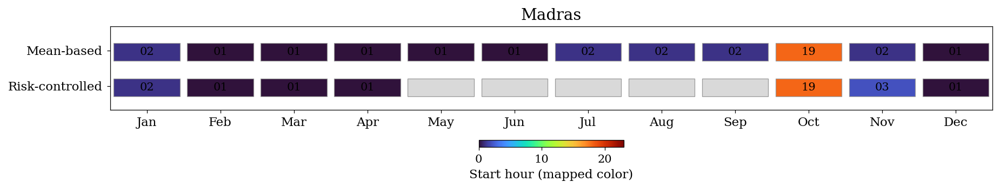

Saved: Madras_MaintenanceStrips.png


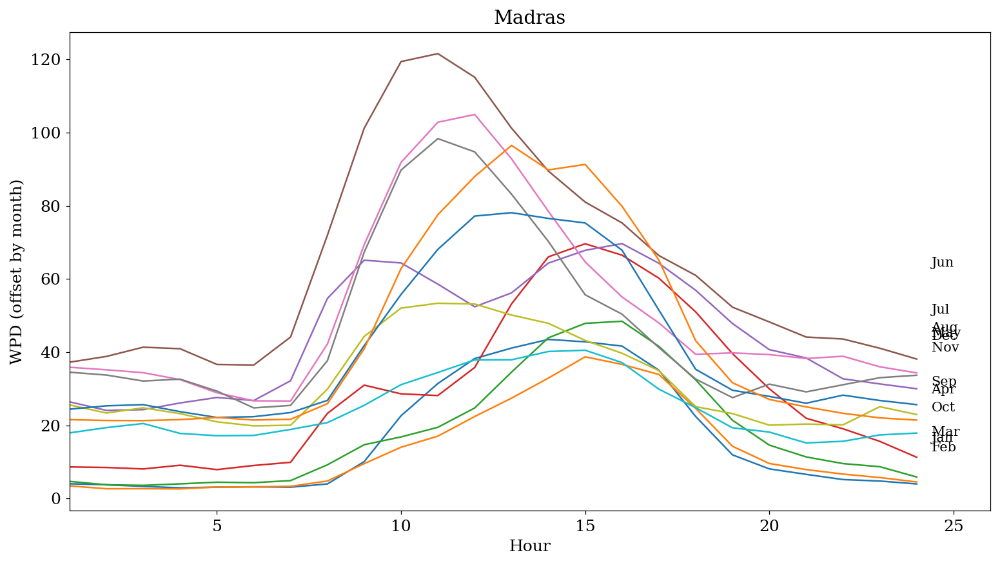

Saved: Madras_Ridge_Diurnal.png


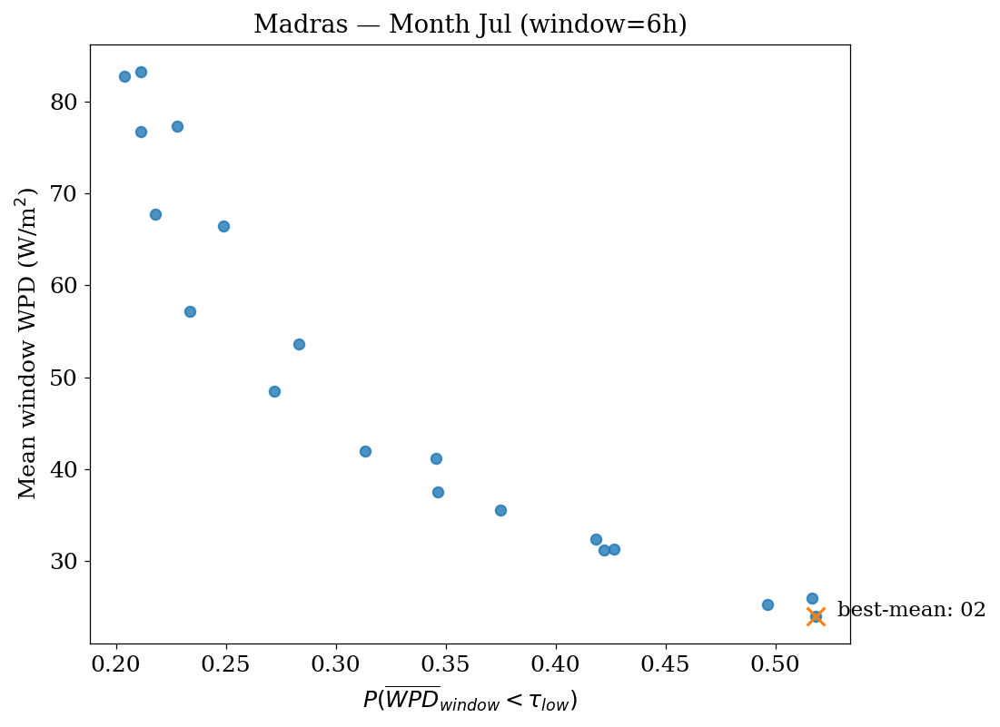

Saved: Madras_RiskLossFrontier_Jul.png


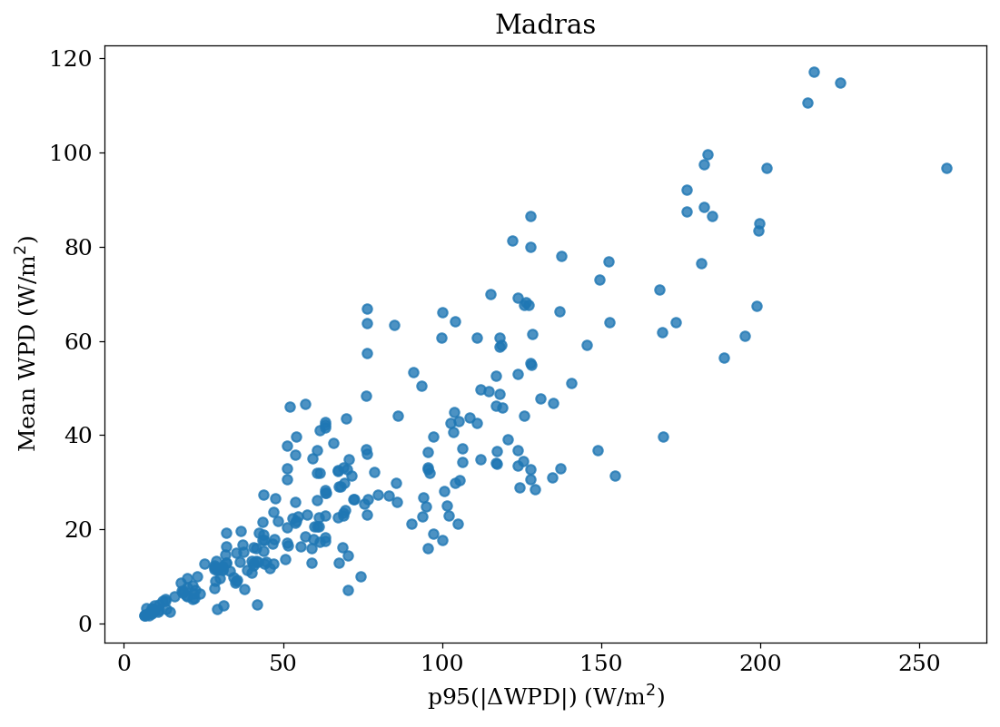

Saved: Madras_RampVsEnergy.png


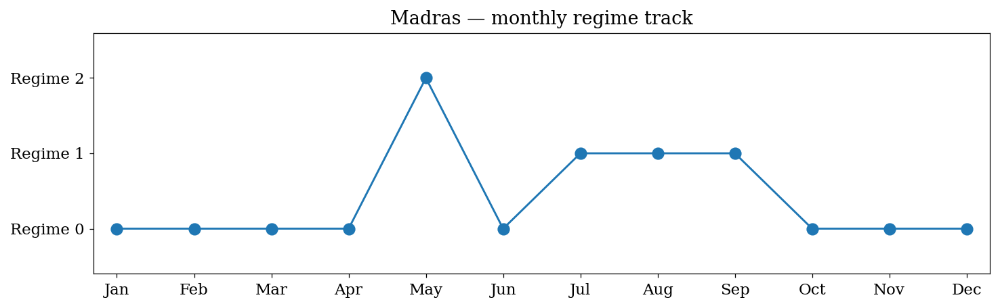

Saved: Madras_RegimeTrack.png


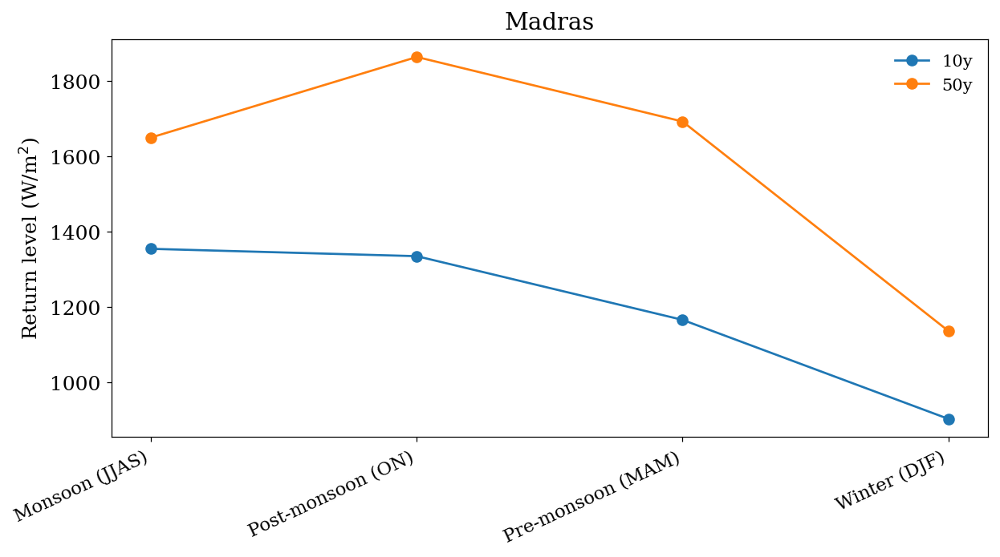

Saved: Madras_Extremes_ReturnLevels.png


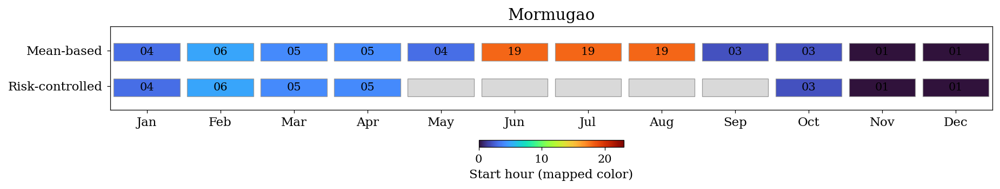

Saved: Mormugao_MaintenanceStrips.png


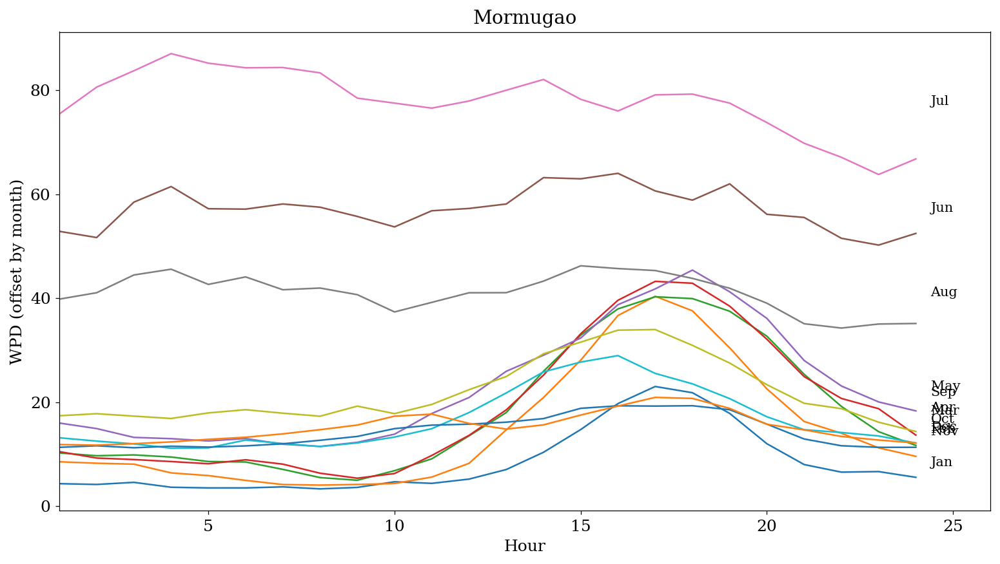

Saved: Mormugao_Ridge_Diurnal.png


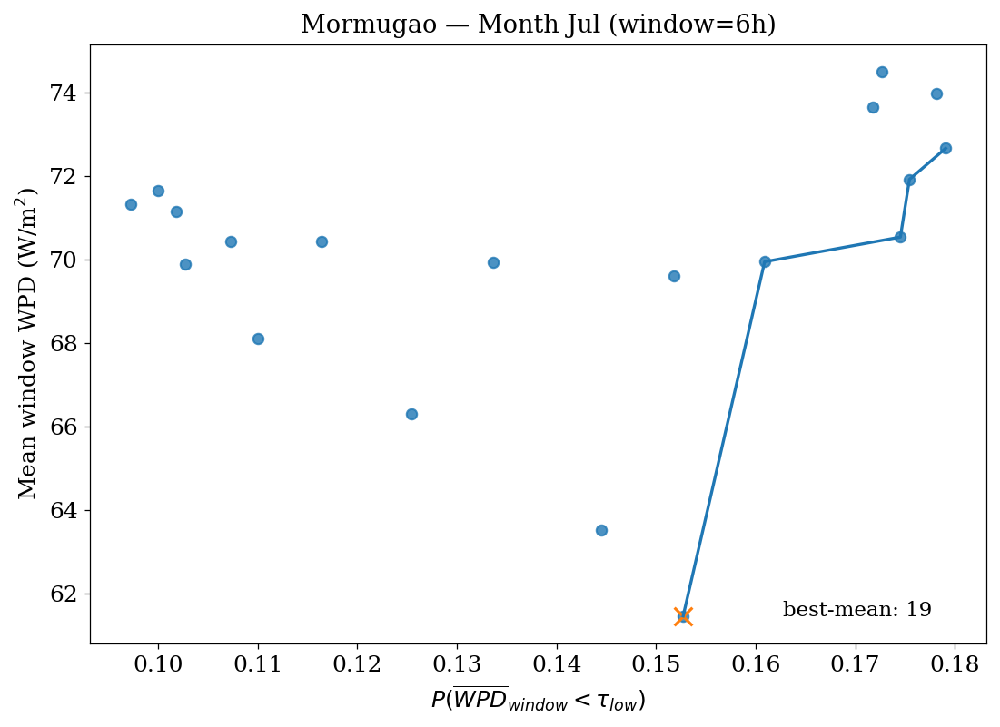

Saved: Mormugao_RiskLossFrontier_Jul.png


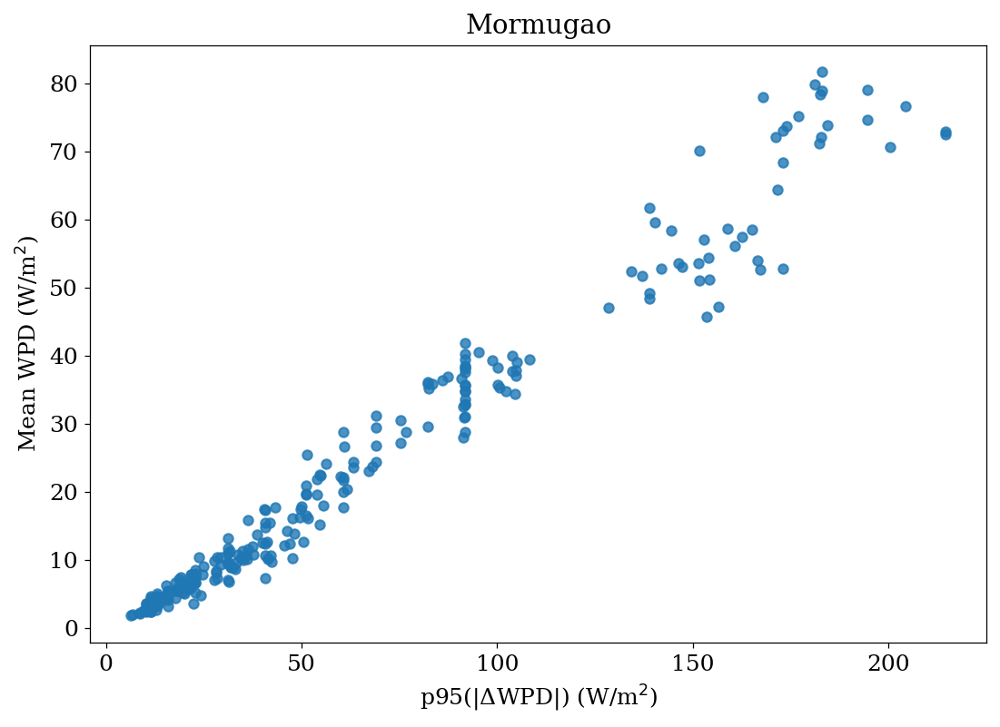

Saved: Mormugao_RampVsEnergy.png


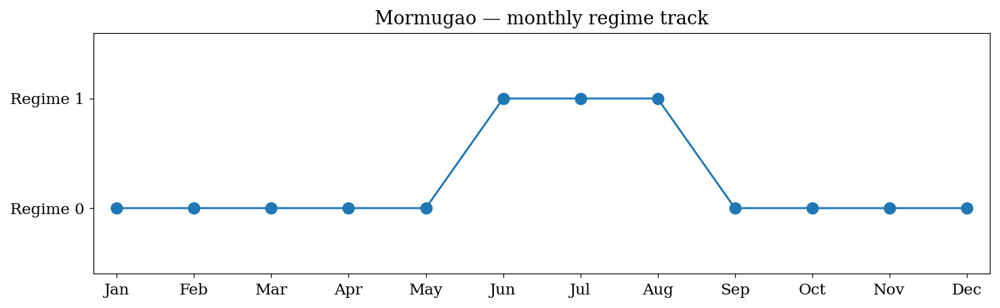

Saved: Mormugao_RegimeTrack.png


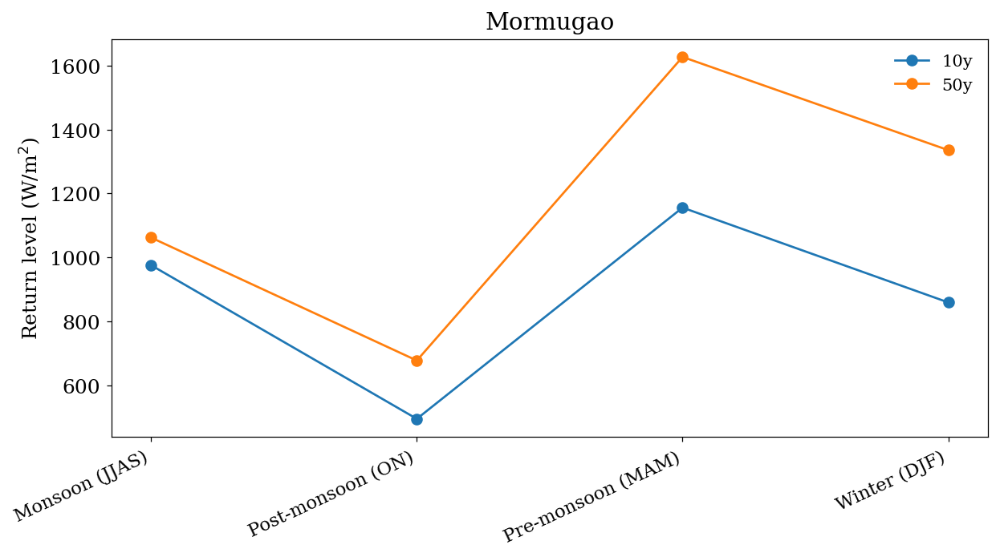

Saved: Mormugao_Extremes_ReturnLevels.png


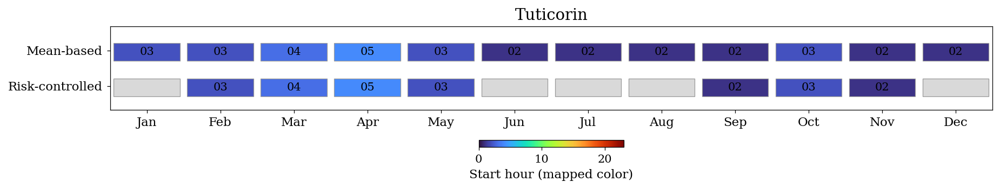

Saved: Tuticorin_MaintenanceStrips.png


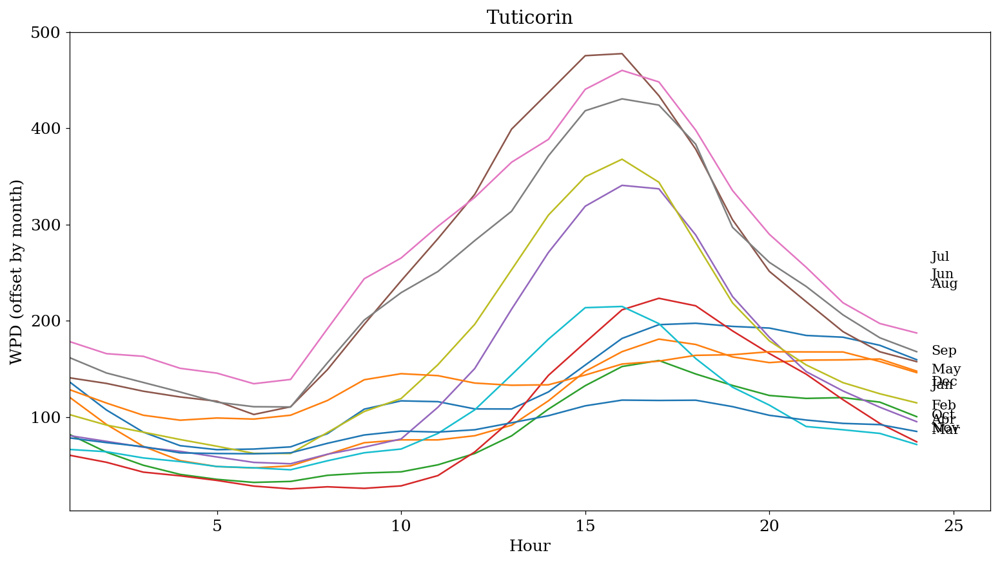

Saved: Tuticorin_Ridge_Diurnal.png


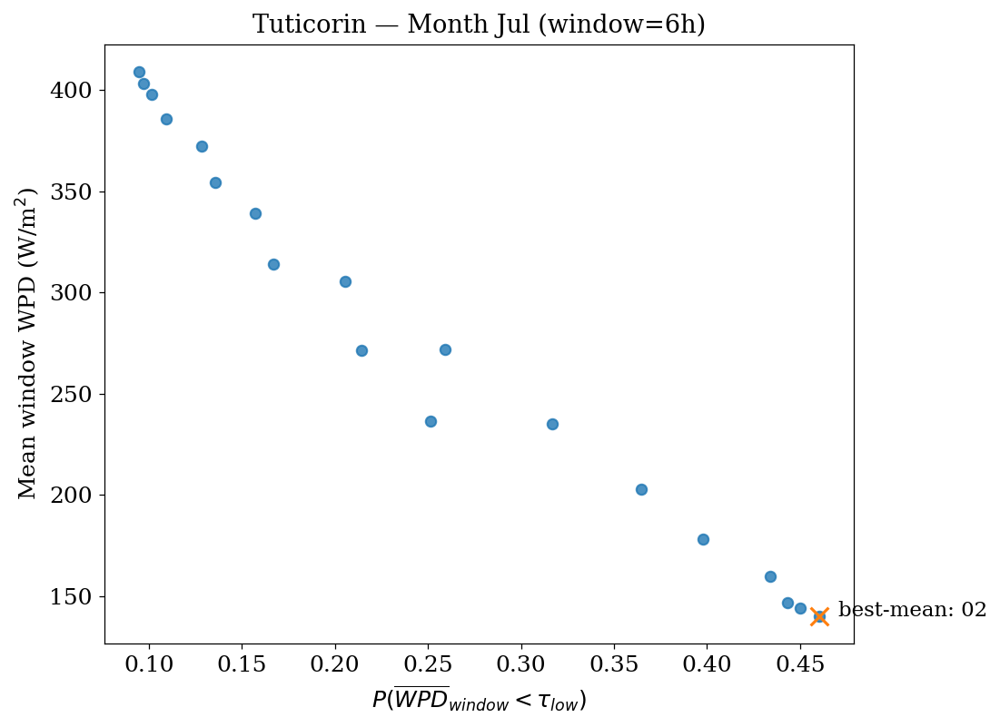

Saved: Tuticorin_RiskLossFrontier_Jul.png


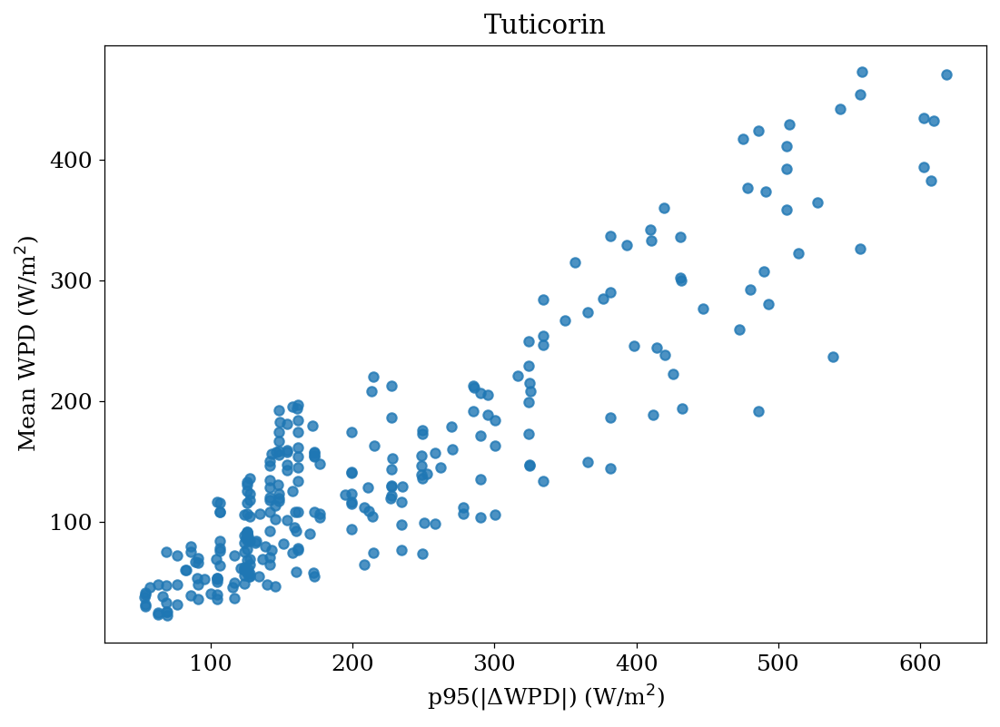

Saved: Tuticorin_RampVsEnergy.png


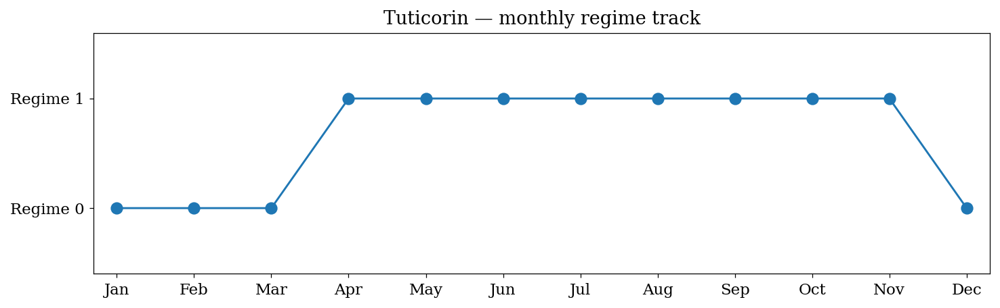

Saved: Tuticorin_RegimeTrack.png


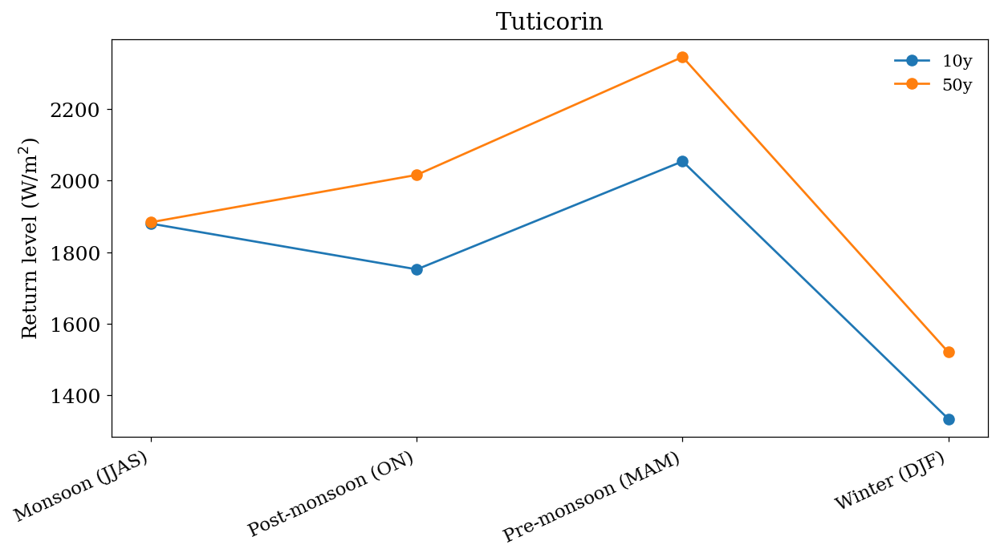

Saved: Tuticorin_Extremes_ReturnLevels.png


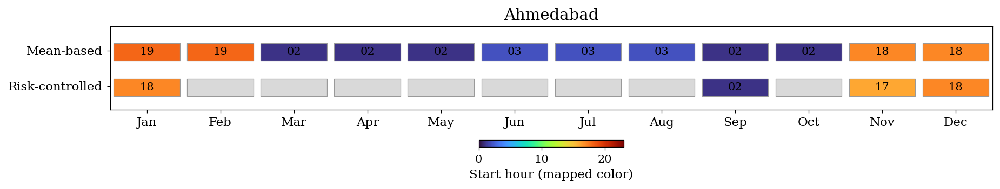

Saved: Ahmedabad_MaintenanceStrips.png


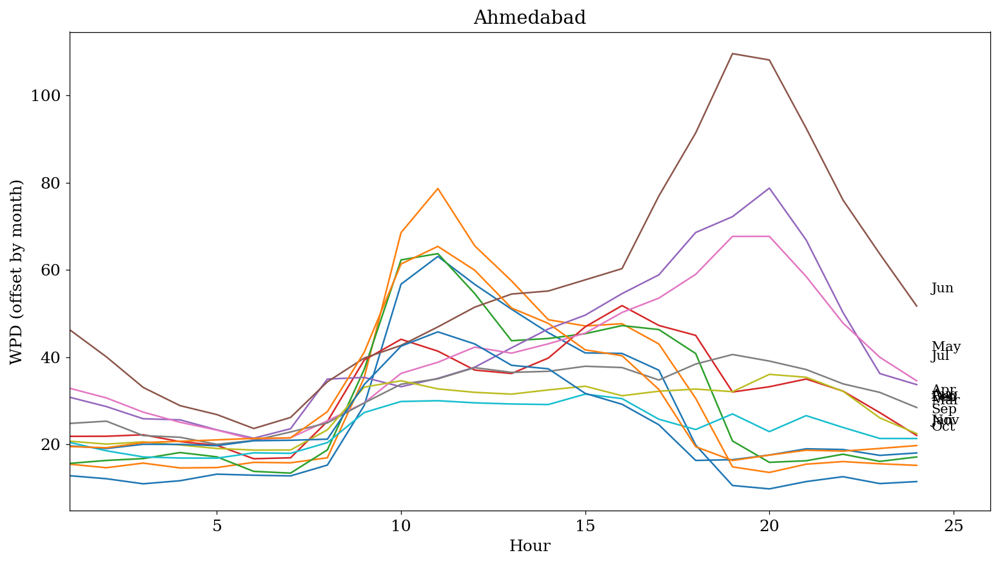

Saved: Ahmedabad_Ridge_Diurnal.png


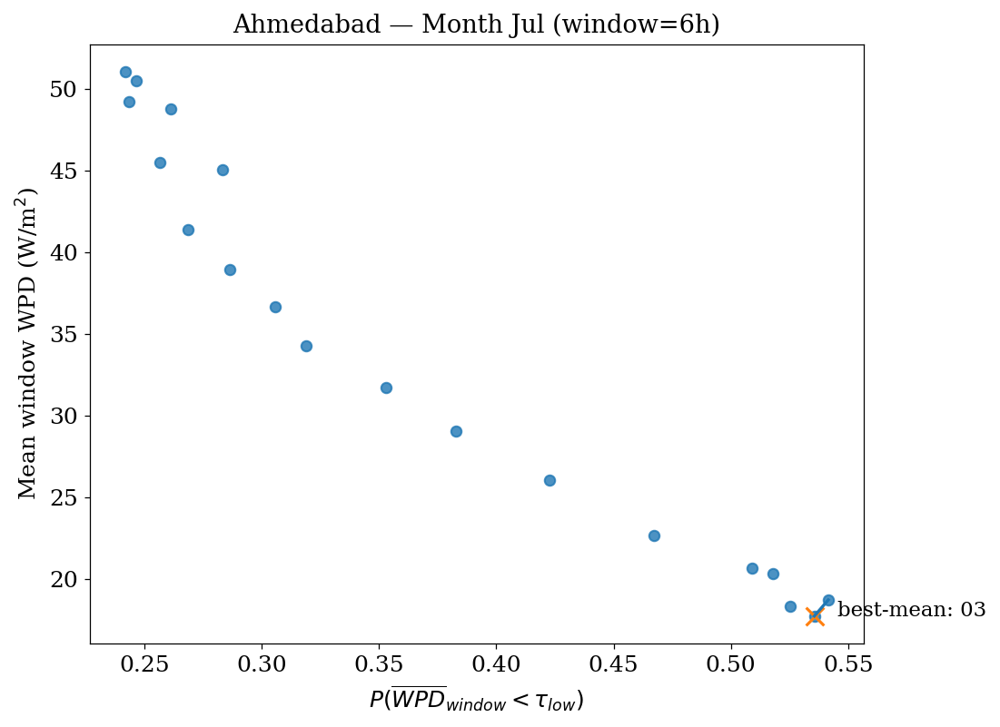

Saved: Ahmedabad_RiskLossFrontier_Jul.png


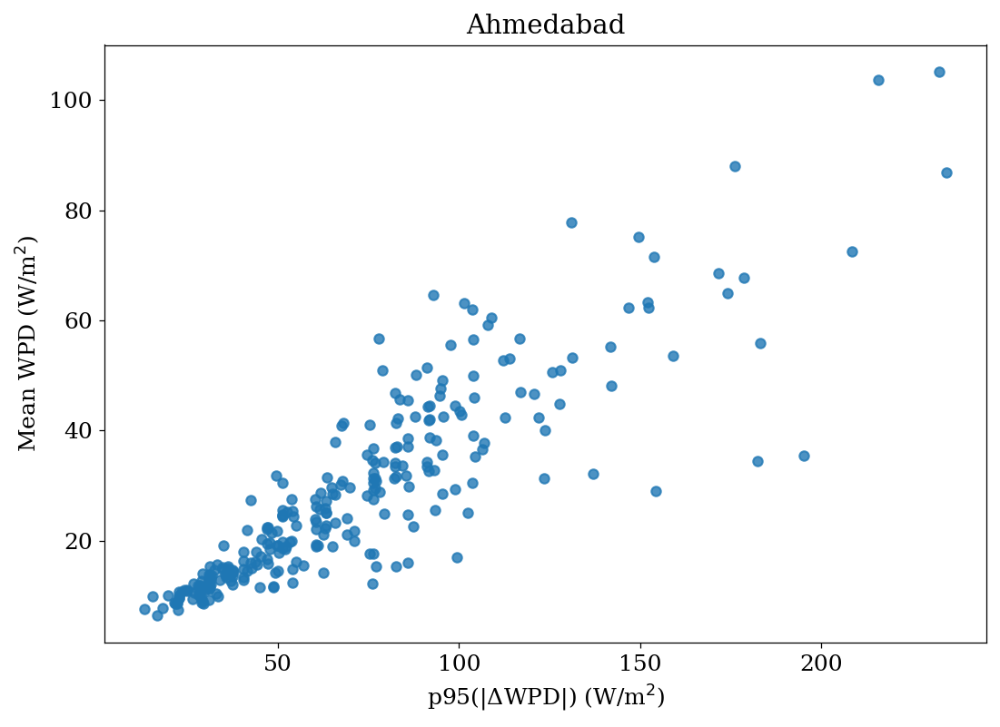

Saved: Ahmedabad_RampVsEnergy.png


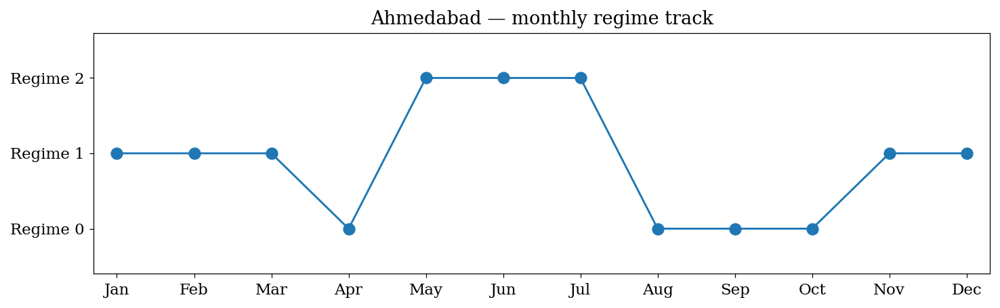

Saved: Ahmedabad_RegimeTrack.png


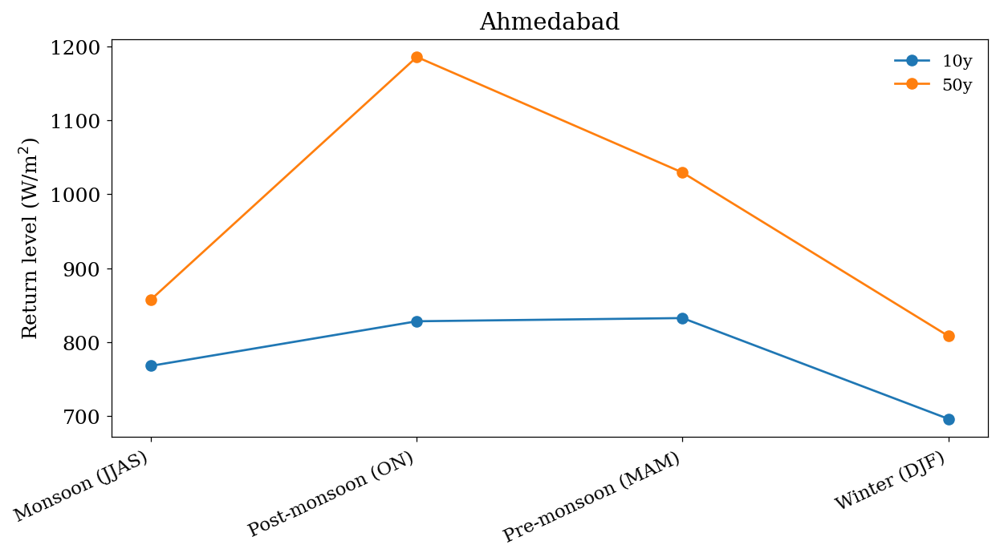

Saved: Ahmedabad_Extremes_ReturnLevels.png


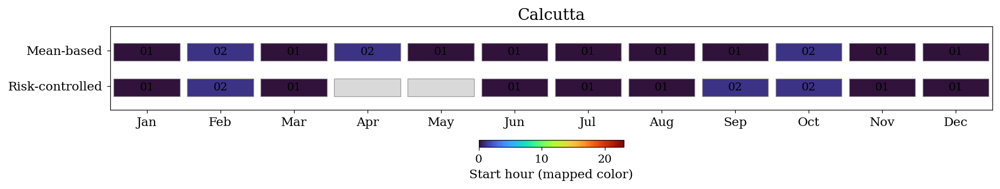

Saved: Calcutta_MaintenanceStrips.png


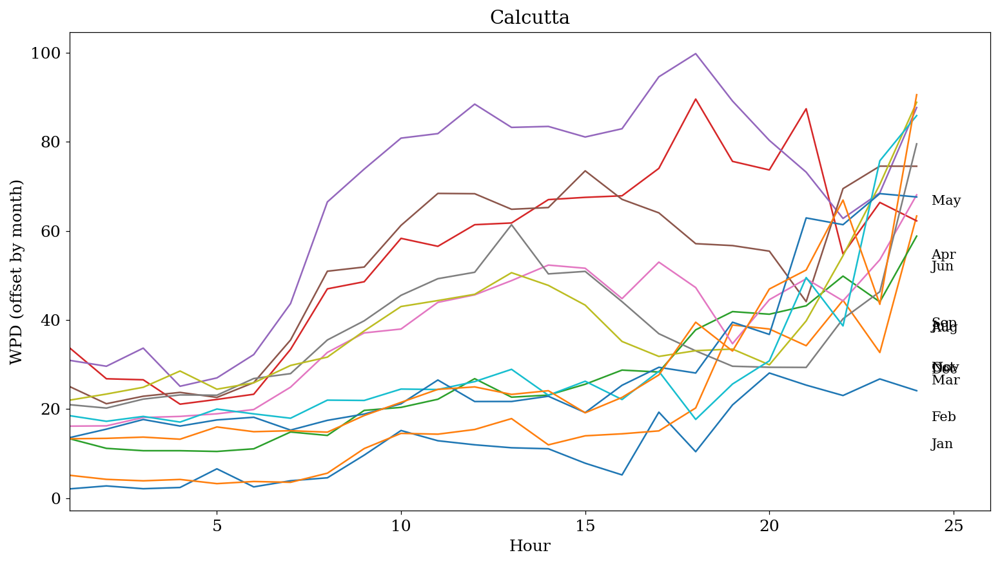

Saved: Calcutta_Ridge_Diurnal.png


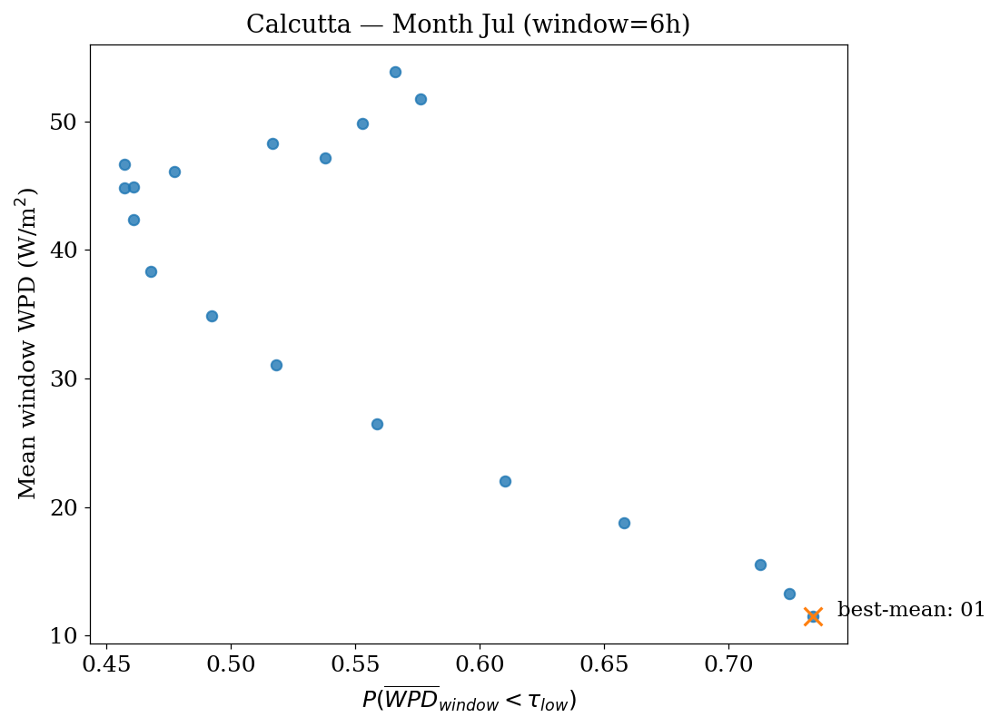

Saved: Calcutta_RiskLossFrontier_Jul.png


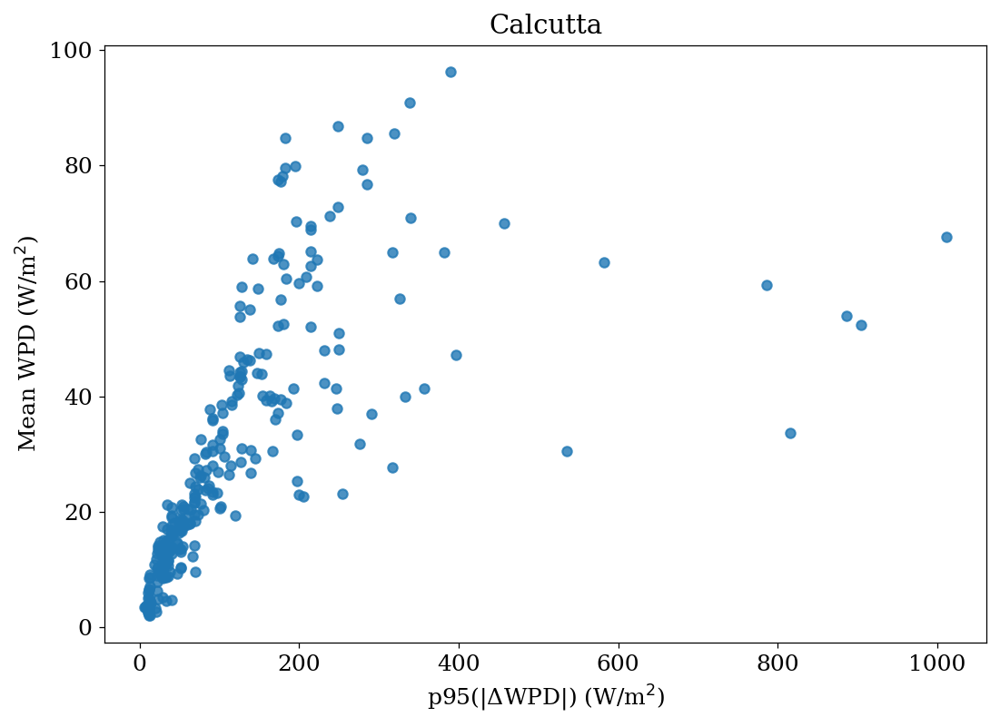

Saved: Calcutta_RampVsEnergy.png


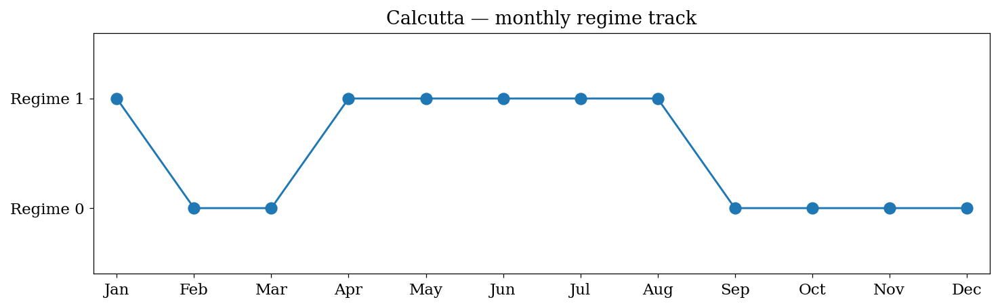

Saved: Calcutta_RegimeTrack.png


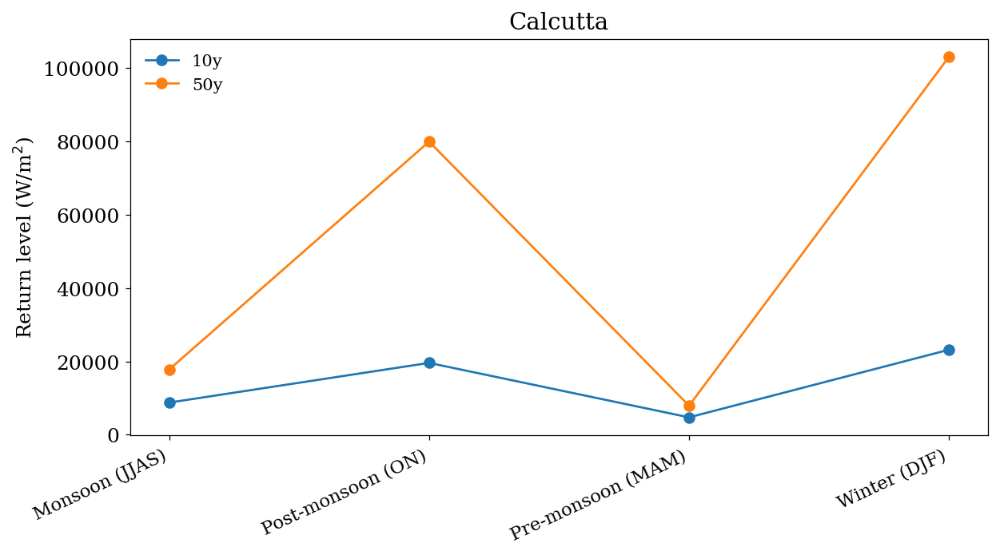

Saved: Calcutta_Extremes_ReturnLevels.png


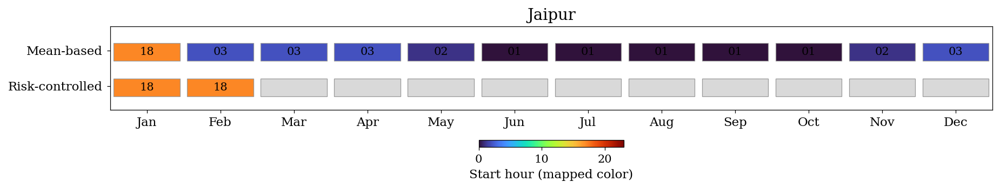

Saved: Jaipur_MaintenanceStrips.png


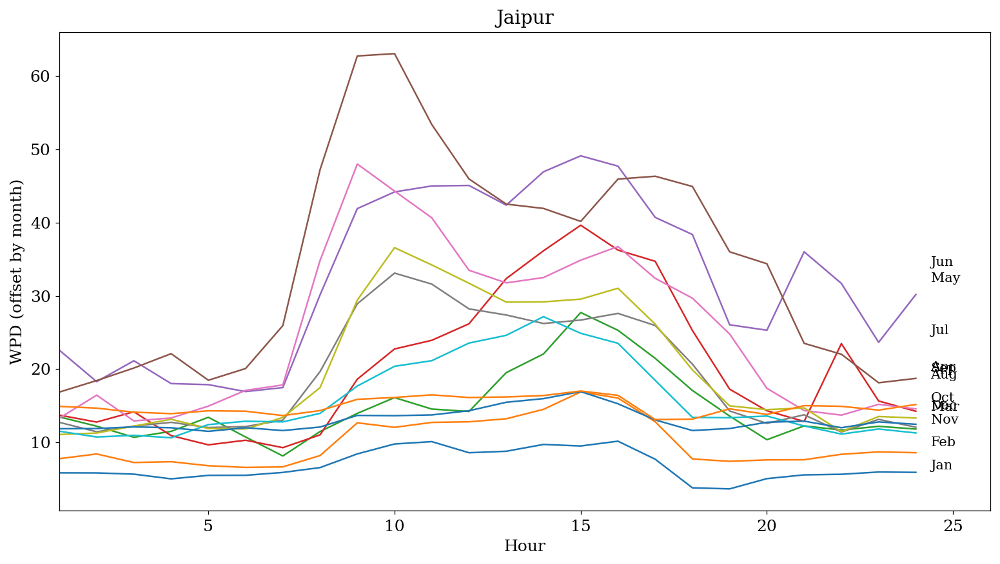

Saved: Jaipur_Ridge_Diurnal.png


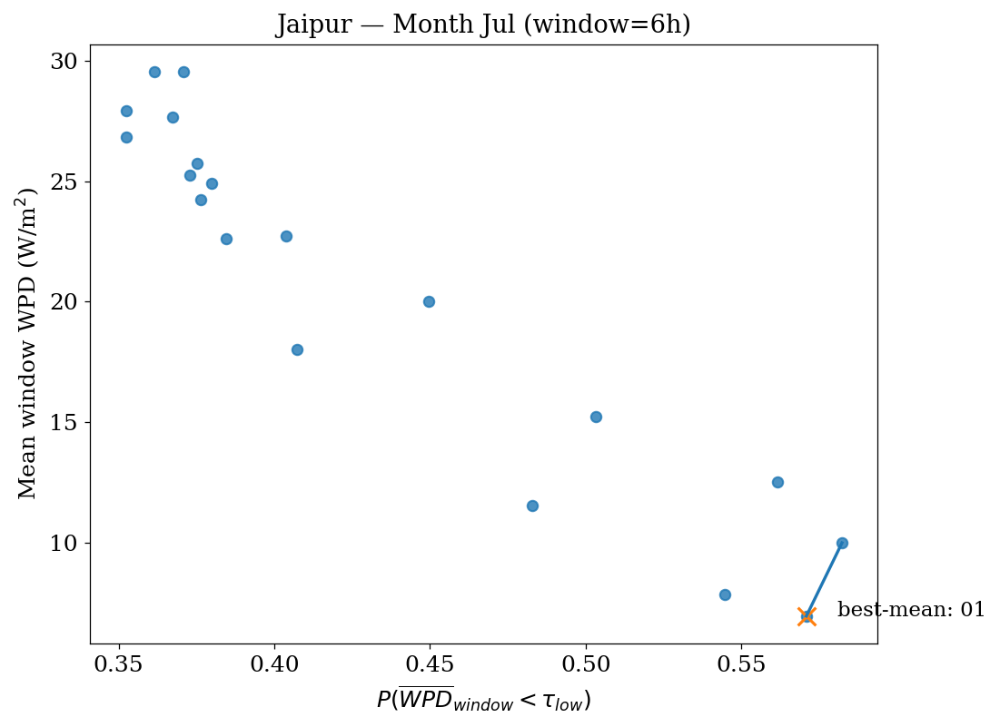

Saved: Jaipur_RiskLossFrontier_Jul.png


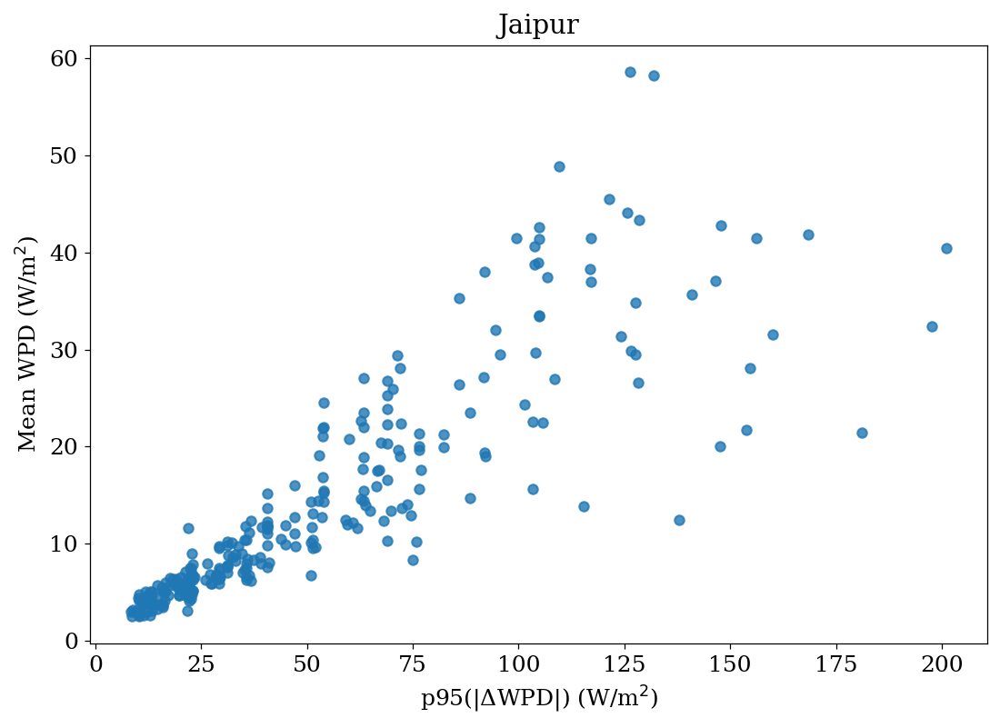

Saved: Jaipur_RampVsEnergy.png


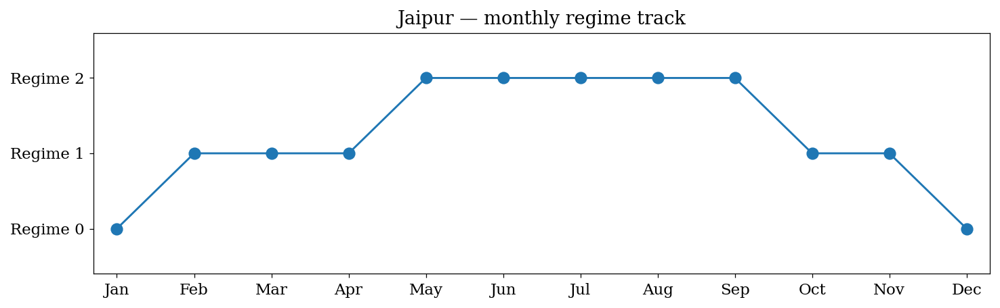

Saved: Jaipur_RegimeTrack.png


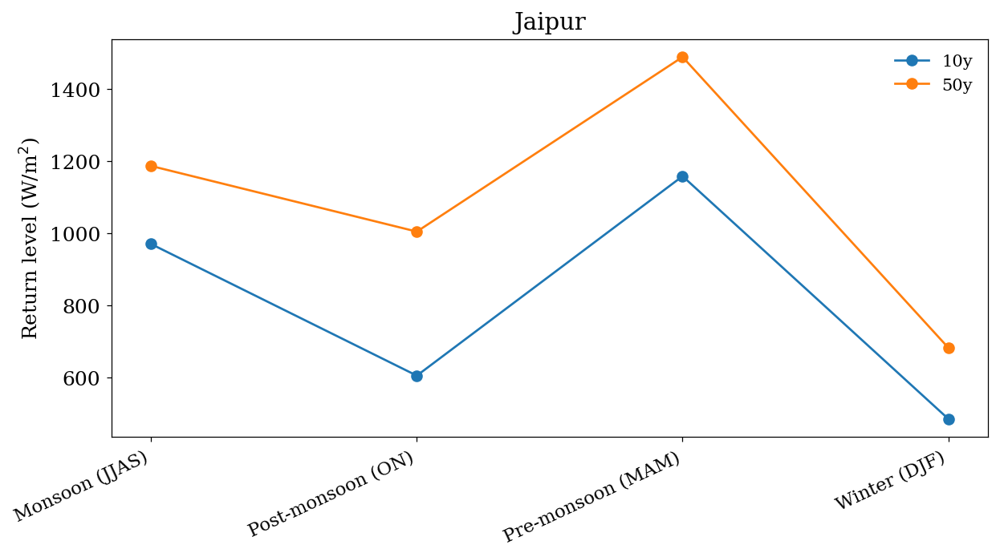

Saved: Jaipur_Extremes_ReturnLevels.png
Done. Generated non-contour figures for each site.


In [17]:
# ============================================================
# NON-CONTOUR FIGURES — operational + meaningful
# Generates:
# 1) Monthly maintenance strips (mean-based + risk-controlled)
# 2) Ridge plot of diurnal WPD by month
# 3) Risk–loss frontier (Pareto)
# 4) Ramp vs Mean WPD scatter (month-hour)
# 5) Regime transition Sankey-like (alluvial using stacked flows)
# 6) Seasonal extreme return levels (10y/50y)
# ============================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -------- helpers reused --------
def kmh_to_ms(x): return x/3.6
def instantaneous_wpd_from_v(v_ms, rho=1.225): return 0.5*rho*(v_ms**3)

def clean_wind_matrix(V_ms, clip_hi_q=0.999):
    V = V_ms.copy()
    V[V <= 0] = np.nan
    hi = np.nanquantile(V, clip_hi_q)
    V[V > hi] = hi
    return V

def make_day_hour_wpd(df, hour_cols, rho=1.225):
    V = kmh_to_ms(df[hour_cols].to_numpy(dtype=float))
    V = clean_wind_matrix(V)
    P = instantaneous_wpd_from_v(V, rho=rho)
    months = df["MN"].to_numpy(dtype=int)
    years  = df["YEAR"].to_numpy(dtype=int)
    return P, months, years

def compute_window_stats_for_month(Pm, tau_low, window_h=6):
    # returns dataframe per start hour (0..18)
    rows = []
    for s in range(0, 24-window_h+1):
        win = Pm[:, s:s+window_h]
        daily_mean = np.nanmean(win, axis=1)
        mu = float(np.nanmean(daily_mean))
        p_ok = float(np.mean(daily_mean < tau_low))
        rows.append((s, mu, p_ok))
    return pd.DataFrame(rows, columns=["start0", "meanWPD", "P_ok"])

def best_windows_per_month(P, months, tau_low, window_h=6, prob_target=0.70):
    out = []
    for m in range(1, 13):
        mask = months == m
        if mask.sum() < 20:
            out.append((m, np.nan, np.nan))
            continue
        Pm = P[mask, :]
        dfw = compute_window_stats_for_month(Pm, tau_low, window_h=window_h)
        s_mean = int(dfw.loc[dfw["meanWPD"].idxmin(), "start0"])
        feasible = dfw[dfw["P_ok"] >= prob_target]
        s_risk = np.nan
        if len(feasible) > 0:
            s_risk = int(feasible.loc[feasible["meanWPD"].idxmin(), "start0"])
        out.append((m, s_mean, s_risk))
    return pd.DataFrame(out, columns=["Month","BestStart_Mean","BestStart_Risk"])

def ramp_p95_month_hour(P, months, q=0.95):
    ramp = np.full((24,12), np.nan)
    for m in range(1,13):
        mask = months==m
        if mask.sum() < 20:
            continue
        Pm = P[mask,:]
        d = np.abs(Pm[:,1:] - Pm[:,:-1])  # (days,23)
        for h in range(23):
            x = d[:,h]
            x = x[np.isfinite(x)]
            if x.size < 30:
                continue
            ramp[h,m-1] = np.quantile(x,q)
    return ramp

# -------- Plot 1: maintenance strips --------
def plot_maintenance_strips(city, win_df, out_png):
    # Two rows: mean-based and risk-based best start hour across months
    fig = plt.figure(figsize=(12.5, 2.5))
    ax = plt.gca()

    # map hours to 0..23 and show as colored bars
    x = np.arange(1, 13)
    mean_st = win_df["BestStart_Mean"].to_numpy(dtype=float)
    risk_st = win_df["BestStart_Risk"].to_numpy(dtype=float)

    # We draw two horizontal strips
    for i, arr in enumerate([mean_st, risk_st]):
        y0 = 1.2 - i*0.6
        for m in range(12):
            v = arr[m]
            # show missing as gray
            if not np.isfinite(v):
                ax.add_patch(plt.Rectangle((m+0.55, y0-0.18), 0.9, 0.30, color="0.85", ec="0.6", lw=0.6))
                continue
            # normalize hour for colormap
            c = plt.cm.turbo(v / 23.0)
            ax.add_patch(plt.Rectangle((m+0.55, y0-0.18), 0.9, 0.30, color=c, ec="0.6", lw=0.6))
            ax.text(m+1.0, y0-0.03, f"{int(v)+1:02d}", ha="center", va="center", fontsize=10)

    ax.set_xlim(0.5, 12.5)
    ax.set_ylim(0.2, 1.6)
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(MONTH_LABELS, fontsize=11)
    ax.set_yticks([1.2, 0.6])
    ax.set_yticklabels(["Mean-based", "Risk-controlled"], fontsize=11)
    ax.set_title(city, fontsize=14, fontweight="normal", pad=6)
    for s in ax.spines.values(): s.set_linewidth(0.6)

    # Add a small horizontal colorbar for hour mapping (optional)
    sm = plt.cm.ScalarMappable(cmap="turbo", norm=plt.Normalize(0,23))
    cbar = plt.colorbar(sm, ax=ax, orientation="horizontal", fraction=0.06, pad=0.25)
    cbar.set_label("Start hour (mapped color)", fontsize=11)
    cbar.ax.tick_params(labelsize=10, width=0.6, length=3)

    plt.tight_layout()
    plt.savefig(out_png, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png)

# -------- Plot 2: ridge plot of diurnal mean WPD by month --------
def plot_ridge_diurnal(city, P, months, out_png):
    fig = plt.figure(figsize=(10.5, 6.0))
    ax = plt.gca()

    base = 0.0
    scale = 0.9  # vertical separation
    h = np.arange(1,25)

    # compute monthly mean diurnal
    for mi, m in enumerate(range(1,13)):
        mask = months==m
        if mask.sum() < 20:
            continue
        prof = np.nanmean(P[mask,:], axis=0)
        prof = np.nan_to_num(prof, nan=np.nanmean(prof))
        y = prof + mi*scale
        ax.plot(h, y, lw=1.2)
        ax.text(24.4, mi*scale + np.nanmean(prof), MONTH_LABELS[m-1], va="center", fontsize=10)

    ax.set_xlim(1, 26)
    ax.set_xlabel("Hour", fontsize=12)
    ax.set_ylabel("WPD (offset by month)", fontsize=12)
    ax.set_title(city, fontsize=14, fontweight="normal", pad=6)
    for s in ax.spines.values(): s.set_linewidth(0.6)

    plt.tight_layout()
    plt.savefig(out_png, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png)

# -------- Plot 3: risk–loss frontier (Pareto) for a chosen month --------
def plot_risk_loss_frontier(city, P, months, tau_low, month=6, window_h=6, out_png="frontier.png"):
    mask = months==month
    if mask.sum() < 20:
        print("Not enough data for month", month)
        return
    Pm = P[mask,:]
    dfw = compute_window_stats_for_month(Pm, tau_low, window_h=window_h)

    # Pareto: maximize P_ok, minimize meanWPD
    X = dfw["P_ok"].values
    Y = dfw["meanWPD"].values
    # simple Pareto filter
    pareto = []
    for i in range(len(dfw)):
        dominated = np.any((X >= X[i]) & (Y <= Y[i]) & ((X > X[i]) | (Y < Y[i])))
        if not dominated:
            pareto.append(i)
    pareto = np.array(sorted(pareto))

    fig = plt.figure(figsize=(7.5,5.5))
    ax = plt.gca()
    ax.scatter(X, Y, s=30, alpha=0.8)
    ax.plot(X[pareto], Y[pareto], lw=1.6)

    # highlight best mean
    i_mean = int(dfw["meanWPD"].idxmin())
    ax.scatter([X[i_mean]], [Y[i_mean]], s=90, marker="x")
    ax.text(X[i_mean]+0.01, Y[i_mean], f"best-mean: {int(dfw.loc[i_mean,'start0'])+1:02d}", fontsize=11)

    ax.set_xlabel(r"$P(\overline{WPD}_{window}<\tau_{low})$", fontsize=12)
    ax.set_ylabel("Mean window WPD (W/m$^2$)", fontsize=12)
    ax.set_title(f"{city} — Month {MONTH_LABELS[month-1]} (window={window_h}h)", fontsize=13, fontweight="normal", pad=6)
    for s in ax.spines.values(): s.set_linewidth(0.6)
    plt.tight_layout()
    plt.savefig(out_png, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png)

# -------- Plot 4: Ramp vs Mean WPD scatter (all month-hour points) --------
def plot_ramp_vs_energy(city, WPD_mean_grid, Ramp_p95_grid, out_png):
    # Flatten month-hour (exclude NaNs)
    y = WPD_mean_grid.reshape(-1)
    x = Ramp_p95_grid.reshape(-1)
    mask = np.isfinite(x) & np.isfinite(y)
    x, y = x[mask], y[mask]

    fig = plt.figure(figsize=(7.5,5.5))
    ax = plt.gca()
    ax.scatter(x, y, s=25, alpha=0.8)
    ax.set_xlabel("p95(|ΔWPD|) (W/m$^2$)", fontsize=12)
    ax.set_ylabel("Mean WPD (W/m$^2$)", fontsize=12)
    ax.set_title(city, fontsize=14, fontweight="normal", pad=6)
    for s in ax.spines.values(): s.set_linewidth(0.6)

    plt.tight_layout()
    plt.savefig(out_png, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png)

# -------- Plot 5: simple alluvial-like regime flow (months -> ranks) --------
def plot_regime_alluvial(city, clus_df, out_png):
    d = clus_df[clus_df["City"]==city].copy()
    if len(d)==0:
        print("No clustering rows for", city)
        return
    d = d.sort_values("Month")
    ranks = d["RegimeRank(0=low..)"].to_numpy(dtype=int)
    months = d["Month"].to_numpy(dtype=int)

    k = int(np.max(ranks)+1)
    # count months per regime
    counts = np.zeros(k, dtype=int)
    for r in ranks: counts[r]+=1

    fig = plt.figure(figsize=(10,3.2))
    ax = plt.gca()

    # draw month nodes as points at y=rank
    ax.plot(months, ranks, lw=1.4)
    ax.scatter(months, ranks, s=60)

    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(MONTH_LABELS, fontsize=11)
    ax.set_yticks(range(k))
    ax.set_yticklabels([f"Regime {i}" for i in range(k)], fontsize=11)
    ax.set_ylim(-0.6, k-0.4)
    ax.set_xlim(0.7, 12.3)
    ax.set_title(f"{city} — monthly regime track", fontsize=13, fontweight="normal", pad=6)
    for s in ax.spines.values(): s.set_linewidth(0.6)
    plt.tight_layout()
    plt.savefig(out_png, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png)

# -------- Plot 6: Seasonal extreme return levels --------
def plot_extremes_return_levels(city, ext_df, out_png):
    d = ext_df[ext_df["City"]==city].copy()
    if len(d)==0:
        print("No extremes rows for", city)
        return
    d = d.sort_values("Season")
    seasons = d["Season"].tolist()

    # find columns
    cols = [c for c in d.columns if c.startswith("ReturnLevel_")]
    if len(cols)==0:
        print("No ReturnLevel columns found")
        return

    fig = plt.figure(figsize=(8.5,4.8))
    ax = plt.gca()

    x = np.arange(len(seasons))
    for col in cols:
        ax.plot(x, d[col].values, marker="o", lw=1.3, label=col.replace("ReturnLevel_","").replace("_Wm2",""))

    ax.set_xticks(x)
    ax.set_xticklabels(seasons, rotation=25, ha="right", fontsize=11)
    ax.set_ylabel("Return level (W/m$^2$)", fontsize=12)
    ax.set_title(city, fontsize=14, fontweight="normal", pad=6)
    ax.legend(frameon=False, fontsize=10)
    for s in ax.spines.values(): s.set_linewidth(0.6)

    plt.tight_layout()
    plt.savefig(out_png, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png)

# ============================================================
# RUN FOR ALL SITES (uses existing pipeline outputs if present)
# If you have site_results/clus_df/ext_df already, it will use them.
# Otherwise, it recomputes WPD per site from Excel.
# ============================================================

# If site_results not present, recompute minimal pieces:
if "site_results" not in globals():
    print("site_results not found — run the main pipeline first.")
else:
    for city in SITES.keys():
        # Recompute per-site P quickly (safe)
        path = resolve_file(SITES[city])
        df, hour_cols, _ = load_imd_excel(path)
        P, months, years = make_day_hour_wpd(df, hour_cols, rho=RHO)

        tau_low = site_results[city]["tau_low"]

        # 1) maintenance strip
        win_df = best_windows_per_month(P, months, tau_low, window_h=WINDOW_H, prob_target=ROBUST_PROB_TARGET)
        plot_maintenance_strips(city, win_df, out_png=f"{city}_MaintenanceStrips.png")

        # 2) ridge plot
        plot_ridge_diurnal(city, P, months, out_png=f"{city}_Ridge_Diurnal.png")

        # 3) frontier plot for one key month (Monsoon peak default: Jul = 7)
        plot_risk_loss_frontier(city, P, months, tau_low, month=7, window_h=WINDOW_H, out_png=f"{city}_RiskLossFrontier_Jul.png")

        # 4) ramp vs energy scatter using existing grids from site_results
        plot_ramp_vs_energy(city, site_results[city]["WPD_mean"], site_results[city]["Ramp_p95"], out_png=f"{city}_RampVsEnergy.png")

        # 5) regime track plot (requires clus_df)
        if "clus_df" in globals():
            plot_regime_alluvial(city, clus_df, out_png=f"{city}_RegimeTrack.png")

        # 6) extremes return levels (requires ext_df)
        if "ext_df" in globals():
            plot_extremes_return_levels(city, ext_df, out_png=f"{city}_Extremes_ReturnLevels.png")

print("Done. Generated non-contour figures for each site.")


[OK] Madras: sheet='wind_43279', tau_low=12.66 W/m^2
[OK] Mormugao: sheet='wind_43196', tau_low=5.93 W/m^2
[OK] Tuticorin: sheet='wind_15208', tau_low=75.38 W/m^2
[OK] Ahmedabad: sheet='wind_42647', tau_low=14.30 W/m^2
[OK] Calcutta: sheet='Sheet1', tau_low=13.32 W/m^2
[OK] Jaipur: sheet='wind_42348', tau_low=5.84 W/m^2


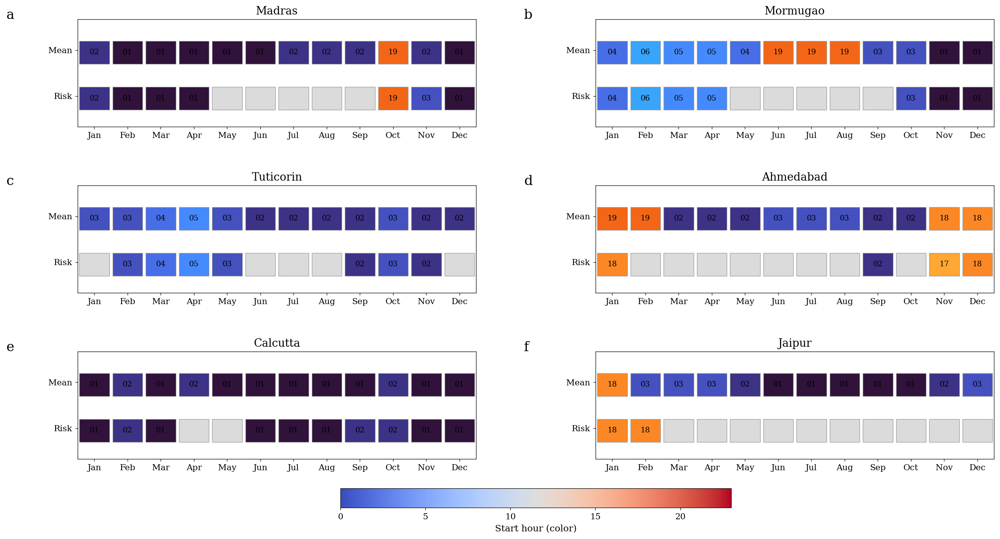

Saved Fig1_MaintenanceStrips_Grid.(png/pdf)


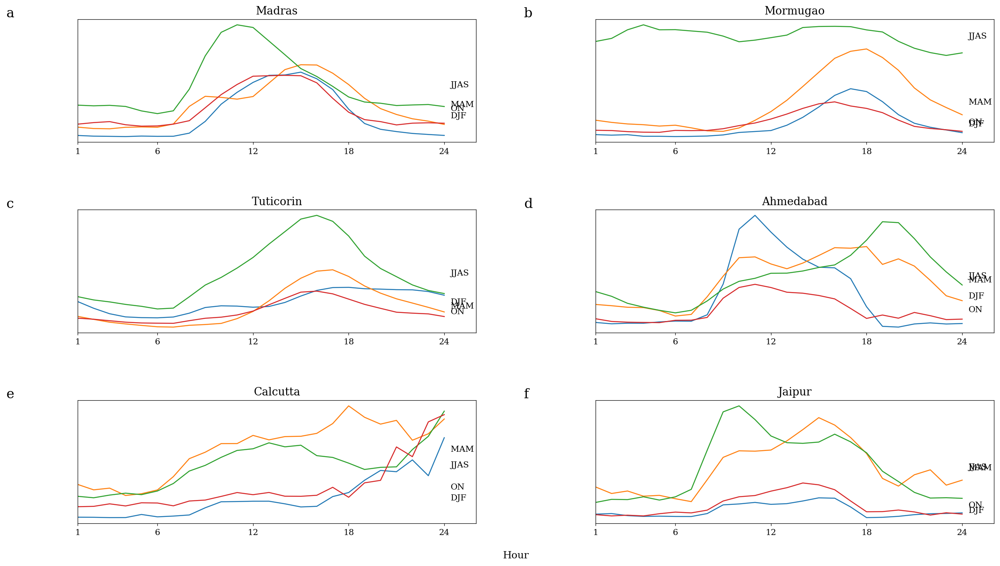

Saved Fig2_SeasonalDiurnalProfiles_Grid.(png/pdf)


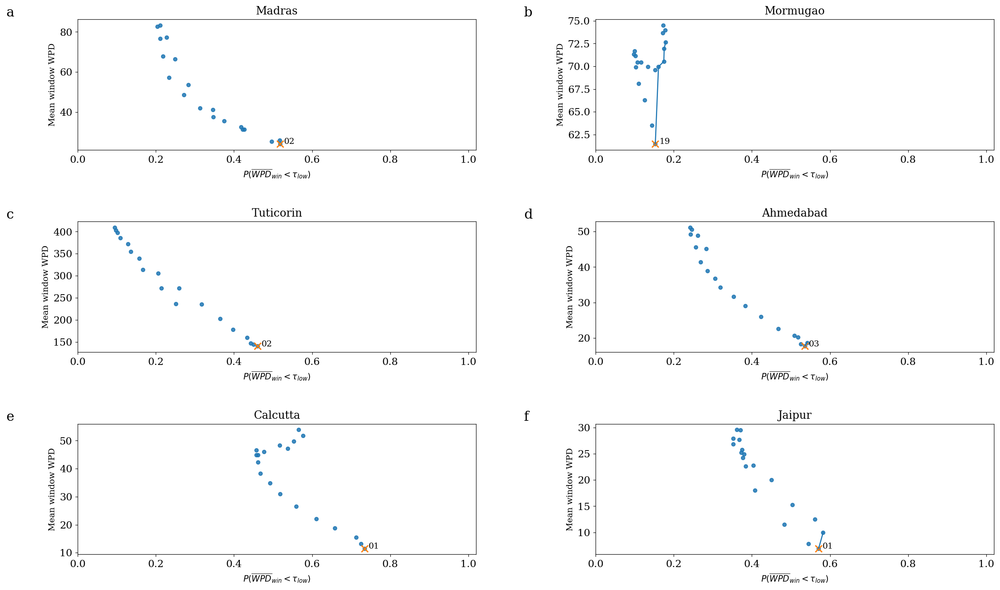

Saved Fig3_RiskLossFrontier_Jul_Grid.(png/pdf)


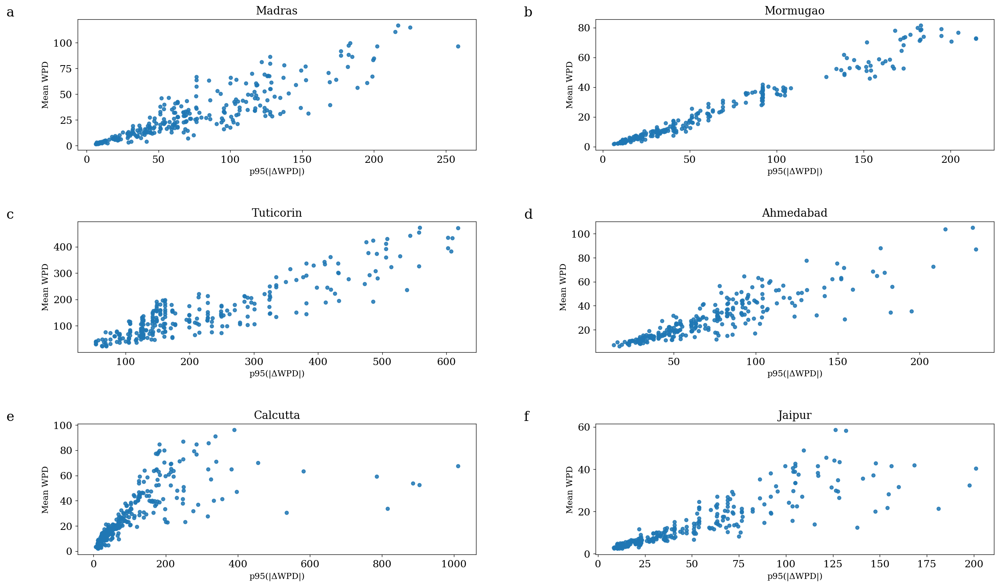

Saved Fig4_RampVsEnergy_Grid.(png/pdf)


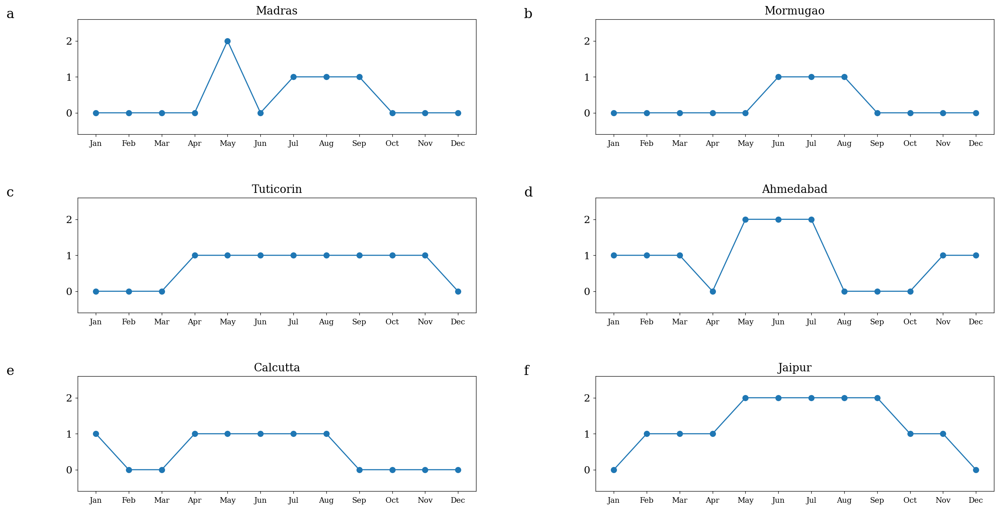

Saved Fig5_RegimeTrack_DTW_Grid.(png/pdf)


In [18]:
# ============================================================
# ELSEVIER-READY NON-CONTOUR GRID FIGURES (3×2 for 6 sites)
# Produces 6 figures (each is a grid across cities):
# 1) Maintenance strips (mean vs risk-controlled)
# 2) Seasonal diurnal profiles (ridge-like)
# 3) Risk–loss frontier (Pareto) for July
# 4) Ramp vs mean WPD scatter (month-hour)
# 5) Regime track (DTW clustering monthly profiles)
# 6) Seasonal extreme return levels (GPD POT, 10y/50y)
#
# Assumes you uploaded the .xlsx files (IMD format): YEAR, MN, DT, S01..S24
# Hub height: 10 m (no extrapolation)
# ============================================================

!pip -q install openpyxl scipy tslearn scikit-learn

import os, re, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from scipy.stats import genpareto
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
from tslearn.metrics import cdist_dtw
from sklearn.metrics import silhouette_score

warnings.filterwarnings("ignore")

# -------------------------
# STYLE (Elsevier-clean)
# -------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 12,
    "axes.titleweight": "normal",
    "axes.labelweight": "normal",
    "axes.linewidth": 0.6,
    "xtick.major.width": 0.6,
    "ytick.major.width": 0.6,
    "xtick.major.size": 3,
    "ytick.major.size": 3,
})

MONTH_LABELS = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
SEASONS = {
    "DJF": [12, 1, 2],
    "MAM": [3, 4, 5],
    "JJAS": [6, 7, 8, 9],
    "ON": [10, 11],
}

# -------------------------
# CONFIG
# -------------------------
RHO = 1.225
WINDOW_H = 6
PROB_TARGET = 0.70
CLIP_HI_Q = 0.999

# Extreme value settings
GPD_Q = 0.95
RETURN_PERIODS = [10, 50]  # years

# Clustering settings
K_MIN, K_MAX = 2, 6
RNG_SEED = 42

# tau_low setting (robust, meaningful):
# - uses 25th percentile over (month,hour) mean WPD grid by default
TAU_MODE = "mean_grid_p25"  # or "fixed" or "instant_p25"
TAU_FIXED = 80.0

# -------------------------
# File helpers
# -------------------------
def _norm(s: str) -> str:
    return re.sub(r"[^a-z0-9]+", "", s.lower())

def resolve_file(preferred_name: str):
    if os.path.exists(preferred_name):
        return preferred_name
    target = _norm(preferred_name)
    candidates = [f for f in os.listdir(".") if f.lower().endswith(".xlsx")]
    for f in candidates:
        if _norm(f) == target:
            return f
    for f in candidates:
        if target in _norm(f) or _norm(f) in target:
            return f
    raise FileNotFoundError(f"Could not match: {preferred_name}\nAvailable: {candidates}")

def find_wind_sheet(path: str):
    xl = pd.ExcelFile(path)
    for s in xl.sheet_names:
        try:
            df = pd.read_excel(path, sheet_name=s, header=1, nrows=5)
            cols = set(map(str, df.columns))
            has_core = {"YEAR","MN","DT"}.issubset(cols)
            has_hours = any(re.fullmatch(r"S\d{2}", str(c)) for c in df.columns)
            if has_core and has_hours:
                return s
        except Exception:
            pass
    return xl.sheet_names[0]

def load_imd_excel(path: str, sheet_name: str=None):
    if sheet_name is None:
        sheet_name = find_wind_sheet(path)
    df = pd.read_excel(path, sheet_name=sheet_name, header=1)
    hour_cols = [c for c in df.columns if re.fullmatch(r"S\d{2}", str(c))]
    hour_cols = sorted(hour_cols, key=lambda s: int(str(s)[1:]))
    df = df[["YEAR","MN","DT"] + hour_cols].copy()
    for c in hour_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")
    df["YEAR"] = pd.to_numeric(df["YEAR"], errors="coerce").astype("Int64")
    df["MN"]   = pd.to_numeric(df["MN"], errors="coerce").astype("Int64")
    df["DT"]   = pd.to_numeric(df["DT"], errors="coerce").astype("Int64")
    return df, hour_cols, sheet_name

# -------------------------
# Physics: WPD from samples
# -------------------------
def kmh_to_ms(x): return x / 3.6
def instantaneous_wpd_from_v(v_ms, rho=RHO): return 0.5 * rho * (v_ms ** 3)

def clean_wind_matrix(V_ms, clip_hi_q=CLIP_HI_Q):
    V = V_ms.copy()
    V[V <= 0] = np.nan
    hi = np.nanquantile(V, clip_hi_q)
    V[V > hi] = hi
    return V

def make_day_hour_wpd(df, hour_cols):
    V = kmh_to_ms(df[hour_cols].to_numpy(dtype=float))
    V = clean_wind_matrix(V)
    P = instantaneous_wpd_from_v(V, rho=RHO)  # (days,24)
    months = df["MN"].to_numpy(dtype=int)
    years  = df["YEAR"].to_numpy(dtype=int)
    return P, months, years

def mean_wpd_grid(P, months):
    G = np.full((24, 12), np.nan, dtype=float)  # hour×month
    for m in range(1, 13):
        mask = months == m
        if mask.sum() < 20:
            continue
        G[:, m-1] = np.nanmean(P[mask, :], axis=0)
    return G

def ramp_p95_grid(P, months, q=0.95):
    R = np.full((24, 12), np.nan, dtype=float)
    for m in range(1, 13):
        mask = months == m
        if mask.sum() < 20:
            continue
        Pm = P[mask, :]
        d = np.abs(Pm[:, 1:] - Pm[:, :-1])  # days×23
        for h in range(23):
            x = d[:, h]
            x = x[np.isfinite(x)]
            if x.size < 30:
                continue
            R[h, m-1] = np.quantile(x, q)
    return R

def choose_tau_low(P, months):
    if TAU_MODE == "fixed":
        return float(TAU_FIXED)
    Pf = P.reshape(-1)
    Pf = Pf[np.isfinite(Pf)]
    if Pf.size == 0:
        return np.nan
    if TAU_MODE == "instant_p25":
        return float(np.quantile(Pf, 0.25))
    # mean_grid_p25 (recommended)
    G = mean_wpd_grid(P, months)
    gv = G[np.isfinite(G)]
    if gv.size > 0:
        return float(np.quantile(gv, 0.25))
    return float(np.quantile(Pf, 0.25))

# -------------------------
# Maintenance windows (month)
# -------------------------
def window_stats_month(Pm, tau_low, window_h=WINDOW_H):
    rows = []
    for s in range(0, 24-window_h+1):
        win = Pm[:, s:s+window_h]
        daily_mean = np.nanmean(win, axis=1)
        mu = float(np.nanmean(daily_mean))
        p_ok = float(np.mean(daily_mean < tau_low))
        rows.append((s, mu, p_ok))
    return pd.DataFrame(rows, columns=["start0", "meanWPD", "P_ok"])

def best_windows_per_month(P, months, tau_low):
    out = []
    for m in range(1, 13):
        mask = months == m
        if mask.sum() < 20:
            out.append((m, np.nan, np.nan))
            continue
        Pm = P[mask, :]
        dfw = window_stats_month(Pm, tau_low)
        s_mean = int(dfw.loc[dfw["meanWPD"].idxmin(), "start0"])
        feasible = dfw[dfw["P_ok"] >= PROB_TARGET]
        s_risk = np.nan
        if len(feasible) > 0:
            s_risk = int(feasible.loc[feasible["meanWPD"].idxmin(), "start0"])
        out.append((m, s_mean, s_risk))
    return pd.DataFrame(out, columns=["Month", "BestStart_Mean", "BestStart_Risk"])

# -------------------------
# Risk–loss Pareto (single month)
# -------------------------
def pareto_indices(P_ok, meanWPD):
    # keep points that are not dominated (maximize P_ok, minimize meanWPD)
    keep = []
    for i in range(len(P_ok)):
        dominated = np.any((P_ok >= P_ok[i]) & (meanWPD <= meanWPD[i]) & ((P_ok > P_ok[i]) | (meanWPD < meanWPD[i])))
        if not dominated:
            keep.append(i)
    return np.array(sorted(keep), dtype=int)

# -------------------------
# Regime clustering (monthly mean profiles, DTW)
# -------------------------
def monthly_profiles(P, months):
    profs, mlist = [], []
    for m in range(1, 13):
        mask = months == m
        if mask.sum() < 10:
            continue
        profs.append(np.nanmean(P[mask, :], axis=0))
        mlist.append(m)
    return np.array(profs, dtype=float), np.array(mlist, dtype=int)

def cluster_regimes_dtw(P, months):
    profs, mlist = monthly_profiles(P, months)
    if profs.shape[0] < 6:
        return None
    X = profs[:, :, None]
    Xz = TimeSeriesScalerMeanVariance(mu=0., std=1.).fit_transform(X)

    D = cdist_dtw(Xz.squeeze(-1))
    best = None

    for k in range(K_MIN, min(K_MAX, Xz.shape[0]-1) + 1):
        km = TimeSeriesKMeans(n_clusters=k, metric="dtw", random_state=RNG_SEED)
        labels = km.fit_predict(Xz)
        sil = silhouette_score(D, labels, metric="precomputed")
        if (best is None) or (sil > best["sil"]):
            best = {"k": k, "labels": labels, "sil": float(sil)}

    # rank clusters by mean level (low->high)
    cluster_means = {c: float(np.mean(profs[best["labels"] == c])) for c in range(best["k"])}
    ordered = sorted(cluster_means.items(), key=lambda t: t[1])
    rank_map = {cid: rank for rank, (cid, _) in enumerate(ordered)}

    # month->rank in month order
    seq = np.full(12, np.nan)
    for i, m in enumerate(mlist):
        seq[m-1] = rank_map[int(best["labels"][i])]
    return {"seq": seq, "k": best["k"], "sil": best["sil"]}

# -------------------------
# Extremes (GPD POT by season)
# -------------------------
def extremes_return_levels(P, months, years):
    Pf = P.reshape(-1)
    Mf = np.repeat(months, P.shape[1])
    Yf = np.repeat(years, P.shape[1])

    rows = []
    for sname, smonths in SEASONS.items():
        mask = np.isin(Mf, smonths)
        x = Pf[mask]
        y = Yf[mask]
        x = x[np.isfinite(x)]
        y = y[np.isfinite(y)]
        if x.size < 200:
            continue

        u = float(np.quantile(x, GPD_Q))
        exc = x[x > u] - u
        if exc.size < 50:
            continue

        xi, loc, beta = genpareto.fit(exc, floc=0.0)
        xi, beta = float(xi), float(beta)

        yrs = np.unique(y.astype(int))
        n_years = max(1, len(yrs))
        lam = exc.size / n_years

        rls = {}
        for T in RETURN_PERIODS:
            if abs(xi) < 1e-8:
                zT = u + beta * np.log(T * lam)
            else:
                zT = u + (beta/xi) * ((T*lam)**xi - 1.0)
            rls[T] = float(zT)

        rows.append({"Season": sname, "u": u, "RL10": rls.get(10, np.nan), "RL50": rls.get(50, np.nan)})
    return pd.DataFrame(rows)

# -------------------------
# Grid utilities
# -------------------------
def make_grid(nrows=3, ncols=2, fig_w=16.5, row_h=3.1, hspace=0.55, wspace=0.30):
    fig_h = row_h * nrows
    fig, axes = plt.subplots(nrows, ncols, figsize=(fig_w, fig_h), constrained_layout=False)
    plt.subplots_adjust(left=0.06, right=0.98, top=0.95, bottom=0.08, hspace=hspace, wspace=wspace)
    return fig, axes

def panel_labels(axes, start='a', dx=-0.18, dy=1.10, fs=16):
    ch = ord(start)
    for ax in axes.flatten():
        ax.text(dx, dy, chr(ch), transform=ax.transAxes, fontsize=fs, ha="left", va="top")
        ch += 1

def thin_spines(ax):
    for s in ax.spines.values():
        s.set_linewidth(0.6)

# ============================================================
# DEFINE SITES (edit only if filenames differ)
# ============================================================
SITES = {
    "Madras":    "MADRAS-2-43279 (1) (1).xlsx",
    "Mormugao":  "MORMUGAO-43196 (2) (1).xlsx",
    "Tuticorin": "TUTICORIN H.P.-15208 (5).xlsx",
    "Ahmedabad": "ahamdabad new wind_42647 (1).xlsx",
    "Calcutta":  "Calcutta new-42809 (1).xlsx",
    "Jaipur":    "JAIPUR-42348.xlsx",
}

cities = list(SITES.keys())  # order in grid

# Precompute per city once
cache = {}
for city in cities:
    path = resolve_file(SITES[city])
    df, hour_cols, sheet = load_imd_excel(path)
    P, months, years = make_day_hour_wpd(df, hour_cols)
    tau = choose_tau_low(P, months)
    Gmean = mean_wpd_grid(P, months)
    Gramp = ramp_p95_grid(P, months, q=0.95)
    cache[city] = {"P": P, "months": months, "years": years, "tau": tau, "Gmean": Gmean, "Gramp": Gramp}
    print(f"[OK] {city}: sheet='{sheet}', tau_low={tau:.2f} W/m^2")

# ============================================================
# FIG 1 — Maintenance strips grid
# ============================================================
fig, axes = make_grid()
for i, city in enumerate(cities):
    ax = axes.flatten()[i]
    P = cache[city]["P"]
    months = cache[city]["months"]
    tau = cache[city]["tau"]

    win_df = best_windows_per_month(P, months, tau)

    mean_st = win_df["BestStart_Mean"].to_numpy(float)
    risk_st = win_df["BestStart_Risk"].to_numpy(float)

    for rowi, arr in enumerate([mean_st, risk_st]):
        y0 = 1.2 - rowi*0.60
        for m in range(12):
            v = arr[m]
            if not np.isfinite(v):
                ax.add_patch(plt.Rectangle((m+0.55, y0-0.18), 0.90, 0.30, color="0.86", ec="0.60", lw=0.6))
                continue
            c = plt.cm.turbo(v/23.0)
            ax.add_patch(plt.Rectangle((m+0.55, y0-0.18), 0.90, 0.30, color=c, ec="0.60", lw=0.6))
            ax.text(m+1.0, y0-0.03, f"{int(v)+1:02d}", ha="center", va="center", fontsize=9)

    ax.set_xlim(0.5, 12.5)
    ax.set_ylim(0.2, 1.6)
    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(MONTH_LABELS, fontsize=10)
    ax.set_yticks([1.2, 0.6])
    ax.set_yticklabels(["Mean", "Risk"], fontsize=10)
    ax.set_title(city, fontsize=13, fontweight="normal", pad=6)
    thin_spines(ax)

panel_labels(axes)
sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=plt.Normalize(0,23))
cbar = fig.colorbar(sm, ax=axes.ravel().tolist(), orientation="horizontal", fraction=0.04, pad=0.06)
cbar.set_label("Start hour (color)", fontsize=11)
cbar.ax.tick_params(labelsize=10, width=0.6, length=3)

fig.savefig("Fig1_MaintenanceStrips_Grid.png", dpi=600, bbox_inches="tight")
fig.savefig("Fig1_MaintenanceStrips_Grid.pdf", dpi=600, bbox_inches="tight")
plt.show()
print("Saved Fig1_MaintenanceStrips_Grid.(png/pdf)")

# ============================================================
# FIG 2 — Seasonal diurnal profiles grid (ridge-like, but readable)
# ============================================================
fig, axes = make_grid(row_h=3.2)
for i, city in enumerate(cities):
    ax = axes.flatten()[i]
    P = cache[city]["P"]
    months = cache[city]["months"]

    h = np.arange(1,25)
    offset = 0.0
    sep = 0.9

    for si, (sname, smonths) in enumerate(SEASONS.items()):
        mask = np.isin(months, smonths)
        if mask.sum() < 20:
            continue
        prof = np.nanmean(P[mask,:], axis=0)
        y = prof + si*sep
        ax.plot(h, y, lw=1.2)
        ax.text(24.4, si*sep + np.nanmean(prof), sname, va="center", fontsize=10)

    ax.set_xlim(1, 26)
    ax.set_xticks([1,6,12,18,24])
    ax.set_xticklabels(["1","6","12","18","24"], fontsize=10)
    ax.set_yticks([])
    ax.set_title(city, fontsize=13, fontweight="normal", pad=6)
    thin_spines(ax)

panel_labels(axes)
fig.text(0.5, 0.02, "Hour", ha="center", fontsize=12)
fig.savefig("Fig2_SeasonalDiurnalProfiles_Grid.png", dpi=600, bbox_inches="tight")
fig.savefig("Fig2_SeasonalDiurnalProfiles_Grid.pdf", dpi=600, bbox_inches="tight")
plt.show()
print("Saved Fig2_SeasonalDiurnalProfiles_Grid.(png/pdf)")

# ============================================================
# FIG 3 — Risk–loss frontier grid (July)
# ============================================================
fig, axes = make_grid(row_h=3.4)
for i, city in enumerate(cities):
    ax = axes.flatten()[i]
    P = cache[city]["P"]
    months = cache[city]["months"]
    tau = cache[city]["tau"]

    month = 7  # July
    mask = months == month
    if mask.sum() < 20:
        ax.text(0.1, 0.5, "Not enough data", transform=ax.transAxes, fontsize=11)
        ax.set_axis_off()
        continue

    Pm = P[mask,:]
    dfw = window_stats_month(Pm, tau, window_h=WINDOW_H)

    X = dfw["P_ok"].values
    Y = dfw["meanWPD"].values
    pareto = pareto_indices(X, Y)

    ax.scatter(X, Y, s=18, alpha=0.85)
    ax.plot(X[pareto], Y[pareto], lw=1.3)

    i_mean = int(dfw["meanWPD"].idxmin())
    ax.scatter([X[i_mean]], [Y[i_mean]], s=65, marker="x")
    ax.text(X[i_mean]+0.01, Y[i_mean], f"{int(dfw.loc[i_mean,'start0'])+1:02d}", fontsize=10)

    ax.set_xlim(0.0, 1.02)
    ax.set_xlabel(r"$P(\overline{WPD}_{win}<\tau_{low})$", fontsize=10)
    ax.set_ylabel("Mean window WPD", fontsize=10)
    ax.set_title(city, fontsize=13, fontweight="normal", pad=6)
    thin_spines(ax)

panel_labels(axes)
fig.savefig("Fig3_RiskLossFrontier_Jul_Grid.png", dpi=600, bbox_inches="tight")
fig.savefig("Fig3_RiskLossFrontier_Jul_Grid.pdf", dpi=600, bbox_inches="tight")
plt.show()
print("Saved Fig3_RiskLossFrontier_Jul_Grid.(png/pdf)")

# ============================================================
# FIG 4 — Ramp vs mean WPD scatter grid (month-hour points)
# ============================================================
fig, axes = make_grid(row_h=3.4)
for i, city in enumerate(cities):
    ax = axes.flatten()[i]
    Gm = cache[city]["Gmean"].reshape(-1)
    Gr = cache[city]["Gramp"].reshape(-1)
    mask = np.isfinite(Gm) & np.isfinite(Gr)
    x = Gr[mask]; y = Gm[mask]

    ax.scatter(x, y, s=16, alpha=0.85)
    ax.set_xlabel("p95(|ΔWPD|)", fontsize=10)
    ax.set_ylabel("Mean WPD", fontsize=10)
    ax.set_title(city, fontsize=13, fontweight="normal", pad=6)
    thin_spines(ax)

panel_labels(axes)
fig.savefig("Fig4_RampVsEnergy_Grid.png", dpi=600, bbox_inches="tight")
fig.savefig("Fig4_RampVsEnergy_Grid.pdf", dpi=600, bbox_inches="tight")
plt.show()
print("Saved Fig4_RampVsEnergy_Grid.(png/pdf)")

# ============================================================
# FIG 5 — Regime track grid (DTW clustering on monthly diurnal profiles)
# ============================================================
fig, axes = make_grid(row_h=3.0)
for i, city in enumerate(cities):
    ax = axes.flatten()[i]
    P = cache[city]["P"]
    months = cache[city]["months"]

    out = cluster_regimes_dtw(P, months)
    if out is None:
        ax.text(0.1, 0.5, "Not enough months", transform=ax.transAxes, fontsize=11)
        ax.set_axis_off()
        continue

    seq = out["seq"]  # length 12, ranks or nan
    x = np.arange(1,13)
    mask = np.isfinite(seq)
    ax.plot(x[mask], seq[mask], lw=1.3)
    ax.scatter(x[mask], seq[mask], s=40)

    ax.set_xticks(np.arange(1,13))
    ax.set_xticklabels(MONTH_LABELS, fontsize=9)
    ax.set_yticks([0,1,2,3,4,5])
    ax.set_ylim(-0.6, max(2, int(np.nanmax(seq)))+0.6)
    ax.set_title(city, fontsize=13, fontweight="normal", pad=6)
    thin_spines(ax)

panel_labels(axes)
fig.savefig("Fig5_RegimeTrack_DTW_Grid.png", dpi=600, bbox_inches="tight")
fig.savefig("Fig5_RegimeTrack_DTW_Grid.pdf", dpi=600, bbox_inches="tight")
plt.show()
print("Saved Fig5_RegimeTrack_DTW_Grid.(png/pdf)")

# ============================================================
# FIG 6 — Seasonal extreme return levels grid (10y & 50y)
# ============================================================
fig, axes = make_grid(row_h=3.2)
for i, city in enumerate(cities):
    ax = axes.flatten()[i]
    P = cache[city]["P"]
    months = cache[city]["months"]
    years = cache[city]["years"]

    d = extremes_return_levels(P, months, years)
    if d is None or len(d)==0:
        ax.text(0.1, 0.5, "Not enough extremes", transform=ax.transAxes, fontsize=11)
        ax.set_axis_off()
        continue

    # fixed season order for consistency
    order = ["DJF","MAM","JJAS","ON"]
    d["Season"] = pd.Categorical(d["Season"], categories=order, ordered=True)
    d = d.sort_values("Season")

    x = np.arange(len(d))
    ax.plot(x, d["RL10"].values, marker="o", lw=1.2, label="10y")
    ax.plot(x, d["RL50"].values, marker="o", lw=1.2, label="50y")

    ax.set_xticks(x)
    ax.set_xticklabels(d["Season"].tolist(), fontsize=10)
    ax.set_ylabel("Return level (W/m$^2$)", fontsize=10)
    ax.set_title(city, fontsize=13, fontweight="normal", pad=6)
    ax.legend(frameon=False, fontsize=10, loc="best")
    thin_spines(ax)

panel_labels(axes)
fig.savefig("Fig6_Extremes_ReturnLevels_Grid.png", dpi=600, bbox_inches="tight")
fig.savefig("Fig6_Extremes_ReturnLevels_Grid.pdf", dpi=600, bbox_inches="tight")
plt.show()
print("Saved Fig6_Extremes_ReturnLevels_Grid.(png/pdf)")


Cache keys: ['Madras', 'Mormugao', 'Tuticorin', 'Ahmedabad', 'Calcutta', 'Jaipur']
Resolved mapping: {'Madras': 'Madras', 'Mormugao': 'Mormugao', 'Tuticorin': 'Tuticorin', 'Ahmedabad': 'Ahmedabad', 'Calcutta': 'Calcutta', 'Jaipur': 'Jaipur'}


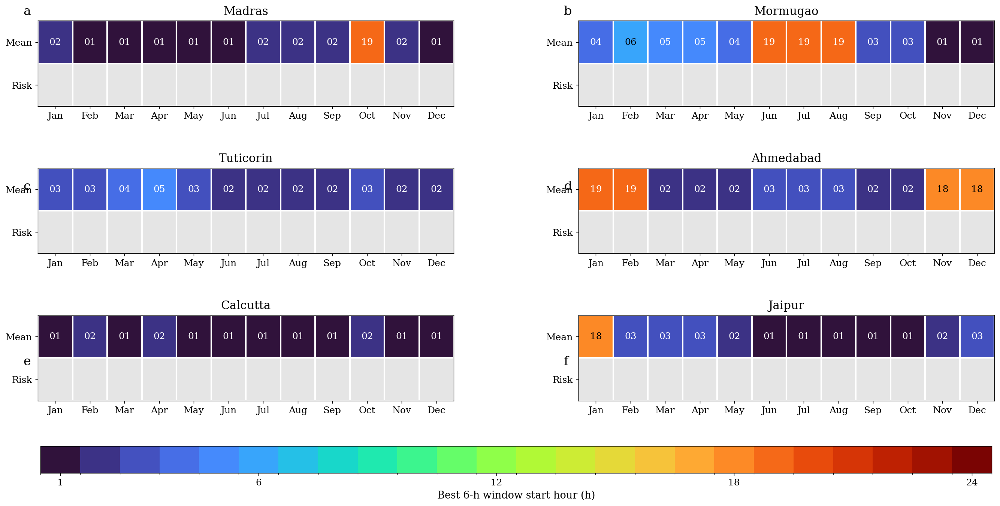

Saved: FigA_MaintenanceStrips_v2.png and FigA_MaintenanceStrips_v2.pdf


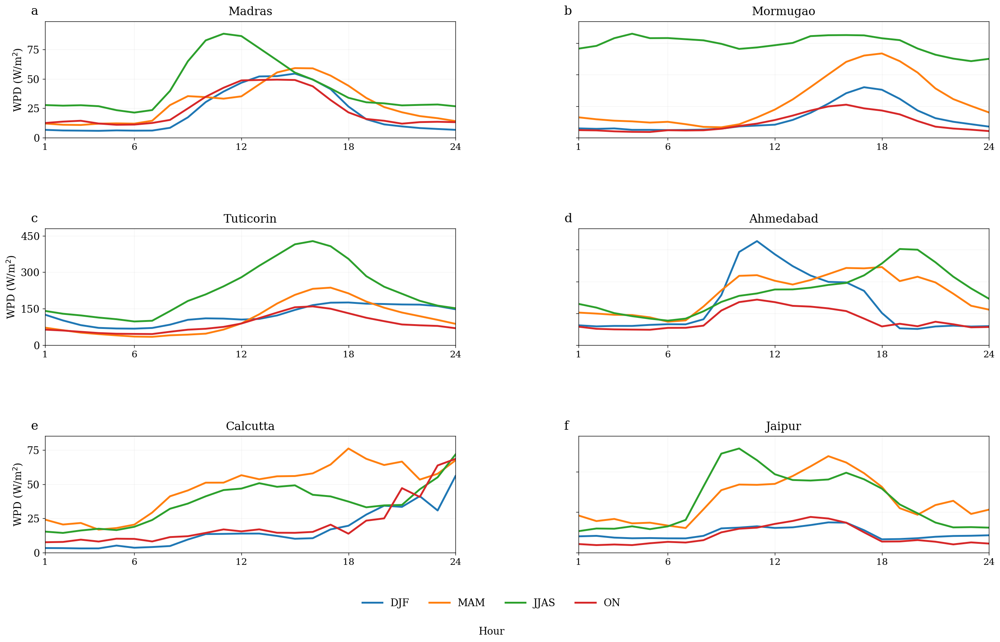

Saved: FigB_SeasonalDiurnal_v2.png and FigB_SeasonalDiurnal_v2.pdf


In [24]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import ticker
import matplotlib.colors as mcolors

# ---------- Style ----------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 13,
    "axes.titleweight": "normal",
    "axes.labelweight": "normal",
    "axes.linewidth": 0.7,
    "xtick.major.width": 0.7,
    "ytick.major.width": 0.7,
    "xtick.major.size": 3.5,
    "ytick.major.size": 3.5,
})

MONTH_LABELS = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
SEASONS = {
    "DJF": [12, 1, 2],
    "MAM": [3, 4, 5],
    "JJAS": [6, 7, 8, 9],
    "ON": [10, 11],
}

WINDOW_H = 6
PROB_TARGET = 0.70

# ---------------- utilities ----------------
def thin_spines(ax):
    for s in ax.spines.values():
        s.set_linewidth(0.7)

def make_grid(nrows=3, ncols=2, fig_w=18.5, row_h=3.9, hspace=0.62, wspace=0.28, top=0.93, bottom=0.12):
    fig_h = row_h * nrows
    fig, axes = plt.subplots(nrows, ncols, figsize=(fig_w, fig_h), constrained_layout=False)
    plt.subplots_adjust(left=0.065, right=0.985, top=top, bottom=bottom, hspace=hspace, wspace=wspace)
    return fig, axes

def add_panel_labels_outside(fig, axes, start='a', fs=16, dx=0.012, dy=0.010):
    """
    Places panel labels OUTSIDE each axes, at figure coords:
    (axes_left - dx, axes_top + dy).
    This avoids legend/title overlap reliably.
    """
    ch = ord(start)
    for ax in axes.flatten():
        bb = ax.get_position()  # figure coords
        fig.text(bb.x0 - dx, bb.y1 + dy, chr(ch), fontsize=fs, ha="left", va="bottom")
        ch += 1

def _cell_text_color(cmap, norm, v):
    """Choose white/black text based on background luminance."""
    rgba = cmap(norm(v))
    r,g,b,_ = rgba
    luminance = 0.2126*r + 0.7152*g + 0.0722*b
    return "black" if luminance > 0.55 else "white"

# ---------------- Maintenance computations ----------------
def window_stats_month(Pm, tau_low, window_h=WINDOW_H):
    rows = []
    for s in range(0, 24-window_h+1):
        win = Pm[:, s:s+window_h]
        daily_mean = np.nanmean(win, axis=1)
        mu = float(np.nanmean(daily_mean))
        p_ok = float(np.mean(daily_mean < tau_low))
        rows.append((s, mu, p_ok))
    return pd.DataFrame(rows, columns=["start0", "meanWPD", "P_ok"])

def best_windows_per_month(P, months, tau_low):
    out = []
    for m in range(1, 13):
        mask = months == m
        if mask.sum() < 20:
            out.append((m, np.nan, np.nan))
            continue
        Pm = P[mask, :]
        dfw = window_stats_month(Pm, tau_low, window_h=WINDOW_H)

        s_mean = int(dfw.loc[dfw["meanWPD"].idxmin(), "start0"])
        feasible = dfw[dfw["P_ok"] >= PROB_TARGET]
        s_risk = np.nan
        if len(feasible) > 0:
            s_risk = int(feasible.loc[feasible["meanWPD"].idxmin(), "start0"])

        out.append((m, s_mean + 1, (s_risk + 1) if np.isfinite(s_risk) else np.nan))  # 1..24
    return pd.DataFrame(out, columns=["Month", "BestStart_Mean", "BestStart_Risk"])

# ============================================================
# FIG A (v2) — Maintenance strips (clear)
# - taller panels
# - thinner separators
# - adaptive text color
# - discrete colorbar (1..24)
# ============================================================
def fig_maintenance_strips_grid_v2(cache, cities, out_png, out_pdf):
    fig, axes = make_grid(row_h=3.4, fig_w=18.5, hspace=0.72, wspace=0.30, top=0.93, bottom=0.14)

    cmap = plt.cm.turbo.copy()
    cmap.set_bad(color="0.90")  # NaNs

    # discrete normalization for 1..24
    bounds = np.arange(0.5, 24.5 + 1, 1.0)
    norm = mcolors.BoundaryNorm(bounds, cmap.N)

    last_im = None
    for i, city in enumerate(cities):
        ax = axes.flatten()[i]
        P = cache[city]["P"]
        months = cache[city]["months"]
        tau = cache[city]["tau"]

        win_df = best_windows_per_month(P, months, tau)

        M = np.full((2, 12), np.nan, dtype=float)
        M[0, :] = win_df["BestStart_Mean"].to_numpy(float)
        M[1, :] = win_df["BestStart_Risk"].to_numpy(float)

        Z = np.ma.masked_invalid(M)
        im = ax.imshow(Z, aspect="auto", cmap=cmap, norm=norm, interpolation="nearest")
        last_im = im

        # slimmer separators
        ax.set_xticks(np.arange(-0.5, 12, 1), minor=True)
        ax.set_yticks(np.arange(-0.5, 2, 1), minor=True)
        ax.grid(which="minor", color="white", linewidth=2.0)
        ax.tick_params(which="minor", bottom=False, left=False)

        # ticks / labels
        ax.set_title(city, fontsize=15, pad=8, fontweight="normal")
        ax.set_yticks([0, 1])
        ax.set_yticklabels(["Mean", "Risk"], fontsize=12)
        ax.set_xticks(np.arange(12))
        ax.set_xticklabels(MONTH_LABELS, fontsize=12)

        # annotate numbers with contrast-aware color
        for r in range(2):
            for c in range(12):
                v = M[r, c]
                if np.isfinite(v):
                    tc = _cell_text_color(cmap, norm, v)
                    ax.text(c, r, f"{int(v):02d}", ha="center", va="center", fontsize=12, color=tc)

        thin_spines(ax)

    add_panel_labels_outside(fig, axes, start="a", fs=16, dx=0.014, dy=0.006)

    # global colorbar
    cbar = fig.colorbar(last_im, ax=axes.ravel().tolist(), orientation="horizontal",
                        fraction=0.06, pad=0.10, aspect=35)
    cbar.set_label("Best 6-h window start hour (h)", fontsize=13)
    cbar.set_ticks([1, 6, 12, 18, 24])
    cbar.ax.tick_params(labelsize=12, width=0.7, length=3.5)

    fig.savefig(out_png, dpi=700, bbox_inches="tight")
    fig.savefig(out_pdf, dpi=700, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png, "and", out_pdf)

# ============================================================
# FIG B (v2) — Seasonal diurnal profiles (clear)
# - legend moved to bottom (no overlap)
# - thicker lines
# - better y tick control
# - subtle grid
# ============================================================
def fig_seasonal_diurnal_grid_v2(cache, cities, out_png, out_pdf):
    fig, axes = make_grid(row_h=4.1, fig_w=18.5, hspace=0.78, wspace=0.30, top=0.92, bottom=0.14)

    h = np.arange(1, 25)
    season_order = ["DJF", "MAM", "JJAS", "ON"]
    season_colors = {"DJF": "#1f77b4", "MAM": "#ff7f0e", "JJAS": "#2ca02c", "ON": "#d62728"}

    handles, labels = [], []

    for i, city in enumerate(cities):
        ax = axes.flatten()[i]
        P = cache[city]["P"]
        months = cache[city]["months"]

        profs = {}
        ymax = 0.0
        for s in season_order:
            sm = SEASONS[s]
            mask = np.isin(months, sm)
            if mask.sum() < 20:
                continue
            prof = np.nanmean(P[mask, :], axis=0)
            profs[s] = prof
            ymax = max(ymax, float(np.nanmax(prof)))

        for s in season_order:
            if s not in profs:
                continue
            ln, = ax.plot(h, profs[s], lw=2.4, color=season_colors[s])
            if i == 0:
                handles.append(ln); labels.append(s)

        ax.set_title(city, fontsize=15, pad=8, fontweight="normal")
        ax.set_xlim(1, 24)
        ax.set_xticks([1, 6, 12, 18, 24])
        ax.set_xticklabels(["1", "6", "12", "18", "24"], fontsize=12)

        # y limits + fewer ticks (clearer)
        ax.set_ylim(0.0, max(1.0, 1.12 * ymax))
        ax.yaxis.set_major_locator(ticker.MaxNLocator(4))

        if (i % 2) == 0:
            ax.set_ylabel("WPD (W/m$^2$)", fontsize=13)
        else:
            ax.set_yticklabels([])

        ax.grid(True, alpha=0.16, linewidth=0.6)
        thin_spines(ax)

    add_panel_labels_outside(fig, axes, start="a", fs=16, dx=0.014, dy=0.006)

    # Legend at bottom center (never collides)
    fig.legend(handles, labels, loc="lower center", ncol=4, frameon=False,
               bbox_to_anchor=(0.5, 0.045), fontsize=13)

    fig.text(0.50, 0.020, "Hour", ha="center", fontsize=13)

    fig.savefig(out_png, dpi=700, bbox_inches="tight")
    fig.savefig(out_pdf, dpi=700, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png, "and", out_pdf)

# ---------- FIX KEYERROR: resolve city names between `cities` and `cache` ----------
import re

def _keynorm(s):
    return re.sub(r"[^a-z0-9]+", "", str(s).strip().lower())

def resolve_city_keys(cache, cities):
    """Returns (cities_resolved, mapping_dict). Raises a clear error if any city can't be matched."""
    cache_keys = list(cache.keys())
    norm_to_key = {}
    for k in cache_keys:
        nk = _keynorm(k)
        # keep first match only (stable)
        if nk not in norm_to_key:
            norm_to_key[nk] = k

    resolved = []
    mapping = {}
    missing = []
    for c in cities:
        nc = _keynorm(c)
        if nc in norm_to_key:
            real = norm_to_key[nc]
            resolved.append(real)
            mapping[c] = real
        else:
            # try "contains" match
            cand = [k for k in cache_keys if nc in _keynorm(k) or _keynorm(k) in nc]
            if len(cand) == 1:
                resolved.append(cand[0])
                mapping[c] = cand[0]
            else:
                missing.append(c)

    if missing:
        raise KeyError(
            "These city names were not found in cache. "
            f"Missing: {missing}\n"
            f"Available cache keys: {cache_keys}\n"
            "Fix by using the exact key names or rebuild cache with standard names."
        )
    return resolved, mapping

# Quick sanity print
print("Cache keys:", list(cache.keys()))
cities_resolved, name_map = resolve_city_keys(cache, cities)
print("Resolved mapping:", name_map)


# ---------------- RUN (use your existing cache and cities) ----------------
# cities = ["Madras","Mormugao","Tuticorin","Ahmedabad","Calcutta","Jaipur"]

fig_maintenance_strips_grid_v2(
    cache, cities,
    out_png="FigA_MaintenanceStrips_v2.png",
    out_pdf="FigA_MaintenanceStrips_v2.pdf"
)

fig_seasonal_diurnal_grid_v2(
    cache, cities,
    out_png="FigB_SeasonalDiurnal_v2.png",
    out_pdf="FigB_SeasonalDiurnal_v2.pdf"
)


Colab detected. Upload your 6 XLSX files now (if not already present).


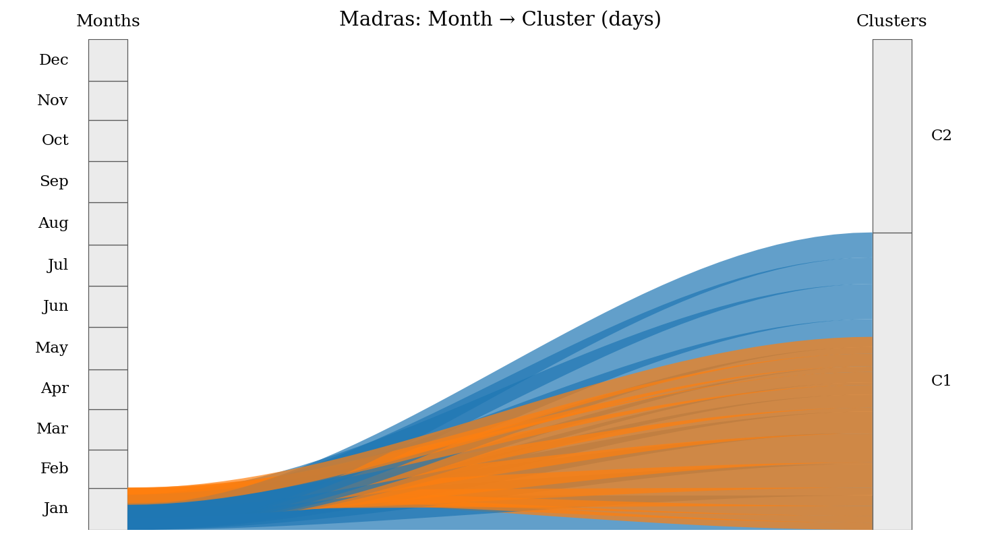

Saved: FigSankey_Madras_MonthToCluster.png FigSankey_Madras_MonthToCluster.pdf


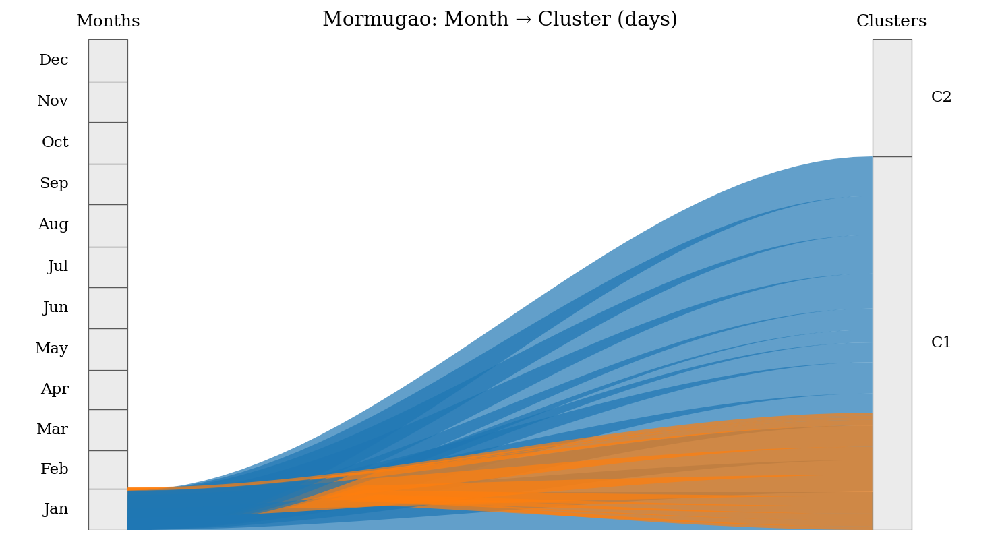

Saved: FigSankey_Mormugao_MonthToCluster.png FigSankey_Mormugao_MonthToCluster.pdf


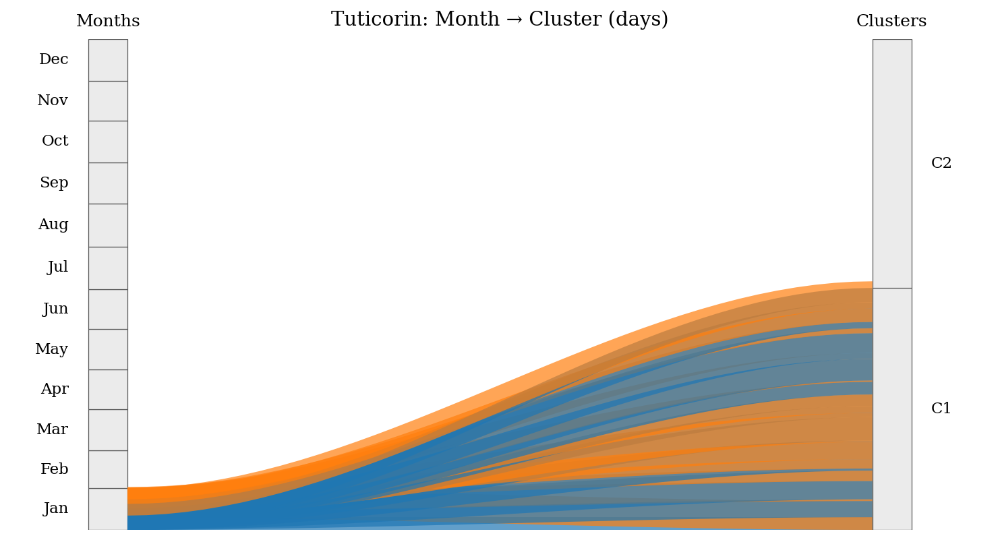

Saved: FigSankey_Tuticorin_MonthToCluster.png FigSankey_Tuticorin_MonthToCluster.pdf


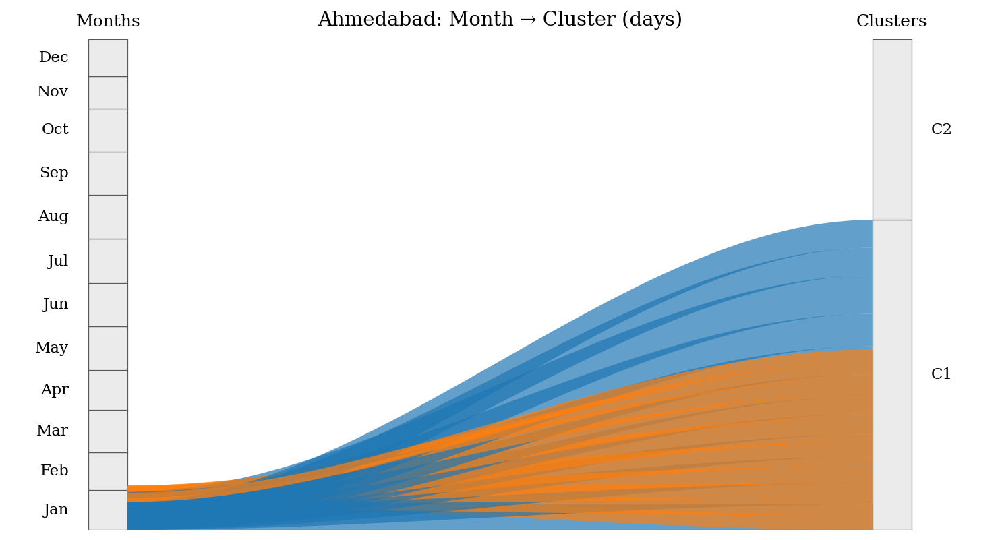

Saved: FigSankey_Ahmedabad_MonthToCluster.png FigSankey_Ahmedabad_MonthToCluster.pdf


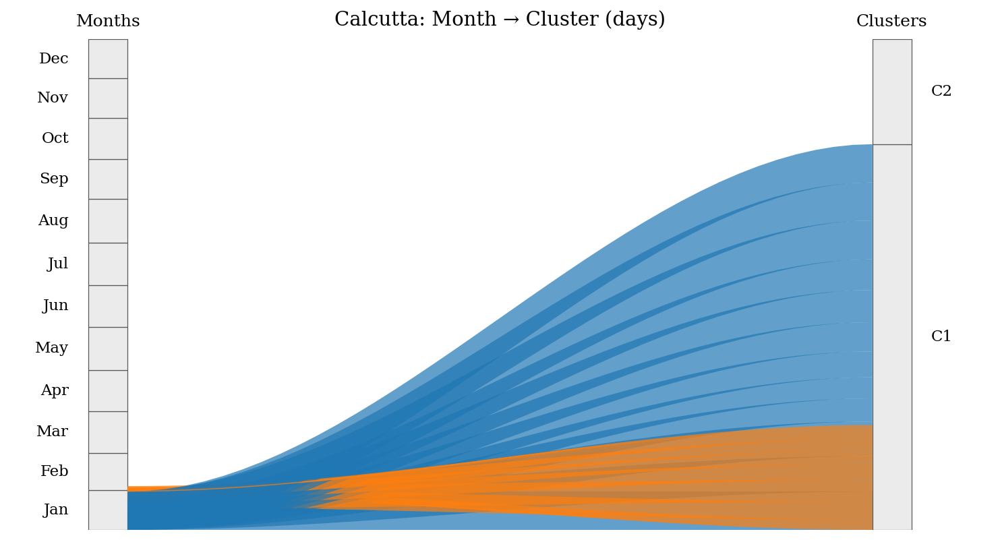

Saved: FigSankey_Calcutta_MonthToCluster.png FigSankey_Calcutta_MonthToCluster.pdf


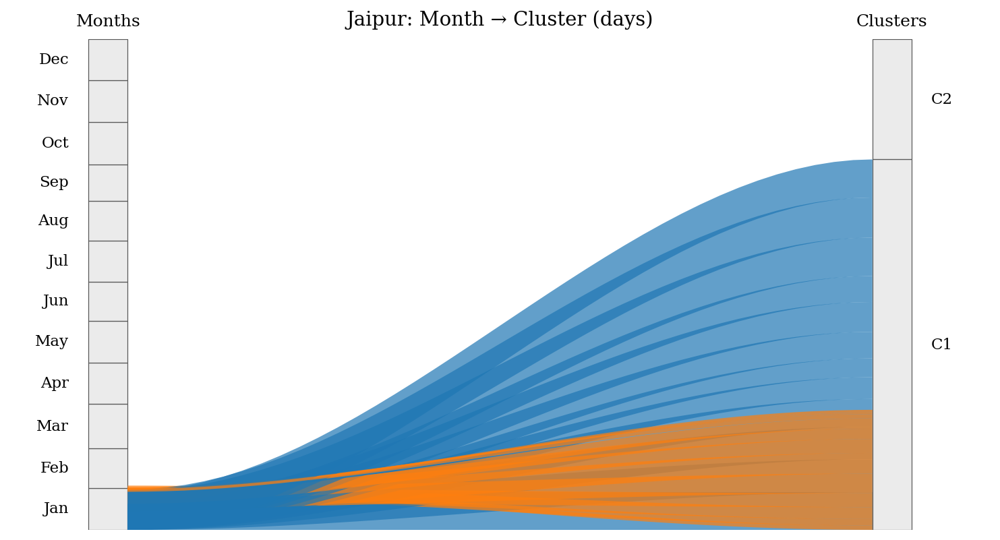

Saved: FigSankey_Jaipur_MonthToCluster.png FigSankey_Jaipur_MonthToCluster.pdf


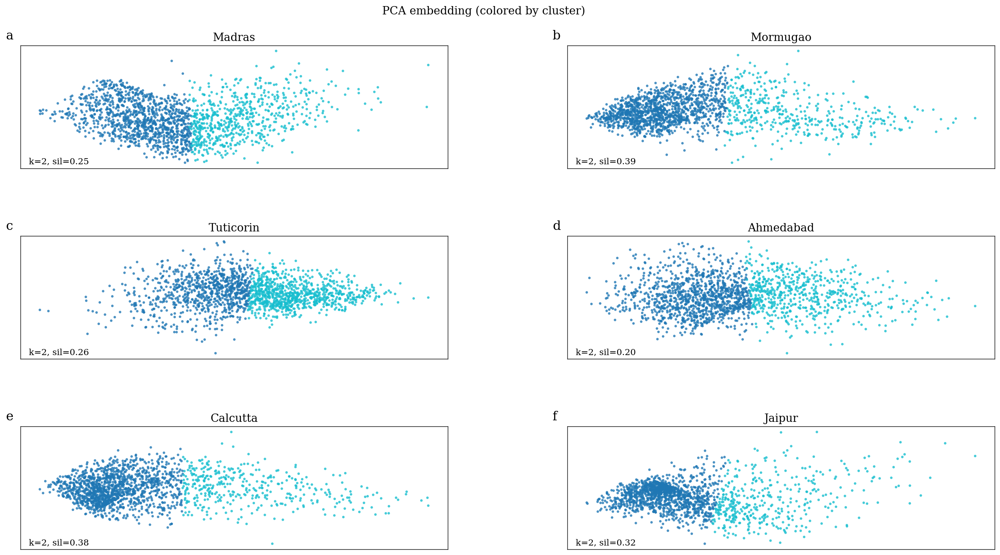

Saved: FigEmbed_PCA_byCluster.png FigEmbed_PCA_byCluster.pdf


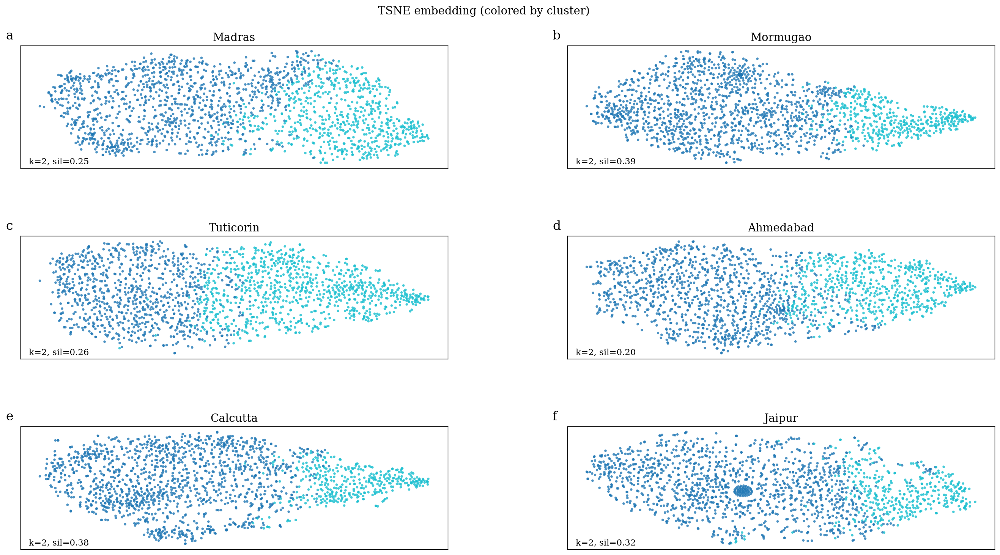

Saved: FigEmbed_tSNE_byCluster.png FigEmbed_tSNE_byCluster.pdf


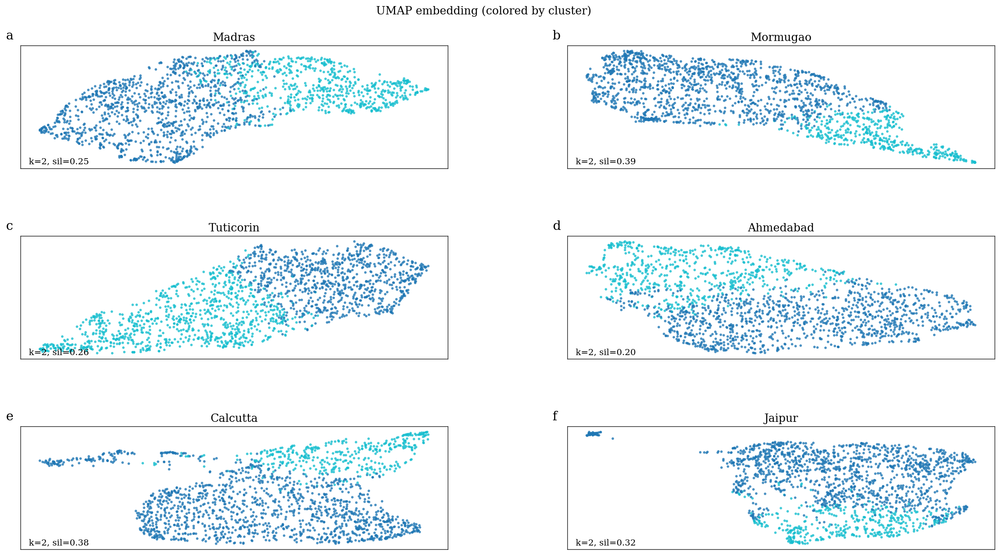

Saved: FigEmbed_UMAP_byCluster.png FigEmbed_UMAP_byCluster.pdf


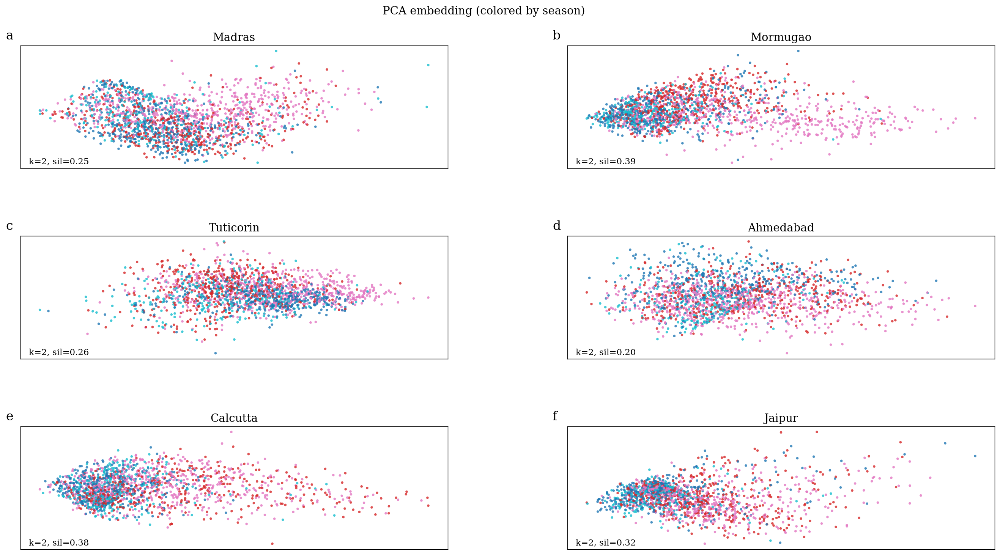

Saved: FigEmbed_PCA_bySeason.png FigEmbed_PCA_bySeason.pdf
Saved figures:
 - FigSankey_<City>_MonthToCluster.(png/pdf)
 - FigEmbed_(PCA/tSNE/UMAP)_byCluster.(png/pdf) + PCA_bySeason

Saved tables:
 - Table1_SiteSummary.(csv/tex)
 - Table2_ClusterStats.(csv/tex)
 - Table3_BestMaintenanceWindows.(csv/tex)
 - TableS1_MonthlyMaintenanceWindows.(csv/tex)

--- Table1 (insertable) ---


,City,Days,Sheet,tau_low(W/m2),AnnualMeanWPD(W/m2),AnnualMedianWPD(W/m2),Ramp_p95(|dWPD|)(W/m2),PeakSeason,K(opt),Silhouette
0,Madras,12891,wind_43279,0.35,33.34,9.57,90.95,JJAS,2,0.25
1,Mormugao,13248,wind_43196,0.11,23.46,2.84,73.73,JJAS,2,0.39
2,Tuticorin,13401,wind_15208,22.69,150.68,76.56,252.27,JJAS,2,0.26
3,Ahmedabad,7452,wind_42647,0.84,30.21,13.13,82.34,JJAS,2,0.20
4,Calcutta,9966,Sheet1,2.70,32.95,2.84,102.19,MAM,2,0.38
5,Jaipur,10577,wind_42348,1.72,16.12,2.84,63.43,JJAS,2,0.32



--- Table3 (insertable) ---


,City,tau_low(W/m2),BestRiskMonth,BestRiskStart(h),BestRisk_mu,BestRisk_CI_lo,BestRisk_CI_hi,BestRisk_P_ok
0,Madras,0.35,NaN,NaN,NaN,NaN,NaN,NaN
1,Mormugao,0.11,NaN,NaN,NaN,NaN,NaN,NaN
2,Tuticorin,22.69,NaN,NaN,NaN,NaN,NaN,NaN
3,Ahmedabad,0.84,NaN,NaN,NaN,NaN,NaN,NaN
4,Calcutta,2.70,NaN,NaN,NaN,NaN,NaN,NaN
5,Jaipur,1.72,NaN,NaN,NaN,NaN,NaN,NaN



--- Table2 (first 12 rows) ---


,City,Cluster,FracDays,CentroidMeanWPD(W/m2),CentroidPeakHour,DominantSeason
0,Madras,C1,0.606,10.641,15,DJF
1,Madras,C2,0.394,60.317,12,JJAS
2,Mormugao,C1,0.761,6.836,17,DJF
3,Mormugao,C2,0.239,66.885,17,JJAS
4,Tuticorin,C1,0.493,59.596,16,MAM
5,Tuticorin,C2,0.507,230.487,16,JJAS
6,Ahmedabad,C1,0.632,12.578,11,JJAS
7,Ahmedabad,C2,0.368,53.965,11,JJAS
8,Calcutta,C1,0.786,16.135,24,JJAS
9,Calcutta,C2,0.214,81.759,12,JJAS


In [23]:
# ============================================================
# ONE-PIECE COLAB PIPELINE
# Sankey(Alluvial) + Clustering (PCA/TSNE/UMAP) + Paper Tables
# - IMD Excel: YEAR, MN, DT, S01..S24 (wind in km/h)
# - Hub height: 10 m (no extrapolation)
# - WPD: instantaneous: 0.5*rho*v^3 (W/m^2), v in m/s
# - Clustering: KMeans on daily 24D log1p(WPD) profiles
# - Sankey: Month -> Cluster flows (#days), static (Matplotlib) PNG/PDF
# - Tables: summary, cluster stats, best windows (paper), monthly windows (supp)
# ============================================================

!pip -q install openpyxl scipy scikit-learn umap-learn

import os, re, math, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import patches
from matplotlib import ticker
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

warnings.filterwarnings("ignore")

# -------------------------
# Style (Elsevier-clean)
# -------------------------
plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 12,
    "axes.titleweight": "normal",
    "axes.labelweight": "normal",
    "axes.linewidth": 0.7,
    "xtick.major.width": 0.7,
    "ytick.major.width": 0.7,
    "xtick.major.size": 3.5,
    "ytick.major.size": 3.5,
})

MONTH_LABELS = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]
SEASONS = {"DJF":[12,1,2], "MAM":[3,4,5], "JJAS":[6,7,8,9], "ON":[10,11]}

def season_from_month(m):
    if m in [12,1,2]: return "DJF"
    if m in [3,4,5]: return "MAM"
    if m in [6,7,8,9]: return "JJAS"
    return "ON"

def thin_spines(ax):
    for s in ax.spines.values():
        s.set_linewidth(0.7)

def make_grid(nrows=3, ncols=2, fig_w=18.5, row_h=3.7, hspace=0.60, wspace=0.28, top=0.93, bottom=0.10):
    fig_h = row_h * nrows
    fig, axes = plt.subplots(nrows, ncols, figsize=(fig_w, fig_h), constrained_layout=False)
    plt.subplots_adjust(left=0.06, right=0.985, top=top, bottom=bottom, hspace=hspace, wspace=wspace)
    return fig, axes

def add_panel_labels_outside(fig, axes, start='a', fs=16, dx=0.014, dy=0.006):
    ch = ord(start)
    for ax in axes.flatten():
        bb = ax.get_position()
        fig.text(bb.x0 - dx, bb.y1 + dy, chr(ch), fontsize=fs, ha="left", va="bottom")
        ch += 1

# -------------------------
# Config
# -------------------------
RHO = 1.225
CLIP_HI_Q = 0.999

MAX_DAYS_PER_SITE = 1800       # for TSNE/UMAP speed
K_RANGE = range(2, 7)          # k=2..6
RNG = 42

# Maintenance window config (tables)
WINDOW_H = 6
PROB_TARGET = 0.70
BOOT_B = 600                   # bootstrap reps
BOOT_SEED = 123

# If you want to enforce your tau_low values, set here (else auto from data p25 daily mean)
TAU_OVERRIDE = {
    "Madras": 0.35,
    "Mormugao": 0.11,
    "Tuticorin": 22.69,
    "Ahmedabad": 0.84,
    # "Calcutta": ...,
    # "Jaipur": ...,
}

# -------------------------
# Colab upload (optional)
# -------------------------
try:
    import google.colab
    from google.colab import files
    print("Colab detected. Upload your 6 XLSX files now (if not already present).")
    uploaded = files.upload()
except Exception:
    print("Not running in Colab upload context. Assuming files already exist in the working directory.")

# -------------------------
# SITES (edit if needed)
# -------------------------
SITES = {
    "Madras":    "MADRAS-2-43279 (1) (1).xlsx",
    "Mormugao":  "MORMUGAO-43196 (2) (1).xlsx",
    "Tuticorin": "TUTICORIN H.P.-15208 (5).xlsx",
    "Ahmedabad": "ahamdabad new wind_42647 (1).xlsx",
    "Calcutta":  "Calcutta new-42809 (1).xlsx",
    "Jaipur":    "JAIPUR-42348.xlsx",
}
cities = list(SITES.keys())

# -------------------------
# File helpers
# -------------------------
def _norm(s: str) -> str:
    return re.sub(r"[^a-z0-9]+", "", s.lower())

def resolve_file(preferred_name: str):
    if os.path.exists(preferred_name):
        return preferred_name
    target = _norm(preferred_name)
    candidates = [f for f in os.listdir(".") if f.lower().endswith(".xlsx")]
    for f in candidates:
        if _norm(f) == target:
            return f
    for f in candidates:
        if target in _norm(f) or _norm(f) in target:
            return f
    raise FileNotFoundError(f"Could not match: {preferred_name}\nAvailable: {candidates}")

def detect_sheet_and_header(path: str):
    xl = pd.ExcelFile(path)
    for s in xl.sheet_names:
        for hdr in [1, 0]:
            try:
                df = pd.read_excel(path, sheet_name=s, header=hdr, nrows=5)
                cols = set(map(str, df.columns))
                has_core = {"YEAR","MN","DT"}.issubset(cols)
                has_hour = any(re.fullmatch(r"S\d{2}", str(c)) for c in df.columns)
                if has_core and has_hour:
                    return s, hdr
            except Exception:
                pass
    return xl.sheet_names[0], 1

def load_imd_excel(path: str):
    sheet, hdr = detect_sheet_and_header(path)
    df = pd.read_excel(path, sheet_name=sheet, header=hdr)

    hour_cols = [c for c in df.columns if re.fullmatch(r"S\d{2}", str(c))]
    hour_cols = sorted(hour_cols, key=lambda s: int(str(s)[1:]))

    df = df[["YEAR","MN","DT"] + hour_cols].copy()
    for c in hour_cols:
        df[c] = pd.to_numeric(df[c], errors="coerce")

    df["YEAR"] = pd.to_numeric(df["YEAR"], errors="coerce")
    df["MN"]   = pd.to_numeric(df["MN"], errors="coerce")
    df["DT"]   = pd.to_numeric(df["DT"], errors="coerce")

    df = df.dropna(subset=["YEAR","MN"])
    df = df[(df["MN"] >= 1) & (df["MN"] <= 12)]
    df["YEAR"] = df["YEAR"].astype(int)
    df["MN"]   = df["MN"].astype(int)
    df["DT"]   = df["DT"].fillna(1).astype(int)

    return df, hour_cols, sheet

# -------------------------
# Physics: WPD
# -------------------------
def kmh_to_ms(x): return x / 3.6
def instantaneous_wpd_from_v(v_ms, rho=RHO): return 0.5 * rho * (v_ms**3)

def clean_wind_matrix(V_ms, clip_hi_q=CLIP_HI_Q):
    V = V_ms.copy()
    V[V <= 0] = np.nan
    hi = np.nanquantile(V, clip_hi_q)
    V[V > hi] = hi
    return V

def make_day_hour_wpd(df, hour_cols):
    V = kmh_to_ms(df[hour_cols].to_numpy(dtype=float))
    V = clean_wind_matrix(V)
    P = instantaneous_wpd_from_v(V, rho=RHO)              # (days, 24)
    months = df["MN"].to_numpy(dtype=int)
    years  = df["YEAR"].to_numpy(dtype=int)
    return P, months, years

# -------------------------
# Maintenance windows (tables)
# -------------------------
def window_stats_month(Pm, tau_low, window_h=WINDOW_H):
    rows = []
    for s in range(0, 24-window_h+1):
        win = Pm[:, s:s+window_h]
        daily_mean = np.nanmean(win, axis=1)
        mu = float(np.nanmean(daily_mean))
        p_ok = float(np.mean(daily_mean < tau_low))
        rows.append((s, mu, p_ok, daily_mean))
    return rows

def bootstrap_ci_mean(x, B=BOOT_B, seed=BOOT_SEED):
    x = np.asarray(x)
    x = x[np.isfinite(x)]
    if x.size < 10:
        return (np.nan, np.nan)
    rng = np.random.default_rng(seed)
    idx = rng.integers(0, x.size, size=(B, x.size))
    bs = np.mean(x[idx], axis=1)
    return (float(np.quantile(bs, 0.025)), float(np.quantile(bs, 0.975)))

def monthly_windows_table(P, months, tau_low):
    rows_out = []
    for m in range(1,13):
        mask = months == m
        if mask.sum() < 20:
            rows_out.append([m, np.nan,np.nan,np.nan,np.nan, np.nan,np.nan,np.nan,np.nan,np.nan])
            continue
        Pm = P[mask,:]
        stats = window_stats_month(Pm, tau_low)
        dfw = pd.DataFrame([(s,mu,pok) for (s,mu,pok,dm) in stats], columns=["start0","mu","pok"])

        # mean-based
        i_mean = int(dfw["mu"].idxmin())
        s_mean = int(dfw.loc[i_mean,"start0"])
        dm_mean = stats[i_mean][3]
        lo, hi = bootstrap_ci_mean(dm_mean, seed=BOOT_SEED + m)
        mu_mean = float(np.nanmean(dm_mean))

        # risk-based
        feasible_idx = [i for i,(s,mu,pok,dm) in enumerate(stats) if (pok >= PROB_TARGET)]
        if len(feasible_idx) > 0:
            i_best = feasible_idx[int(np.argmin([stats[i][1] for i in feasible_idx]))]
            s_r = int(stats[i_best][0])
            dm_r = stats[i_best][3]
            lo2, hi2 = bootstrap_ci_mean(dm_r, seed=BOOT_SEED + 100 + m)
            mu_r = float(np.nanmean(dm_r))
            pok_r = float(np.mean(dm_r < tau_low))
        else:
            s_r = np.nan; mu_r=np.nan; lo2=np.nan; hi2=np.nan; pok_r=np.nan

        rows_out.append([
            m,
            s_mean+1, mu_mean, lo, hi,
            (s_r+1) if np.isfinite(s_r) else np.nan,
            mu_r, lo2, hi2, pok_r
        ])

    out = pd.DataFrame(rows_out, columns=[
        "Month",
        "MeanStart(h)","Mean_mu","Mean_CI_lo","Mean_CI_hi",
        "RiskStart(h)","Risk_mu","Risk_CI_lo","Risk_CI_hi","Risk_P_ok"
    ])
    out["MonthName"] = out["Month"].apply(lambda x: MONTH_LABELS[int(x)-1])
    return out

def best_risk_window_overall(month_tbl):
    # choose across months among risk-feasible entries: minimal Risk_mu
    d = month_tbl.copy()
    d = d[np.isfinite(d["Risk_mu"].to_numpy(float))]
    if len(d)==0:
        return None
    j = int(d["Risk_mu"].astype(float).idxmin())
    return month_tbl.loc[j]

# -------------------------
# Clustering + embeddings
# -------------------------
def choose_k_kmeans(Xz, k_range=K_RANGE, seed=RNG):
    best = None
    for k in k_range:
        if Xz.shape[0] <= k:
            continue
        km = KMeans(n_clusters=k, n_init=25, random_state=seed)
        lab = km.fit_predict(Xz)
        sil = silhouette_score(Xz, lab)
        if (best is None) or (sil > best["sil"]):
            best = {"k": k, "sil": float(sil), "labels": lab, "model": km}
    if best is None:
        # fallback
        k = 2 if Xz.shape[0] >= 2 else 1
        km = KMeans(n_clusters=k, n_init=10, random_state=seed).fit(Xz)
        lab = km.labels_
        best = {"k": k, "sil": np.nan, "labels": lab, "model": km}
    return best

def reorder_labels_by_centroid_mean(P_sub, labels, k):
    # cluster ordering: low -> high mean WPD (more interpretable across plots)
    means = []
    for c in range(k):
        mask = labels == c
        means.append(np.nanmean(P_sub[mask,:]) if mask.sum()>0 else np.inf)
    order = np.argsort(means)
    mapping = {int(old): int(new) for new, old in enumerate(order)}
    new_labels = np.array([mapping[int(x)] for x in labels], dtype=int)
    return new_labels, order

def compute_embeddings(Xz, seed=RNG):
    p2 = PCA(n_components=2, random_state=seed).fit_transform(Xz)
    n = Xz.shape[0]
    perpl = int(np.clip(n/10, 10, 35))
    ts2 = TSNE(n_components=2, perplexity=perpl, init="pca",
               learning_rate="auto", random_state=seed).fit_transform(Xz)
    um2 = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.10,
                    random_state=seed).fit_transform(Xz)
    return p2, ts2, um2

# -------------------------
# Static Sankey (Alluvial) Month -> Cluster
# -------------------------
def alluvial_month_to_cluster(counts, left_labels, right_labels, title, out_png, out_pdf):
    """
    counts: (L,R) integer matrix
    left_labels: len L
    right_labels: len R
    """
    counts = np.asarray(counts, dtype=float)
    L, R = counts.shape
    total = counts.sum()
    if total <= 0:
        print("No flows for", title)
        return

    # Normalize heights
    left_h = counts.sum(axis=1) / total
    right_h = counts.sum(axis=0) / total

    # Stacked segments (y0,y1) per node and per link
    left_seg  = np.zeros((L, R, 2), float)
    right_seg = np.zeros((L, R, 2), float)

    # left stacking by right index order
    for i in range(L):
        y = 0.0
        for j in range(R):
            h = counts[i,j]/total
            left_seg[i,j] = [y, y+h]
            y += h

    # right stacking by left index order
    for j in range(R):
        y = 0.0
        for i in range(L):
            h = counts[i,j]/total
            right_seg[i,j] = [y, y+h]
            y += h

    # Figure
    fig = plt.figure(figsize=(12.5, 6.3))
    ax = plt.gca()
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis("off")
    ax.set_title(title, fontsize=14, fontweight="normal", pad=10)

    xL0, xL1 = 0.08, 0.12
    xR0, xR1 = 0.88, 0.92
    x0, x1 = xL1, xR0

    cmap = plt.cm.tab10
    colors = [cmap(i % 10) for i in range(R)]

    # Node bars
    y = 0.0
    for i in range(L):
        h = left_h[i]
        ax.add_patch(patches.Rectangle((xL0, y), xL1-xL0, h, facecolor="0.92", edgecolor="0.35", linewidth=0.6))
        ax.text(xL0-0.02, y+h/2, left_labels[i], ha="right", va="center", fontsize=11)
        y += h

    y = 0.0
    for j in range(R):
        h = right_h[j]
        ax.add_patch(patches.Rectangle((xR0, y), xR1-xR0, h, facecolor="0.92", edgecolor="0.35", linewidth=0.6))
        ax.text(xR1+0.02, y+h/2, right_labels[j], ha="left", va="center", fontsize=11)
        y += h

    # Flows (smoothstep interpolation)
    n = 40
    t = np.linspace(0, 1, n)
    ease = 3*t**2 - 2*t**3
    xs = x0 + (x1-x0)*t

    for i in range(L):
        for j in range(R):
            if counts[i,j] <= 0:
                continue
            ly0, ly1 = left_seg[i,j]
            ry0, ry1 = right_seg[i,j]
            y_top = (1-ease)*ly1 + ease*ry1
            y_bot = (1-ease)*ly0 + ease*ry0

            poly_x = np.concatenate([xs, xs[::-1]])
            poly_y = np.concatenate([y_top, y_bot[::-1]])
            ax.fill(poly_x, poly_y, color=colors[j], alpha=0.70, linewidth=0.0)

    # small labels
    ax.text((xL0+xL1)/2, 1.02, "Months", ha="center", va="bottom", fontsize=12)
    ax.text((xR0+xR1)/2, 1.02, "Clusters", ha="center", va="bottom", fontsize=12)

    fig.savefig(out_png, dpi=700, bbox_inches="tight")
    fig.savefig(out_pdf, dpi=700, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png, out_pdf)

# -------------------------
# Embedding grids (site-wise)
# -------------------------
def plot_embedding_grid(emb_by_city, method, color_by="cluster", out_png="emb.png", out_pdf="emb.pdf"):
    fig, axes = make_grid(row_h=3.6, fig_w=18.5, hspace=0.55, wspace=0.28, top=0.92, bottom=0.10)

    for i, city in enumerate(cities):
        ax = axes.flatten()[i]
        E = emb_by_city[city][method]
        meta = emb_by_city[city]["meta"]
        k = meta["k"]

        if color_by == "season":
            order = ["DJF","MAM","JJAS","ON"]
            smap = {s:i for i,s in enumerate(order)}
            c = np.array([smap[s] for s in meta["season"]], dtype=int)
            sc = ax.scatter(E[:,0], E[:,1], c=c, s=10, alpha=0.80, linewidths=0.0, cmap="tab10")
        else:
            c = meta["cluster"]
            sc = ax.scatter(E[:,0], E[:,1], c=c, s=10, alpha=0.80, linewidths=0.0, cmap="tab10")

        ax.set_title(city, fontsize=14, fontweight="normal", pad=6)
        ax.set_xticks([]); ax.set_yticks([])
        thin_spines(ax)

        sil = meta["sil"]
        txt = f"k={k}"
        if np.isfinite(sil):
            txt += f", sil={sil:.2f}"
        ax.text(0.02, 0.02, txt, transform=ax.transAxes, fontsize=11, ha="left", va="bottom")

    add_panel_labels_outside(fig, axes, start="a", fs=16)

    fig.suptitle(f"{method.upper()} embedding (colored by {color_by})", y=0.985, fontsize=14, fontweight="normal")
    fig.savefig(out_png, dpi=700, bbox_inches="tight")
    fig.savefig(out_pdf, dpi=700, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png, out_pdf)

# ============================================================
# RUN EVERYTHING
# ============================================================
from IPython.display import display

rng = np.random.default_rng(RNG)

cache = {}
emb_by_city = {}

summary_rows = []
cluster_rows = []
bestwin_rows = []
supp_monthly_rows = []

for city in cities:
    path = resolve_file(SITES[city])
    df, hour_cols, sheet = load_imd_excel(path)

    P, months, years = make_day_hour_wpd(df, hour_cols)
    n_days = P.shape[0]

    # tau_low
    if city in TAU_OVERRIDE:
        tau_low = float(TAU_OVERRIDE[city])
    else:
        daily_mean = np.nanmean(P, axis=1)
        tau_low = float(np.quantile(daily_mean[np.isfinite(daily_mean)], 0.25))

    # Cache for tables
    cache[city] = {"P": P, "months": months, "years": years, "tau": tau_low}

    # Subsample for embeddings
    idx = np.arange(n_days)
    if n_days > MAX_DAYS_PER_SITE:
        idx = rng.choice(idx, size=MAX_DAYS_PER_SITE, replace=False)

    P_sub = P[idx,:]
    m_sub = months[idx]
    season_sub = np.array([season_from_month(int(m)) for m in m_sub])

    # Features: log1p(WPD) improves clustering stability
    X = np.log1p(P_sub.copy())
    # Impute missing
    med = np.nanmedian(X)
    X = np.nan_to_num(X, nan=med, posinf=med, neginf=med)

    Xz = StandardScaler().fit_transform(X)

    best = choose_k_kmeans(Xz, seed=RNG)
    k = int(best["k"])
    sil = float(best["sil"]) if np.isfinite(best["sil"]) else np.nan
    labels = best["labels"]

    # reorder clusters by centroid mean WPD (low->high)
    labels, order = reorder_labels_by_centroid_mean(P_sub, labels, k)

    # Embeddings
    p2, ts2, um2 = compute_embeddings(Xz, seed=RNG)

    emb_by_city[city] = {
        "pca": p2, "tsne": ts2, "umap": um2,
        "meta": {"cluster": labels, "season": season_sub, "k": k, "sil": sil}
    }

    # ---------- Sankey counts using full data ----------
    # Fit clustering on full data in same feature space for consistent month counts
    Xfull = np.log1p(P.copy())
    medf = np.nanmedian(Xfull)
    Xfull = np.nan_to_num(Xfull, nan=medf, posinf=medf, neginf=medf)
    Xfullz = StandardScaler().fit_transform(Xfull)

    km_full = KMeans(n_clusters=k, n_init=25, random_state=RNG).fit(Xfullz)
    full_labels = km_full.labels_

    # reorder full labels in same low->high order using full centroids
    full_labels, _ = reorder_labels_by_centroid_mean(P, full_labels, k)

    counts = np.zeros((12, k), dtype=int)
    for mi in range(12):
        m = mi+1
        mask = months == m
        if mask.sum()==0:
            continue
        for c in range(k):
            counts[mi, c] = int(np.sum(full_labels[mask]==c))

    alluvial_month_to_cluster(
        counts=counts,
        left_labels=MONTH_LABELS,
        right_labels=[f"C{j+1}" for j in range(k)],
        title=f"{city}: Month → Cluster (days)",
        out_png=f"FigSankey_{city}_MonthToCluster.png",
        out_pdf=f"FigSankey_{city}_MonthToCluster.pdf"
    )

    # ---------- Tables ----------
    # summary metrics
    annual_mean = float(np.nanmean(P))
    annual_median = float(np.nanmedian(P))
    ramp = np.abs(P[:,1:] - P[:,:-1])
    ramp_p95 = float(np.nanquantile(ramp, 0.95))

    # peak season by mean WPD
    season_means = {}
    for sname, smonths in SEASONS.items():
        mask = np.isin(months, smonths)
        season_means[sname] = float(np.nanmean(P[mask,:])) if mask.sum()>0 else np.nan
    peak_season = max(season_means, key=lambda x: season_means[x] if np.isfinite(season_means[x]) else -np.inf)

    # monthly windows + best overall risk window
    mtable = monthly_windows_table(P, months, tau_low)
    mtable["City"] = city
    supp_monthly_rows.append(mtable)

    bestrisk = best_risk_window_overall(mtable)

    if bestrisk is not None:
        bestwin_rows.append({
            "City": city,
            "tau_low(W/m2)": tau_low,
            "BestRiskMonth": bestrisk["MonthName"],
            "BestRiskStart(h)": float(bestrisk["RiskStart(h)"]),
            "BestRisk_mu": float(bestrisk["Risk_mu"]),
            "BestRisk_CI_lo": float(bestrisk["Risk_CI_lo"]),
            "BestRisk_CI_hi": float(bestrisk["Risk_CI_hi"]),
            "BestRisk_P_ok": float(bestrisk["Risk_P_ok"]),
        })
    else:
        bestwin_rows.append({
            "City": city,
            "tau_low(W/m2)": tau_low,
            "BestRiskMonth": np.nan,
            "BestRiskStart(h)": np.nan,
            "BestRisk_mu": np.nan,
            "BestRisk_CI_lo": np.nan,
            "BestRisk_CI_hi": np.nan,
            "BestRisk_P_ok": np.nan,
        })

    summary_rows.append({
        "City": city,
        "Days": int(n_days),
        "Sheet": sheet,
        "tau_low(W/m2)": tau_low,
        "AnnualMeanWPD(W/m2)": annual_mean,
        "AnnualMedianWPD(W/m2)": annual_median,
        "Ramp_p95(|dWPD|)(W/m2)": ramp_p95,
        "PeakSeason": peak_season,
        "K(opt)": k,
        "Silhouette": sil
    })

    # cluster stats (on full labels)
    for c in range(k):
        maskc = full_labels == c
        frac = float(np.mean(maskc))
        if maskc.sum()>0:
            centroid = np.nanmean(P[maskc,:], axis=0)
            peak_hour = int(np.nanargmax(centroid) + 1)
            cent_mean = float(np.nanmean(centroid))
            # dominant season
            m_c = months[maskc]
            seas = [season_from_month(int(mm)) for mm in m_c]
            dom_season = pd.Series(seas).value_counts().idxmax()
        else:
            peak_hour = np.nan; cent_mean = np.nan; dom_season = np.nan

        cluster_rows.append({
            "City": city,
            "Cluster": f"C{c+1}",
            "FracDays": frac,
            "CentroidMeanWPD(W/m2)": cent_mean,
            "CentroidPeakHour": peak_hour,
            "DominantSeason": dom_season
        })

# ============================================================
# Embedding figures (3×2 grids)
# ============================================================
plot_embedding_grid(emb_by_city, "pca",  color_by="cluster", out_png="FigEmbed_PCA_byCluster.png",  out_pdf="FigEmbed_PCA_byCluster.pdf")
plot_embedding_grid(emb_by_city, "tsne", color_by="cluster", out_png="FigEmbed_tSNE_byCluster.png", out_pdf="FigEmbed_tSNE_byCluster.pdf")
plot_embedding_grid(emb_by_city, "umap", color_by="cluster", out_png="FigEmbed_UMAP_byCluster.png", out_pdf="FigEmbed_UMAP_byCluster.pdf")

# Optional: color by season (very interpretable)
plot_embedding_grid(emb_by_city, "pca",  color_by="season", out_png="FigEmbed_PCA_bySeason.png",   out_pdf="FigEmbed_PCA_bySeason.pdf")

# ============================================================
# Paper-ready tables (CSV + LaTeX)
# ============================================================
summary_df = pd.DataFrame(summary_rows).copy()
cluster_df = pd.DataFrame(cluster_rows).copy()
bestwin_df = pd.DataFrame(bestwin_rows).copy()
supp_monthly_df = pd.concat(supp_monthly_rows, ignore_index=True)

# rounding for paper
def _round_cols(df, cols, nd=2):
    for c in cols:
        df[c] = pd.to_numeric(df[c], errors="coerce").round(nd)
    return df

summary_df = _round_cols(summary_df, ["tau_low(W/m2)","AnnualMeanWPD(W/m2)","AnnualMedianWPD(W/m2)","Ramp_p95(|dWPD|)(W/m2)","Silhouette"], 2)
cluster_df = _round_cols(cluster_df, ["FracDays","CentroidMeanWPD(W/m2)"], 3)
bestwin_df = _round_cols(bestwin_df, ["tau_low(W/m2)","BestRiskStart(h)","BestRisk_mu","BestRisk_CI_lo","BestRisk_CI_hi","BestRisk_P_ok"], 2)
supp_monthly_df = _round_cols(supp_monthly_df, ["Mean_mu","Mean_CI_lo","Mean_CI_hi","Risk_mu","Risk_CI_lo","Risk_CI_hi","Risk_P_ok"], 2)

# Save tables
summary_df.to_csv("Table1_SiteSummary.csv", index=False)
cluster_df.to_csv("Table2_ClusterStats.csv", index=False)
bestwin_df.to_csv("Table3_BestMaintenanceWindows.csv", index=False)
supp_monthly_df.to_csv("TableS1_MonthlyMaintenanceWindows.csv", index=False)

with open("Table1_SiteSummary.tex","w") as f: f.write(summary_df.to_latex(index=False, escape=False))
with open("Table2_ClusterStats.tex","w") as f: f.write(cluster_df.to_latex(index=False, escape=False))
with open("Table3_BestMaintenanceWindows.tex","w") as f: f.write(bestwin_df.to_latex(index=False, escape=False))
with open("TableS1_MonthlyMaintenanceWindows.tex","w") as f: f.write(supp_monthly_df.to_latex(index=False, escape=False))

print("Saved figures:")
print(" - FigSankey_<City>_MonthToCluster.(png/pdf)")
print(" - FigEmbed_(PCA/tSNE/UMAP)_byCluster.(png/pdf) + PCA_bySeason")
print("\nSaved tables:")
print(" - Table1_SiteSummary.(csv/tex)")
print(" - Table2_ClusterStats.(csv/tex)")
print(" - Table3_BestMaintenanceWindows.(csv/tex)")
print(" - TableS1_MonthlyMaintenanceWindows.(csv/tex)")

print("\n--- Table1 (insertable) ---")
display(summary_df)

print("\n--- Table3 (insertable) ---")
display(bestwin_df)

print("\n--- Table2 (first 12 rows) ---")
display(cluster_df.head(12))


In [25]:
import numpy as np
import pandas as pd

WINDOW_H = 6
PROB_TARGET = 0.70
BOOT_B = 800
BOOT_SEED = 123

def window_stats_month(Pm, tau_low, window_h=WINDOW_H):
    rows = []
    for s in range(0, 24-window_h+1):
        win = Pm[:, s:s+window_h]
        daily_mean = np.nanmean(win, axis=1)
        mu = float(np.nanmean(daily_mean))
        p_ok = float(np.mean(daily_mean < tau_low))
        rows.append((s, mu, p_ok))
    return pd.DataFrame(rows, columns=["start0", "meanWPD", "P_ok"])

def bootstrap_ci(x, B=BOOT_B, seed=BOOT_SEED):
    x = np.asarray(x)
    x = x[np.isfinite(x)]
    if x.size < 30:
        return (np.nan, np.nan)
    rng = np.random.default_rng(seed)
    idx = rng.integers(0, x.size, size=(B, x.size))
    bs = np.mean(x[idx], axis=1)
    return (float(np.quantile(bs, 0.025)), float(np.quantile(bs, 0.975)))

def derive_tau_from_window_means(P, months, q=0.20, window_h=WINDOW_H):
    """Recommended τ: percentile of ALL window-mean WPD values (site-specific)."""
    vals = []
    for m in range(1, 13):
        mask = months == m
        if mask.sum() < 20:
            continue
        Pm = P[mask, :]
        for s in range(0, 24-window_h+1):
            daily_mean = np.nanmean(Pm[:, s:s+window_h], axis=1)
            vals.append(daily_mean)
    if len(vals) == 0:
        return np.nan
    vals = np.concatenate(vals)
    vals = vals[np.isfinite(vals)]
    return float(np.quantile(vals, q))

def best_risk_month_table(P, months, tau_low, prob_target=PROB_TARGET, window_h=WINDOW_H):
    """
    Returns ONE row per site:
    - BestRiskMonth/Start based on feasible (P_ok>=target)
    - If none feasible: still returns best achievable P_ok window (fallback)
    """
    per_month = []
    for m in range(1, 13):
        mask = months == m
        if mask.sum() < 20:
            continue
        Pm = P[mask, :]
        dfw = window_stats_month(Pm, tau_low, window_h=window_h)

        # best feasible
        feas = dfw[dfw["P_ok"] >= prob_target]
        if len(feas) > 0:
            # choose minimal meanWPD among feasible
            row = feas.loc[feas["meanWPD"].idxmin()].copy()
            status = "feasible"
        else:
            # fallback: choose maximum P_ok, tie-break lower meanWPD
            row = dfw.sort_values(["P_ok", "meanWPD"], ascending=[False, True]).iloc[0].copy()
            status = "fallback"

        # CI on that chosen window
        s0 = int(row["start0"])
        daily_mean = np.nanmean(Pm[:, s0:s0+window_h], axis=1)
        ci_lo, ci_hi = bootstrap_ci(daily_mean, seed=BOOT_SEED + 17*m + s0)

        per_month.append({
            "Month": m,
            "Start(h)": s0 + 1,
            "mu(W/m2)": float(np.nanmean(daily_mean)),
            "CI_lo": ci_lo,
            "CI_hi": ci_hi,
            "P_ok": float(np.mean(daily_mean < tau_low)),
            "Status": status,
            "MaxP_ok_in_month": float(dfw["P_ok"].max()),
            "BestMean_in_month": float(dfw["meanWPD"].min()),
        })

    if len(per_month) == 0:
        return None

    dfm = pd.DataFrame(per_month)

    # Choose best month:
    # Priority: feasible months only; among them min mu. If none feasible -> max P_ok then min mu.
    feas = dfm[dfm["Status"] == "feasible"]
    if len(feas) > 0:
        best = feas.loc[feas["mu(W/m2)"].idxmin()]
    else:
        best = dfm.sort_values(["P_ok", "mu(W/m2)"], ascending=[False, True]).iloc[0]

    out = {
        "tau_low(W/m2)": tau_low,
        "BestRiskMonth": int(best["Month"]),
        "BestRiskStart(h)": int(best["Start(h)"]),
        "BestRisk_mu": float(best["mu(W/m2)"]),
        "BestRisk_CI_lo": float(best["CI_lo"]),
        "BestRisk_CI_hi": float(best["CI_hi"]),
        "BestRisk_P_ok": float(best["P_ok"]),
        "RiskStatus": best["Status"],
        "BestAchievable_P_ok_across_months": float(dfm["P_ok"].max()),
    }
    return out

# =========================
# REBUILD TABLE3 (site-wise)
# =========================
Table3_rows = []
for city in cities:
    P = cache[city]["P"]
    months = cache[city]["months"]

    # (RECOMMENDED) redefine tau_low from window-means
    tau_low = derive_tau_from_window_means(P, months, q=0.20, window_h=WINDOW_H)
    # If you want q=0.10, change to 0.10 above.

    res = best_risk_month_table(P, months, tau_low, prob_target=PROB_TARGET, window_h=WINDOW_H)
    if res is None:
        continue
    res["City"] = city
    Table3_rows.append(res)

Table3 = pd.DataFrame(Table3_rows)
Table3["BestRiskMonthName"] = Table3["BestRiskMonth"].apply(lambda m: MONTH_LABELS[m-1])
Table3 = Table3[[
    "City","tau_low(W/m2)","BestRiskMonthName","BestRiskStart(h)",
    "BestRisk_mu","BestRisk_CI_lo","BestRisk_CI_hi","BestRisk_P_ok",
    "RiskStatus","BestAchievable_P_ok_across_months"
]].copy()

# Round for paper
for c in ["tau_low(W/m2)","BestRisk_mu","BestRisk_CI_lo","BestRisk_CI_hi","BestRisk_P_ok","BestAchievable_P_ok_across_months"]:
    Table3[c] = pd.to_numeric(Table3[c], errors="coerce").round(2)

display(Table3)
Table3.to_csv("Table3_MaintenanceRiskControlled_FIXED.csv", index=False)
with open("Table3_MaintenanceRiskControlled_FIXED.tex","w") as f:
    f.write(Table3.to_latex(index=False, escape=False))

print("Saved: Table3_MaintenanceRiskControlled_FIXED.csv and .tex")


,City,tau_low(W/m2),BestRiskMonthName,BestRiskStart(h),BestRisk_mu,BestRisk_CI_lo,BestRisk_CI_hi,BestRisk_P_ok,RiskStatus,BestAchievable_P_ok_across_months
0,Madras,2.01,Jan,3,2.80,2.21,3.64,0.61,fallback,0.61
1,Mormugao,0.75,Oct,2,3.33,2.61,4.07,0.54,fallback,0.54
2,Tuticorin,25.10,Apr,5,23.22,20.94,25.58,0.71,feasible,0.71
3,Ahmedabad,3.74,Nov,17,7.71,5.92,10.34,0.53,fallback,0.53
4,Calcutta,0.63,Jan,17,23.59,15.93,30.97,0.49,fallback,0.49
5,Jaipur,0.47,Dec,7,4.12,3.46,4.88,0.33,fallback,0.33


Saved: Table3_MaintenanceRiskControlled_FIXED.csv and .tex


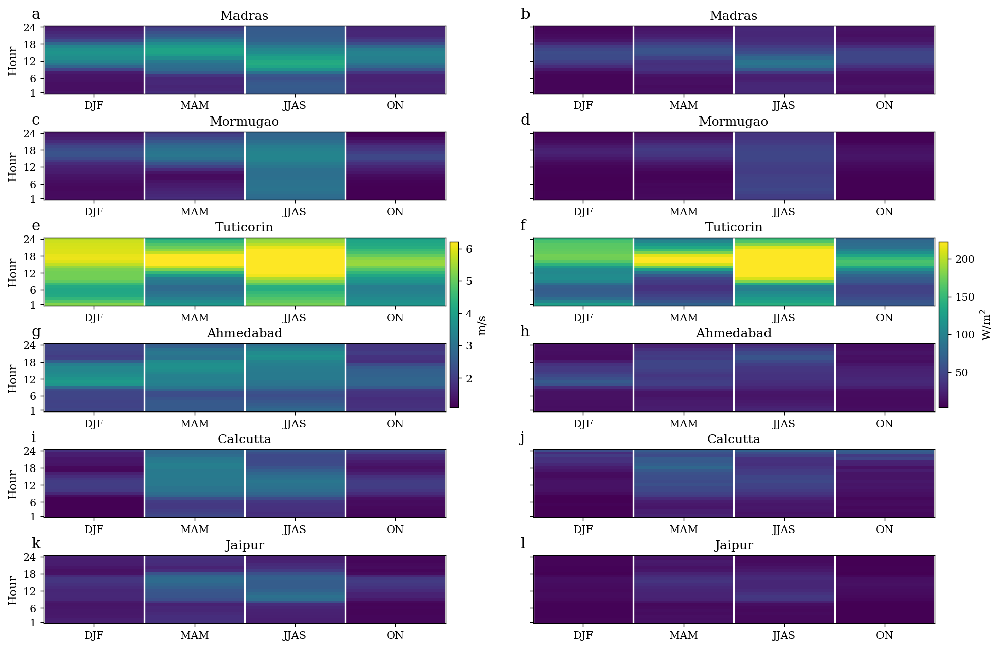

Saved: Fig_SeasonalHour_Heatmaps.png and Fig_SeasonalHour_Heatmaps.pdf


In [27]:
import numpy as np
import matplotlib.pyplot as plt

# ---- seasons ----
SEASONS = {"DJF":[12,1,2], "MAM":[3,4,5], "JJAS":[6,7,8,9], "ON":[10,11]}
SEASON_ORDER = ["DJF","MAM","JJAS","ON"]

RHO = 1.225  # kg/m^3 (used only if V needs to be derived from WPD)
MONTH_LABELS = ["Jan","Feb","Mar","Apr","May","Jun","Jul","Aug","Sep","Oct","Nov","Dec"]

def wpd_to_v_ms(P, rho=RHO):
    """Invert P = 0.5*rho*v^3 -> v = (2P/rho)^(1/3)."""
    P = np.asarray(P, float)
    V = np.full_like(P, np.nan, dtype=float)
    m = np.isfinite(P) & (P > 0)
    V[m] = (2.0 * P[m] / rho) ** (1.0/3.0)
    return V

def seasonal_hour_matrix(X_day_hour, months, season_order=SEASON_ORDER):
    """
    X_day_hour: (n_days,24)
    months: (n_days,)
    Returns M: (24,4) where columns are seasons in season_order.
    """
    M = np.full((24, len(season_order)), np.nan, dtype=float)
    for j, s in enumerate(season_order):
        sm = SEASONS[s]
        mask = np.isin(months, sm)
        if np.sum(mask) < 20:
            continue
        M[:, j] = np.nanmean(X_day_hour[mask, :], axis=0)  # mean over days, keep hour
    return M

def make_grid(nrows, ncols, fig_w=13.5, row_h=1.65, hspace=0.55, wspace=0.20, top=0.94, bottom=0.08):
    fig_h = row_h * nrows
    fig, axes = plt.subplots(nrows, ncols, figsize=(fig_w, fig_h), constrained_layout=False)
    plt.subplots_adjust(left=0.08, right=0.965, top=top, bottom=bottom, hspace=hspace, wspace=wspace)
    return fig, axes

def add_panel_labels_outside(fig, axes, start='a', fs=14, dx=0.012, dy=0.006):
    ch = ord(start)
    for ax in axes.flatten():
        bb = ax.get_position()
        fig.text(bb.x0 - dx, bb.y1 + dy, chr(ch), fontsize=fs, ha="left", va="bottom")
        ch += 1

def fig_seasonal_hour_heatmaps(cache, cities=None,
                               out_png="Fig_SeasonalHour_Heatmaps.png",
                               out_pdf="Fig_SeasonalHour_Heatmaps.pdf",
                               clip_q=(0.02, 0.98)):
    # ---- pick cities robustly ----
    if cities is None:
        cities = list(cache.keys())
    else:
        cities = [c for c in cities if c in cache]
    if len(cities) == 0:
        raise ValueError("No cities found in cache. Use cities=list(cache.keys()) or fix cache keys.")

    n = len(cities)
    fig, axes = make_grid(nrows=n, ncols=2, fig_w=13.5, row_h=1.55, hspace=0.55, wspace=0.18, top=0.93, bottom=0.08)

    # ---- precompute matrices + global color limits (shared) ----
    V_mats, P_mats = {}, {}
    allV, allP = [], []

    for city in cities:
        P = cache[city]["P"]                 # (days,24) W/m^2
        months = cache[city]["months"]       # (days,)
        # wind speed matrix (use stored V_ms if present, else derive from P)
        if "V_ms" in cache[city]:
            V = cache[city]["V_ms"]
        else:
            V = wpd_to_v_ms(P)

        MV = seasonal_hour_matrix(V, months)   # (24,4)
        MP = seasonal_hour_matrix(P, months)

        V_mats[city] = MV
        P_mats[city] = MP
        allV.append(MV[np.isfinite(MV)])
        allP.append(MP[np.isfinite(MP)])

    allV = np.concatenate(allV) if len(allV) else np.array([np.nan])
    allP = np.concatenate(allP) if len(allP) else np.array([np.nan])

    vminV, vmaxV = np.nanquantile(allV, clip_q[0]), np.nanquantile(allV, clip_q[1])
    vminP, vmaxP = np.nanquantile(allP, clip_q[0]), np.nanquantile(allP, clip_q[1])

    # ---- plot ----
    ims_left = []
    ims_right = []

    for i, city in enumerate(cities):
        axV = axes[i, 0]
        axP = axes[i, 1]

        MV = V_mats[city]  # (24,4)
        MP = P_mats[city]

        # imshow wants (rows,cols); we want y=hour (1..24) bottom->top
        imV = axV.imshow(MV, origin="lower", aspect="auto", interpolation="nearest",
                         vmin=vminV, vmax=vmaxV)
        imP = axP.imshow(MP, origin="lower", aspect="auto", interpolation="nearest",
                         vmin=vminP, vmax=vmaxP)

        ims_left.append(imV); ims_right.append(imP)

        # axis formatting
        for ax in (axV, axP):
            ax.set_yticks([0, 5, 11, 17, 23])
            ax.set_yticklabels(["1","6","12","18","24"])
            ax.set_xticks(range(len(SEASON_ORDER)))
            ax.set_xticklabels(SEASON_ORDER)
            ax.tick_params(labelsize=10)

            # subtle separators between seasons
            ax.set_xticks(np.arange(-0.5, len(SEASON_ORDER), 1), minor=True)
            ax.grid(which="minor", axis="x", color="white", linewidth=1.6)
            ax.tick_params(which="minor", bottom=False)

        axV.set_ylabel("Hour", fontsize=11)
        axV.set_title(city, fontsize=12, pad=6)
        axP.set_title(city, fontsize=12, pad=6)

        # hide y labels on right column to declutter
        axP.set_yticklabels([])

    # # column headers
    # axes[0,0].text(0.5, 1.18, "Mean wind speed", transform=axes[0,0].transAxes,
    #                ha="center", va="bottom", fontsize=12)
    # axes[0,1].text(0.5, 1.18, "Mean wind power density", transform=axes[0,1].transAxes,
    #                ha="center", va="bottom", fontsize=12)

    add_panel_labels_outside(fig, axes, start="a", fs=14)

    # shared colorbars (one per column)
    cbarV = fig.colorbar(ims_left[0], ax=axes[:,0].ravel().tolist(),
                         orientation="vertical", fraction=0.020, pad=0.01)
    cbarV.set_label("m/s", fontsize=11)
    cbarV.ax.tick_params(labelsize=10)

    cbarP = fig.colorbar(ims_right[0], ax=axes[:,1].ravel().tolist(),
                         orientation="vertical", fraction=0.020, pad=0.01)
    cbarP.set_label("W/m$^2$", fontsize=11)
    cbarP.ax.tick_params(labelsize=10)

    fig.savefig(out_png, dpi=600, bbox_inches="tight")
    fig.savefig(out_pdf, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png, "and", out_pdf)

# ---- RUN ----
cities = ["Madras","Mormugao","Tuticorin","Ahmedabad","Calcutta","Jaipur"]  # or list(cache.keys())
fig_seasonal_hour_heatmaps(cache, cities,
                           out_png="Fig_SeasonalHour_Heatmaps.png",
                           out_pdf="Fig_SeasonalHour_Heatmaps.pdf")


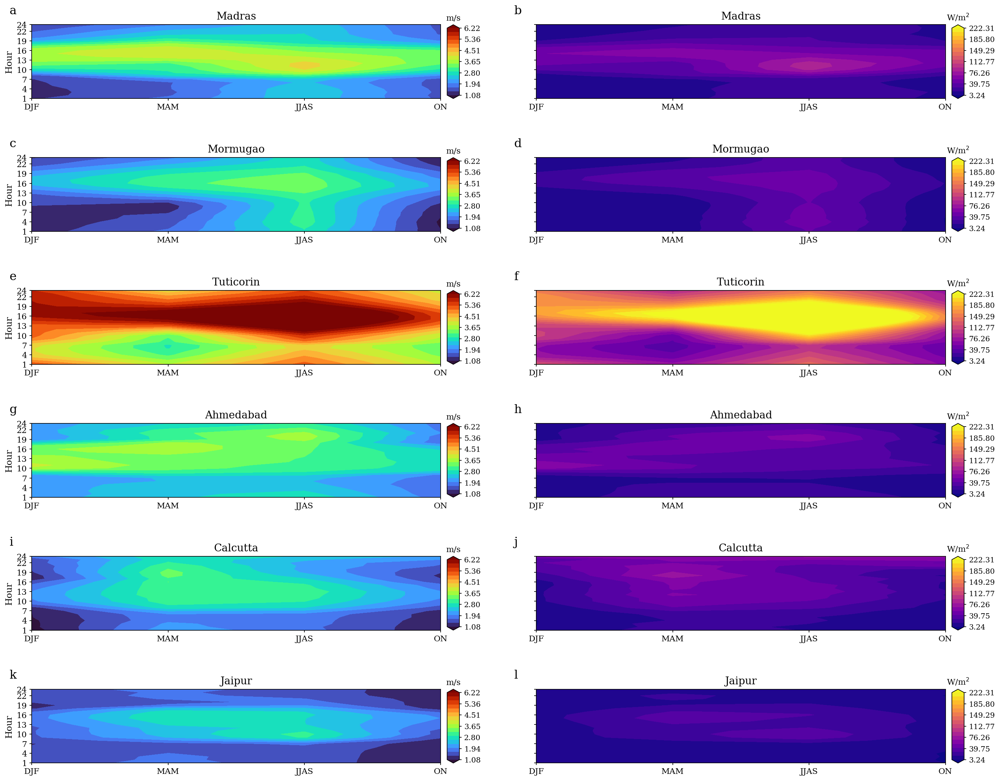

Saved: Fig_SeasonalContours_6sites_v3.png and Fig_SeasonalContours_6sites_v3.pdf


In [38]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.ticker import FormatStrFormatter

# =========================
# Seasonal contour figure (paper aesthetics)
# + Different colormaps per variable:
#   - wind speed: turbo (default)
#   - WPD: magma (or any contrasting cmap you choose)
# =========================

SEASONS = {"DJF":[12,1,2], "MAM":[3,4,5], "JJAS":[6,7,8,9], "ON":[10,11]}
SEASON_ORDER = ["DJF","MAM","JJAS","ON"]
RHO = 1.225  # kg/m^3

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],
    "font.size": 12,
    "axes.linewidth": 0.85,
    "xtick.major.width": 0.85,
    "ytick.major.width": 0.85,
    "xtick.major.size": 3.0,
    "ytick.major.size": 3.0,
})

plt.rcParams.update({
    "font.size": 16,          # base font
    "axes.titlesize": 20,      # panel titles (city names)
    "axes.labelsize": 18,      # "Hour"
    "xtick.labelsize": 16,     # x tick labels (DJF/MAM/...)
    "ytick.labelsize": 16,     # y tick labels (1..24)
    "legend.fontsize": 16,
})

def wpd_to_v_ms(P, rho=RHO):
    P = np.asarray(P, float)
    V = np.full_like(P, np.nan, dtype=float)
    m = np.isfinite(P) & (P > 0)
    V[m] = (2.0 * P[m] / rho) ** (1.0/3.0)
    return V

def seasonal_hour_matrix(X_day_hour, months):
    M = np.full((24, len(SEASON_ORDER)), np.nan, dtype=float)
    for j, s in enumerate(SEASON_ORDER):
        sm = SEASONS[s]
        mask = np.isin(months, sm)
        if mask.sum() < 20:
            continue
        M[:, j] = np.nanmean(X_day_hour[mask, :], axis=0)
    return M

def fill_missing_cols(M):
    A = M.copy()
    valid = [j for j in range(A.shape[1]) if np.isfinite(A[:, j]).any()]
    if len(valid) == 0:
        return A
    for j in range(A.shape[1]):
        if j in valid:
            continue
        nn = min(valid, key=lambda k: abs(k - j))
        A[:, j] = A[:, nn]
    if np.isnan(A).any():
        row_med = np.nanmedian(A, axis=1)
        for r in range(A.shape[0]):
            A[r, np.isnan(A[r, :])] = row_med[r]
    return A

def add_panel_labels(fig, axes, start='a', fs=16, dx=0.022, dy=0.010):
    ch = ord(start)
    for ax in axes.flatten():
        bb = ax.get_position()
        fig.text(bb.x0 - dx, bb.y1 + dy, chr(ch), fontsize=fs, ha="left", va="bottom")
        ch += 1

def _cbar_label_on_top(cb, label, fontsize=11, pad=6):
    cb.ax.set_title(label, fontsize=fontsize, pad=pad)

def seasonal_contour_figure(cache, cities,
                           out_png="Fig_SeasonalContours_6sites_v3.png",
                           out_pdf="Fig_SeasonalContours_6sites_v3.pdf",
                           clip_q=(0.02, 0.98),
                           n_levels=18,
                           cmap_speed="turbo",
                           cmap_wpd="magma",        # <-- change to "inferno", "viridis", "cividis", etc.
                           cbar_ticks=7):

    cities = [c for c in cities if c in cache]
    if len(cities) == 0:
        raise ValueError("No matching city keys in cache.")

    # --- seasonal matrices + global limits ---
    V_mats, P_mats = {}, {}
    allV, allP = [], []

    for city in cities:
        P = cache[city]["P"]
        months = cache[city]["months"]
        V = cache[city].get("V_ms", None)
        if V is None:
            V = wpd_to_v_ms(P)

        MV = fill_missing_cols(seasonal_hour_matrix(V, months))
        MP = fill_missing_cols(seasonal_hour_matrix(P, months))

        V_mats[city] = MV
        P_mats[city] = MP
        allV.append(MV[np.isfinite(MV)])
        allP.append(MP[np.isfinite(MP)])

    allV = np.concatenate(allV)
    allP = np.concatenate(allP)

    vminV, vmaxV = np.nanquantile(allV, clip_q[0]), np.nanquantile(allV, clip_q[1])
    vminP, vmaxP = np.nanquantile(allP, clip_q[0]), np.nanquantile(allP, clip_q[1])

    levelsV = np.linspace(vminV, vmaxV, n_levels)
    levelsP = np.linspace(vminP, vmaxP, n_levels)

    # --- bigger panels + spacing ---
    nrows = len(cities)
    fig_w = 19.0
    row_h = 2.55
    fig_h = row_h * nrows

    fig, axes = plt.subplots(nrows, 2, figsize=(fig_w, fig_h), constrained_layout=False)
    plt.subplots_adjust(left=0.065, right=0.985, top=0.965, bottom=0.06, hspace=0.80, wspace=0.18)

    x = np.arange(1, len(SEASON_ORDER)+1)
    y = np.arange(1, 25)
    X, Y = np.meshgrid(x, y)

    cmapV = plt.get_cmap(cmap_speed)
    cmapP = plt.get_cmap(cmap_wpd)

    yticks = [1, 4, 7, 10, 13, 16, 19, 22, 24]

    for i, city in enumerate(cities):
        axV = axes[i, 0]
        axP = axes[i, 1]

        MV = V_mats[city]
        MP = P_mats[city]

        cfV = axV.contourf(X, Y, MV, levels=levelsV, cmap=cmapV, extend="both")
        cfP = axP.contourf(X, Y, MP, levels=levelsP, cmap=cmapP, extend="both")

        for ax in (axV, axP):
            ax.set_ylim(1, 24)
            ax.set_yticks(yticks)
            ax.set_xlim(1, len(SEASON_ORDER))
            ax.set_xticks(x)
            ax.set_xticklabels(SEASON_ORDER)
            ax.tick_params(labelsize=11)

        axV.set_title(city, fontsize=14, pad=7)
        axP.set_title(city, fontsize=14, pad=7)
        axV.set_ylabel("Hour", fontsize=12)
        axP.set_yticklabels([])

        # per-panel colorbars: unit on top + 2-decimal ticks
        divV = make_axes_locatable(axV)
        caxV = divV.append_axes("right", size="3.0%", pad=0.12)
        cbV = fig.colorbar(cfV, cax=caxV)
        _cbar_label_on_top(cbV, "m/s", fontsize=11, pad=6)
        cbV.ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
        cbV.set_ticks(np.linspace(vminV, vmaxV, cbar_ticks))
        cbV.ax.tick_params(labelsize=10, width=0.85, length=2.8)

        divP = make_axes_locatable(axP)
        caxP = divP.append_axes("right", size="3.0%", pad=0.12)
        cbP = fig.colorbar(cfP, cax=caxP)
        _cbar_label_on_top(cbP, r"W/m$^2$", fontsize=11, pad=6)
        cbP.ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
        cbP.set_ticks(np.linspace(vminP, vmaxP, cbar_ticks))
        cbP.ax.tick_params(labelsize=10, width=0.85, length=2.8)

    add_panel_labels(fig, axes, start='a', fs=16, dx=0.022, dy=0.010)

    fig.savefig(out_png, dpi=600, bbox_inches="tight")
    fig.savefig(out_pdf, dpi=600, bbox_inches="tight")
    plt.show()
    print("Saved:", out_png, "and", out_pdf)

# ---- RUN ----
cities = ["Madras","Mormugao","Tuticorin","Ahmedabad","Calcutta","Jaipur"]
seasonal_contour_figure(
    cache, cities,
    out_png="Fig_SeasonalContours_6sites_v3.png",
    out_pdf="Fig_SeasonalContours_6sites_v3.pdf",
    clip_q=(0.02, 0.98),
    n_levels=18,
    cmap_speed="turbo",
    cmap_wpd="plasma",   # try: "inferno", "viridis", "cividis", "plasma"
    cbar_ticks=7
)
